# Importing the libraries

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn import preprocessing
from sklearn.preprocessing import Normalizer,MinMaxScaler
from scipy.cluster.hierarchy import dendrogram, ward
from scipy.cluster.hierarchy import fcluster
from sklearn.metrics import silhouette_samples
from matplotlib import cm
from sklearn.manifold import TSNE

import warnings
warnings.filterwarnings('ignore')

# Importing the data

In [12]:
!pip install openpyxl

In [13]:
data = pd.read_excel('innercity.xlsx')

In [14]:
data.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,20150427T000000,600000,4.0,1.75,3050.0,9440.0,1,0,0.0,...,1250.0,1966,0,98034,47.7228,-122.183,2020.0,8660.0,0.0,12490
1,3145600250,20150317T000000,190000,2.0,1.00,670.0,3101.0,1,0,0.0,...,0.0,1948,0,98118,47.5546,-122.274,1660.0,4100.0,0.0,3771
2,7129303070,20140820T000000,735000,4.0,2.75,3040.0,2415.0,2,1,4.0,...,0.0,1966,0,98118,47.5188,-122.256,2620.0,2433.0,0.0,5455
3,7338220280,20141010T000000,257000,3.0,2.50,1740.0,3721.0,2,0,0.0,...,0.0,2009,0,98002,47.3363,-122.213,2030.0,3794.0,0.0,5461
4,7950300670,20150218T000000,450000,2.0,1.00,1120.0,4590.0,1,0,0.0,...,0.0,1924,0,98118,47.5663,-122.285,1120.0,5100.0,0.0,5710


In [15]:
data.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area'],
      dtype='object')

In [16]:
%%time
start='\033[1m'
end='\033[0;0m'

CPU times: total: 0 ns
Wall time: 0 ns


In [17]:
print(start+'Shape of the Dataframe:'+end,data.shape,'\n')

Shape of the Dataframe: (21613, 23) 



In [18]:
print(start+'Summary Of the dataframe:'+end,'\n')
print(data.info(),'\n')

Summary Of the dataframe: 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  int64  
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  int64  
 3   room_bed          21505 non-null  float64
 4   room_bath         21505 non-null  float64
 5   living_measure    21596 non-null  float64
 6   lot_measure       21571 non-null  float64
 7   ceil              21571 non-null  object 
 8   coast             21612 non-null  object 
 9   sight             21556 non-null  float64
 10  condition         21556 non-null  object 
 11  quality           21612 non-null  float64
 12  ceil_measure      21612 non-null  float64
 13  basement          21612 non-null  float64
 14  yr_built          21612 non-null  object 
 15  yr_renovated      21613 non-null  int64  
 16  zipcode     

# Variable transformation

#### Relacing the unwanted symbol and nan value with numpy nan values which we are going to deal in missing value

In [19]:
data['ceil']= data['ceil'].replace('$',np.nan)
data['coast']= data['coast'].replace('$',np.nan)
data['condition'] = data['condition'].replace('$',np.nan)
data['condition'] = data['condition'].replace('nan',np.nan)
data['yr_built'] = data['yr_built'].replace('$',np.nan)
data['total_area']=data['total_area'].replace('$',np.nan)
data['long']=data['long'].replace('$',np.nan)

In [20]:
data['ceil']=data['ceil'].astype('float')
data['coast']=data['coast'].astype('float')
data['total_area']=data['total_area'].astype('float')
data['long']=data['long'].astype('float')
data['condition']=data['condition'].astype('int', errors='ignore')
data['yr_built']=data['yr_built'].astype('int',errors='ignore')

# Checking the datatype after transforming and null values in the data

In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  int64  
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  int64  
 3   room_bed          21505 non-null  float64
 4   room_bath         21505 non-null  float64
 5   living_measure    21596 non-null  float64
 6   lot_measure       21571 non-null  float64
 7   ceil              21541 non-null  float64
 8   coast             21582 non-null  float64
 9   sight             21556 non-null  float64
 10  condition         21528 non-null  float64
 11  quality           21612 non-null  float64
 12  ceil_measure      21612 non-null  float64
 13  basement          21612 non-null  float64
 14  yr_built          21598 non-null  float64
 15  yr_renovated      21613 non-null  int64  
 16  zipcode           21613 non-null  int64 

In [22]:
print(start+'Checking for Null values in the dataframe:'+end,'\n',data.isnull().sum(),'\n')

Checking for Null values in the dataframe: 
 cid                   0
dayhours              0
price                 0
room_bed            108
room_bath           108
living_measure       17
lot_measure          42
ceil                 72
coast                31
sight                57
condition            85
quality               1
ceil_measure          1
basement              1
yr_built             15
yr_renovated          0
zipcode               0
lat                   0
long                 34
living_measure15    166
lot_measure15        29
furnished            29
total_area           68
dtype: int64 



In [23]:
print(start+'Columns in dataframe:'+end,data.columns)

Columns in dataframe: Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area'],
      dtype='object')


# Dealing with missing value using simple imputer

### Filling the missing value in categorical variable using Mode


In [24]:
for i in ['furnished','quality', 'condition', 'coast', 'ceil', 'sight', 'yr_renovated']:
    data[i] = data[i].fillna(data[i].mode()[0])


### Filling the missing value in numerical variable using Median

In [25]:
data.drop(['cid','dayhours','furnished','quality', 'condition', 'coast', 'ceil', 'sight', 'yr_renovated'],axis=1).columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil_measure', 'basement', 'yr_built', 'zipcode', 'lat', 'long',
       'living_measure15', 'lot_measure15', 'total_area'],
      dtype='object')

In [26]:
for i in data.drop(['cid','dayhours','furnished','quality', 'condition', 'coast', 'ceil', 'sight', 'yr_renovated'],axis=1).columns.values:
    data[i] = data[i].fillna(data[i].median())
    
df = data.copy()

In [27]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  int64  
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  int64  
 3   room_bed          21613 non-null  float64
 4   room_bath         21613 non-null  float64
 5   living_measure    21613 non-null  float64
 6   lot_measure       21613 non-null  float64
 7   ceil              21613 non-null  float64
 8   coast             21613 non-null  float64
 9   sight             21613 non-null  float64
 10  condition         21613 non-null  float64
 11  quality           21613 non-null  float64
 12  ceil_measure      21613 non-null  float64
 13  basement          21613 non-null  float64
 14  yr_built          21613 non-null  float64
 15  yr_renovated      21613 non-null  int64  
 16  zipcode           21613 non-null  int64 

In [28]:

# from sklearn.impute import SimpleImputer
# my_imputer = SimpleImputer(strategy = 'median')
# data_new = my_imputer.fit_transform(data.drop(['dayhours'],axis=1))


In [29]:
# data.drop(['dayhours','furnished','quality', 'condition', 'coast', 'ceil', 'sight', 'yr_renovated'],axis=1).columns.values

In [30]:
# df= pd.DataFrame(data_new,columns=data.drop(['dayhours'],axis=1).columns)
# df

In [31]:
# df['dayhours']=data['dayhours']

# Looking into the values in each column

In [32]:
#function for getting insigt for each column values
def values_in_columns(df):
    for i in df.columns:
        print(start+'Column Name--->'+i+end)
        print('Number of Unique Values',df[i].nunique(),'\n')
        print('Count of each unique value \n',df[i].value_counts(),'\n')

In [33]:
values_in_columns(df)

Column Name--->cid
Number of Unique Values 21436 

Count of each unique value 
 795000620     3
5101405604    2
9809000020    2
7853420110    2
6021500970    2
             ..
7871500485    1
2022069200    1
9808630120    1
7302000210    1
8805900430    1
Name: cid, Length: 21436, dtype: int64 

Column Name--->dayhours
Number of Unique Values 372 

Count of each unique value 
 20140623T000000    142
20140625T000000    131
20140626T000000    131
20140708T000000    127
20150427T000000    126
                  ... 
20150515T000000      1
20150110T000000      1
20140803T000000      1
20150131T000000      1
20140830T000000      1
Name: dayhours, Length: 372, dtype: int64 

Column Name--->price
Number of Unique Values 3625 

Count of each unique value 
 450000    172
350000    172
550000    159
500000    152
425000    150
         ... 
919000      1
364988      1
362764      1
849900      1
685530      1
Name: price, Length: 3625, dtype: int64 

Column Name--->room_bed
Number of Unique Value

# Dropping the dupplicates values if any

In [34]:
# function for dropping duplicates        
def duplicate(df):
    if df.duplicated().sum()>0:
        print(start+'Dataframe contains duplicate values'+end,df.duplicated().sum())
        df.drop_duplicates(inplace=True,ignore_index=True)
        print('Details of dataframe after droping the Duplicate rows')
        details(df)
    else:
        print("Dataframe doesn't contains dublicate Values")

In [35]:
duplicate(df)

Dataframe doesn't contains dublicate Values


# Analyzing the data

In [36]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
cid,21613.0,4.580302e+09,2.876566e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21613.0,5.401822e+05,3.673622e+05,7.500000e+04,3.219500e+05,4.500000e+05,6.450000e+05,7.700000e+06
room_bed,21613.0,3.369500e+00,9.283307e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
room_bath,21613.0,2.115845e+00,7.683799e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
living_measure,21613.0,2.079727e+03,9.181472e+02,2.900000e+02,1.430000e+03,1.910000e+03,2.550000e+03,1.354000e+04
lot_measure,21613.0,1.509003e+04,4.138466e+04,5.200000e+02,5.043000e+03,7.618000e+03,1.066000e+04,1.651359e+06
ceil,21613.0,1.492481e+00,5.397630e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
coast,21613.0,7.449220e-03,8.598879e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
sight,21613.0,2.337482e-01,7.655206e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21613.0,3.407718e+00,6.499332e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


<ol>
    <li><b>CID:</b> House ID/Property ID.Not used for analysis</li>
    <li><b>Dayhours:</b> 5 factor analysis is reflecting for this column</li>
    <li><b>price:</b> Our taget column value is in 75k - 7700k range. As Mean > Median, it's <b>rightly skewed</b>.</li>
    <li><b>room_bed:</b> Number of bedrooms range from 0 - 33. As Mean slightly > Median, it's <b>slightly rightly skewed.</b></li>
    <li><b>room_bath:</b> Number of bathrooms range from 0 - 8. As Mean slightly &lt; Median, it's <b>slightly leftly skewed</b>.</li>
    <li><b>living_measure:</b> Square footage of house range from 290 - 13,540. As Mean > Median, it's <b>rightly skewed</b>.</li>
    <li><b>lot_measure:</b> Square footage of lot range from 520 - 16,51,359. As Mean almost double of Median, it's <b>Hightly rightly skewed</b>.</li>
    <li><b>ceil:</b> Number of floors range from 1 - 3.5 As Mean ~ Median, it's <b>almost Normal Distributed</b>.</li>
    <li><b>coast:</b> As this value represent whether house has waterfront view or not. It's <b>categorical column</b>. From above analysis we got know, very few houses has waterfront view.</li>
    <li><b>sight:</b> Value ranges from 0 - 4. As Mean > Median, it's <b>rightly skewed</b></li>
    <li><b>condition:</b> Represents rating of house which ranges from 1 - 5. As Mean > Median, it's <b>rightly skewed</b></li>
    <li><b>quality:</b> Representign grade given to house which range from 1 - 13. As Mean > Median, it's <b>rightly skewed</b>.</li>
    <li><b>ceil_measure:</b> Square footage of house apart from basement ranges in 290 - 9,410. As Mean > Median, it's <b>rightly skewed</b>.</li>
    <li><b>basement:</b> Square footage house basement ranges in 0 - 4,820. As Mean highlty > Median, it's <b>Highly rightly skewed</b>.</li>
    <li><b>yr_built:</b> House built year ranges from 1900 - 2015. As Mean &lt; Median, it's <b>leftly skewed</b>.</li>
    <li><b>yr_renovated:</b> House renovation year only 2015. So this column can be used as <b>Categorical Variable</b> for knowing whether house is renovated or not.</li>
    <li><b>zipcode:</b> House ZipCode ranges from 98001 - 98199. As Mean > Median, it's <b>rightly skewed</b>.</li>
    <li><b>lat:</b> Lattitude ranges from 47.1559 - 47.7776 As Mean &lt; Median, it's <b>leftly skewed</b>.</li>
    <li><b>long:</b> Longittude ranges from -122.5190 to -121.315 As Mean > Median, it's <b>rightly skewed</b>.</li>
    <li><b>living_measure15:</b> Value ragnes from 399 to 6,210. As Mean > Median, it's <b>rightly skewed</b>.</li>
    <li><b>lot_measure15:</b> Value ragnes from 651 to 8,71,200. As Mean highly > Median, it's <b>Highly rightly skewed</b>.</li>
    <li><b>furnished:</b> Representing whether house is furnished or not. It's a <b>Categorical Variable</b></li>
    <li><b>total_area</b> Total area of house ranges from 1,423 to 16,52,659. As Mean is almost double of Median, it's <b>Highly rightly skewed</b></li>
</ol>


### Univariate Analysis - By BoxPlot

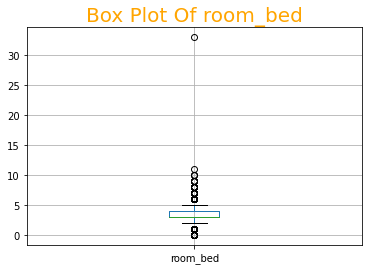

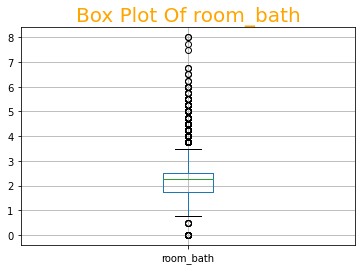

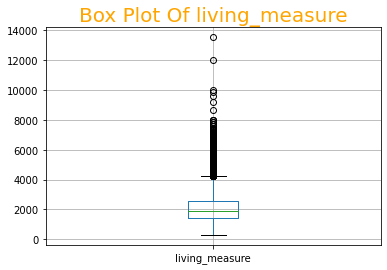

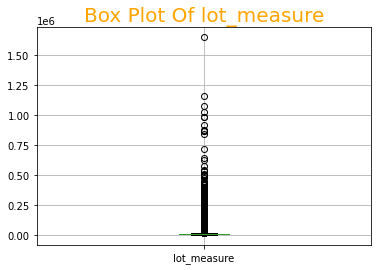

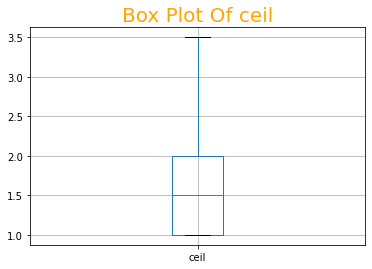

...

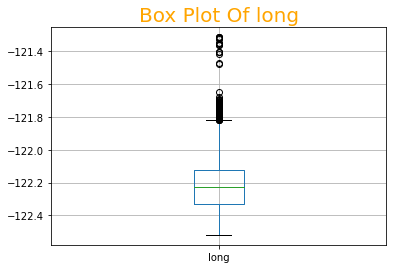

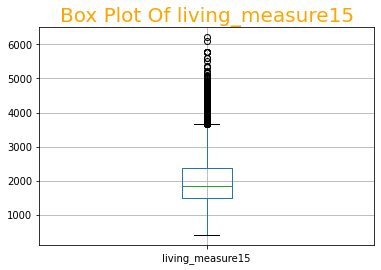

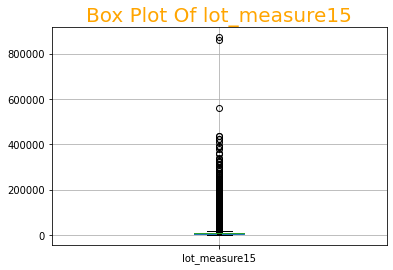

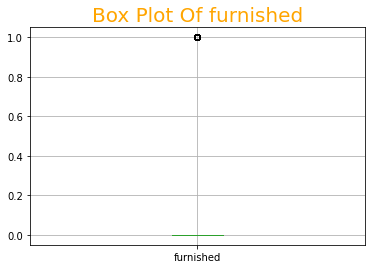

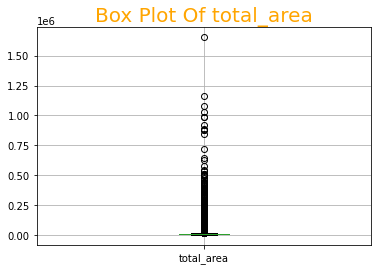

In [37]:
# boxplot all the numerical columns and see if there any outliers
for i in df.drop(['dayhours'],axis=1).iloc[:, 2:].columns:
    df.iloc[:, 1:].boxplot(column=i)
    plt.title(f"Box Plot Of {i}" , fontsize=20,
          color="orange")
    plt.show()

There are lots of feature which are having outliers. 

# Analysis of CID

In [38]:
cid_count=df.cid.value_counts()
cid_count[cid_count>1].shape[0]

176

There are multiple properties which are sold multiple times.

# Analysis of dayhours

### Adding a new column for analyzing the data on month and year level

In [39]:
# converting the new dataframe for modeling purpose and converting the dayhours into month-year for further analysis

df_new=df.copy()
df.dayhours=df.dayhours.str.replace('T000000', "")
df.dayhours=pd.to_datetime(df.dayhours,format='%Y%m%d')
df['month/year']=df['dayhours'].apply(lambda x: x.strftime('%B/%Y'))


In [40]:
df['month/year'].value_counts()

April/2015        2231
July/2014         2211
June/2014         2180
August/2014       1940
October/2014      1878
March/2015        1875
September/2014    1774
May/2014          1768
December/2014     1471
November/2014     1411
February/2015     1250
January/2015       978
May/2015           646
Name: month/year, dtype: int64

<AxesSubplot:title={'center':'Analysis of DayHours'}, xlabel='month/year', ylabel='count'>

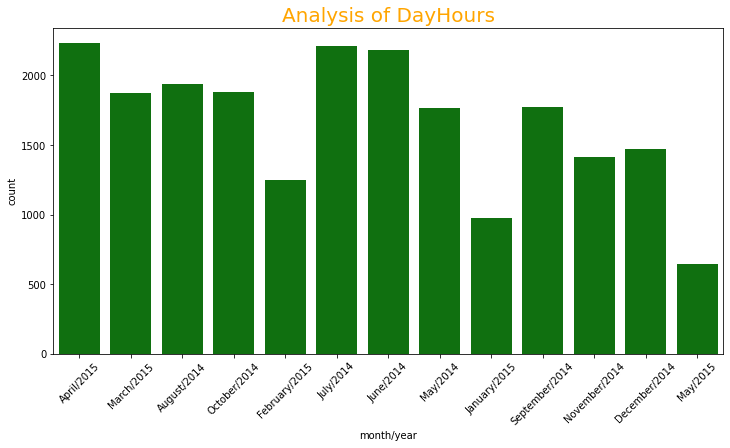

In [41]:
plt.figure(figsize=(12,6))
plt.xticks(rotation = 45)
plt.title(f"Analysis of DayHours" , fontsize=20,
          color="orange")
sns.countplot(df['month/year'],color='green')

From the above, we can conclude that in april 2015 and june and july of 2014 most houses are sold

In [42]:
df.groupby(['month/year'])['price'].agg('mean')

month/year
April/2015        561933.463021
August/2014       536527.039691
December/2014     524602.893270
February/2015     507919.603200
January/2015      525963.251534
July/2014         544892.161013
June/2014         558123.736239
March/2015        544057.683200
May/2014          548166.600113
May/2015          558193.095975
November/2014     522058.861800
October/2014      539127.477636
September/2014    529315.868095
Name: price, dtype: float64

April month have the highest mean price in the time line of the sales of the properties is from May-2014 to May-2015

# Univariant Analysis of each column

# Analysis of room_bed

In [43]:
df['room_bed'].value_counts()

3.0     9875
4.0     6854
2.0     2747
5.0     1595
6.0      270
1.0      197
7.0       38
8.0       13
0.0       13
9.0        6
10.0       3
33.0       1
11.0       1
Name: room_bed, dtype: int64

The value of 33 seems to be outlier we need to check the data point before imputing the same 

In [44]:
df[df['room_bed']==33]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,month/year
16913,2402100895,2014-06-25,640000,33.0,1.75,1620.0,6000.0,1.0,0.0,0.0,...,1947.0,0,98103,47.6878,-122.331,1330.0,4700.0,0.0,7620.0,June/2014


We will remove ie later because it is a oultlier

Text(0.5, 1.0, 'Analysis of room_bed')

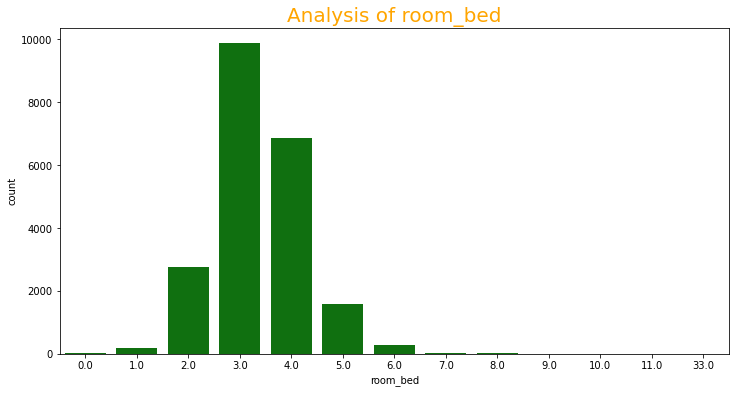

In [45]:
plt.figure(figsize=(12,6))
sns.countplot(df.room_bed,color='green')
plt.title(f"Analysis of room_bed" , fontsize=20,
          color="orange")

Most of the houses have 3 or 4 bedrooms

# Analysis of room_bath

Text(0.5, 1.0, 'Analysis of room_bath')

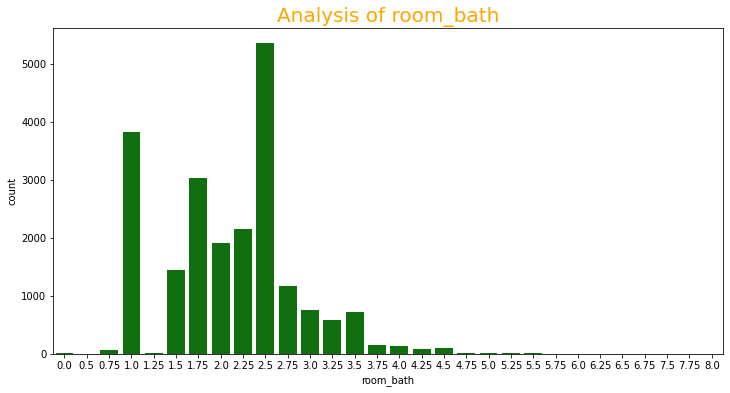

In [46]:
plt.figure(figsize=(12,6))
sns.countplot(df.room_bath,color='green')
df['room_bath'].value_counts().sort_index()
plt.title(f"Analysis of room_bath" , fontsize=20,
          color="orange")

Majority of the houses have bathroom in the range of 1.0 to 2.5

Skewness is : 0.5102509663719975


Text(0.5, 1.0, 'Analysis of room_bath - Skweness')

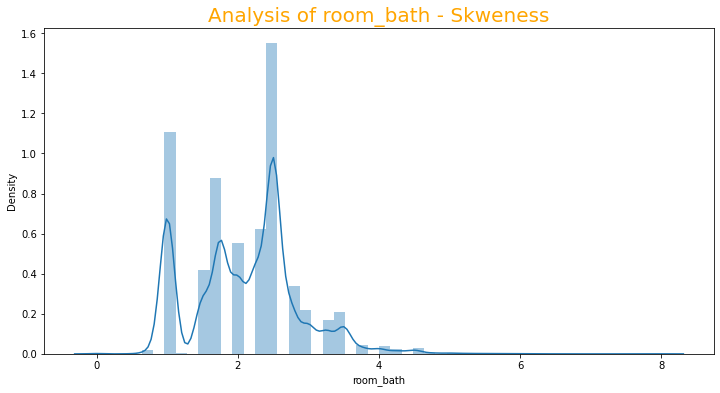

In [47]:
plt.figure(figsize=(12,6))
print("Skewness is :",df.room_bath.skew())
sns.distplot(df.room_bath)
plt.title(f"Analysis of room_bath - Skweness" , fontsize=20,
          color="orange")

# Analysis of Living measure

Skewness is : 1.4735169838222357


Text(0.5, 1.0, 'Analysis of Living Measure - Skweness')

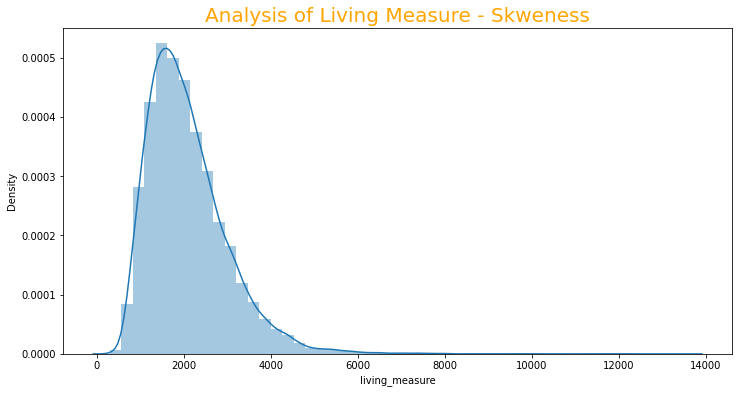

In [48]:
#Data is skewed as visible from plot, as its distribution is normal
plt.figure(figsize=(12,6))
print("Skewness is :",df.living_measure.skew())
sns.distplot(df.living_measure)
df.living_measure.describe()
plt.title(f"Analysis of Living Measure - Skweness" , fontsize=20,
          color="orange")

data is rightly skewed

Text(0.5, 1.0, 'Analysis of Living Measure - Box Plot')

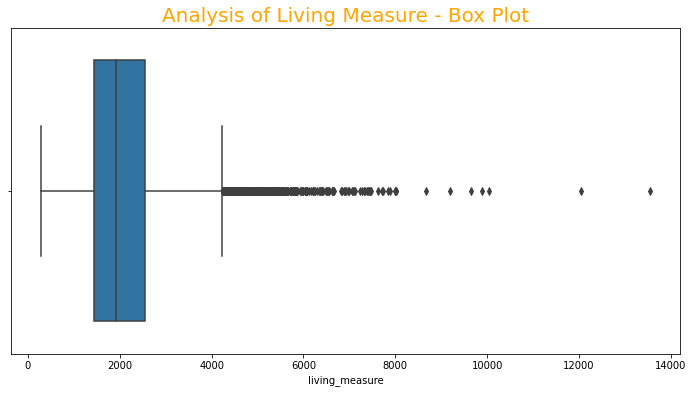

In [49]:
#boxplot for living_measure
plt.figure(figsize=(12,6))
sns.boxplot(df.living_measure)
plt.title(f"Analysis of Living Measure - Box Plot" , fontsize=20,
          color="orange")

There are many outliers in living measure. We will handle them later

In [50]:
# checking the no. of data points with Living measure greater than 8000
df[df['living_measure']>8000]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,month/year
1068,6762700020,2014-10-13,7700000,6.0,8.00,12050.0,27600.0,2.5,0.0,3.0,...,1910.0,1987,98102,47.6298,-122.323,3940.0,8800.0,1.0,39650.0,October/2014
1245,1924059029,2014-06-17,4670000,5.0,6.75,9640.0,13068.0,1.0,1.0,4.0,...,1983.0,2009,98040,47.5570,-122.210,3270.0,10454.0,1.0,22708.0,June/2014
7928,1225069038,2014-05-05,2280000,7.0,8.00,13540.0,307752.0,3.0,0.0,4.0,...,1999.0,0,98053,47.6675,-121.986,4850.0,217800.0,1.0,321292.0,May/2014
10639,9208900037,2014-09-19,6890000,6.0,7.75,9890.0,31374.0,2.0,0.0,4.0,...,2001.0,0,98039,47.6305,-122.230,4540.0,42730.0,1.0,41264.0,September/2014
10718,9808700762,2014-06-11,7060000,5.0,4.50,10040.0,37325.0,2.0,1.0,2.0,...,1940.0,2001,98004,47.6500,-122.214,3930.0,25449.0,1.0,47365.0,June/2014
12794,2470100110,2014-08-04,5570000,5.0,5.75,9200.0,35069.0,2.0,0.0,0.0,...,2001.0,0,98039,47.6289,-122.233,3560.0,24345.0,1.0,44269.0,August/2014
20038,1247600105,2014-10-20,5110000,5.0,5.25,8010.0,45517.0,2.0,1.0,4.0,...,1999.0,0,98033,47.6767,-122.211,3430.0,26788.0,1.0,53527.0,October/2014
20193,2303900035,2014-06-11,2890000,5.0,6.25,8670.0,64033.0,2.0,0.0,4.0,...,1965.0,2003,98177,47.7295,-122.372,4140.0,81021.0,1.0,72703.0,June/2014
20746,6072800246,2014-07-02,3300000,5.0,6.25,8020.0,21738.0,2.0,0.0,0.0,...,2001.0,0,98006,47.5675,-122.189,4160.0,18969.0,1.0,29758.0,July/2014


We have only 9 houses which have more than 8k living_measure. We will treat them as outliers

# Analysis of lot_measure

Skewness is : 13.084880210575367


Text(0.5, 1.0, 'Analysis of Lot Measure - Box Plot')

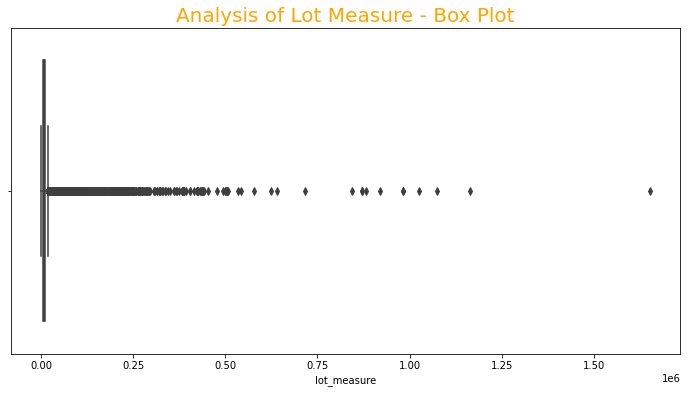

In [51]:
plt.figure(figsize=(12,6))
print("Skewness is :",df.lot_measure.skew())
sns.boxplot(df.lot_measure)
df.lot_measure.describe()
plt.title(f"Analysis of Lot Measure - Box Plot" , fontsize=20,
          color="orange")

Data is skewed as visible from plot

In [52]:
# checking the no. of data points with Lot measure greater than 1250000
df[df['lot_measure']>1250000]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,month/year
11674,1020069017,2015-03-27,700000,4.0,1.0,1300.0,1651359.0,1.0,0.0,3.0,...,1920.0,0,98022,47.2313,-122.023,2560.0,425581.0,0.0,1652659.0,March/2015


We have only 1 property with more than 12,50,000 lot_measure. We will treat as outlier

# Analysis of ceil

In [53]:
df.ceil.value_counts()

1.0    10719
2.0     8210
1.5     1905
3.0      610
2.5      161
3.5        8
Name: ceil, dtype: int64

most houses have 1 floor

Text(0.5, 1.0, 'Analysis of ceil')

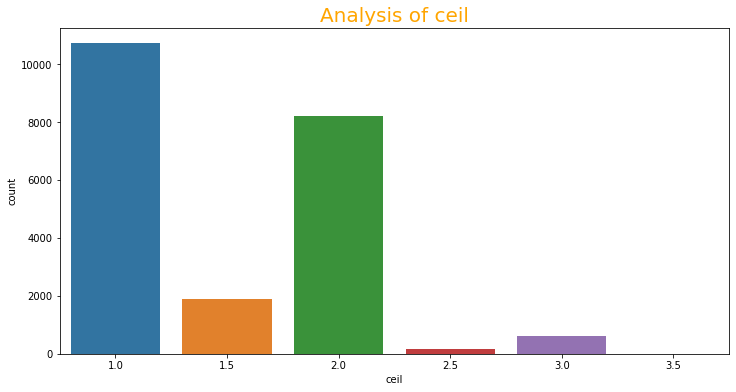

In [54]:
plt.figure(figsize=(12,6))
sns.countplot('ceil',data=df)
plt.title(f"Analysis of ceil" , fontsize=20,
          color="orange")

Most houses have 1 and 2 floors

# Analysis of coast

In [55]:
df.coast.value_counts()

0.0    21452
1.0      161
Name: coast, dtype: int64

most houses don't have waterfront view, very few are waterfront

# Analysis of sight

In [56]:
df.sight.value_counts()

0.0    19494
2.0      959
3.0      510
1.0      332
4.0      318
Name: sight, dtype: int64

Most sights have not been viewed 

# Analysis of condition

In [57]:
df.condition.value_counts()

3.0    14063
4.0     5655
5.0     1694
2.0      171
1.0       30
Name: condition, dtype: int64

#Overall most houses are rated as 3 and above for its condition overall

# Analysis of quality 

Text(0.5, 1.0, 'Analysis of quality')

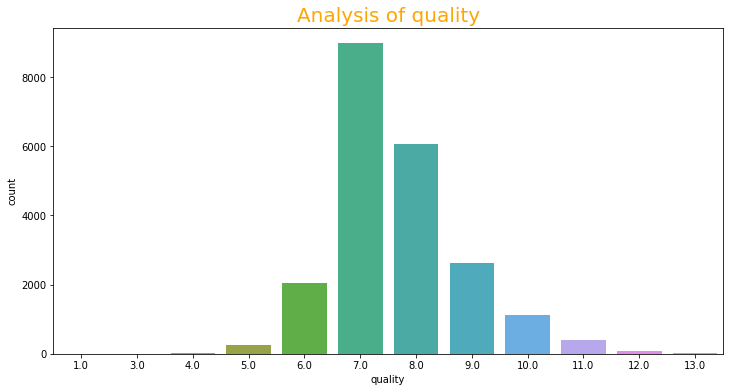

In [58]:
df.quality.value_counts()
plt.figure(figsize=(12,6))
sns.countplot('quality',data=df)
plt.title(f"Analysis of quality" , fontsize=20,
          color="orange")

Most properties have quality rating between 6 to 10

In [59]:
#checking for data points with quality rating as 13
df[df['quality']==13]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,month/year
388,853200010,2014-07-01,3800000,5.0,5.50,7050.0,42840.0,1.0,0.0,2.0,...,1978.0,0,98004,47.6229,-122.220,5070.0,20570.0,1.0,49890.0,July/2014
1068,6762700020,2014-10-13,7700000,6.0,8.00,12050.0,27600.0,2.5,0.0,3.0,...,1910.0,1987,98102,47.6298,-122.323,3940.0,8800.0,1.0,39650.0,October/2014
3271,7237501190,2014-10-10,1780000,4.0,3.25,4890.0,13402.0,2.0,0.0,0.0,...,2004.0,0,98059,47.5303,-122.131,5790.0,13539.0,1.0,18292.0,October/2014
3649,2426039123,2015-01-30,2420000,5.0,4.75,7880.0,24250.0,2.0,0.0,2.0,...,1996.0,0,98177,47.7334,-122.362,2740.0,10761.0,1.0,32130.0,January/2015
4371,1725059316,2014-11-20,2390000,4.0,4.00,6330.0,13296.0,2.0,0.0,2.0,...,2000.0,0,98033,47.6488,-122.201,2200.0,9196.0,1.0,19626.0,November/2014
8420,9831200500,2015-03-04,2480000,5.0,3.75,6810.0,7500.0,2.5,0.0,0.0,...,1922.0,0,98102,47.6285,-122.322,2660.0,7500.0,1.0,14310.0,March/2015
10639,9208900037,2014-09-19,6890000,6.0,7.75,9890.0,31374.0,2.0,0.0,4.0,...,2001.0,0,98039,47.6305,-122.230,4540.0,42730.0,1.0,41264.0,September/2014
10832,4139900180,2015-04-20,2340000,4.0,2.50,4500.0,35200.0,1.0,0.0,0.0,...,1988.0,0,98006,47.5477,-122.126,4760.0,35200.0,1.0,39700.0,April/2015
11459,1068000375,2014-09-23,3200000,6.0,5.00,7100.0,18200.0,2.5,0.0,0.0,...,1933.0,2002,98199,47.6427,-122.408,3130.0,6477.0,1.0,25300.0,September/2014
12794,2470100110,2014-08-04,5570000,5.0,5.75,9200.0,35069.0,2.0,0.0,0.0,...,2001.0,0,98039,47.6289,-122.233,3560.0,24345.0,1.0,44269.0,August/2014


There are only 13 propeties which have the highest quality rating

# Analysis of ceil_measure

Skewness is : 1.4468098702392473


Text(0.5, 1.0, 'Analysis of ceil_measure - skewness')

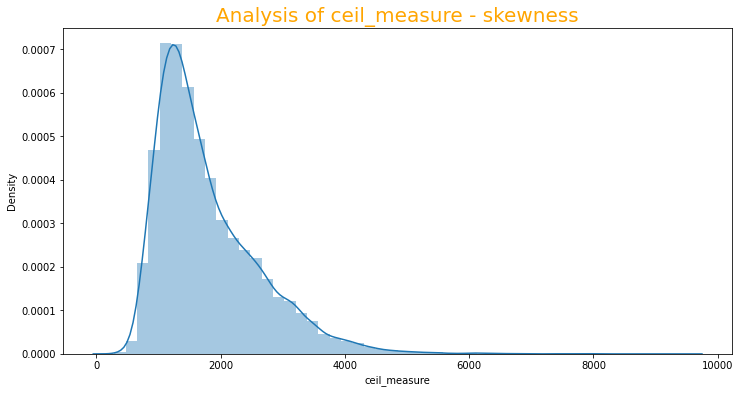

In [60]:
print("Skewness is :", df.ceil_measure.skew())
plt.figure(figsize=(12,6))
sns.distplot(df.ceil_measure)
df.ceil_measure.describe()
plt.title(f"Analysis of ceil_measure - skewness" , fontsize=20,
          color="orange")

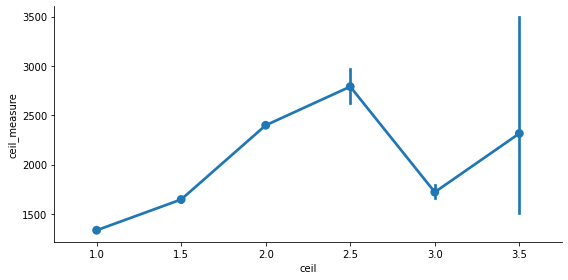

In [61]:
sns.factorplot(x='ceil',y='ceil_measure',data=df, size = 4, aspect = 2)

 There is no pattern in Ceil Vs Ceil_measure and is highly skewed

The vertival lines at each point represent the inter quartile range of values at that point

# Analysis of basement

Text(0.5, 1.0, 'Analysis of basement - skewness')

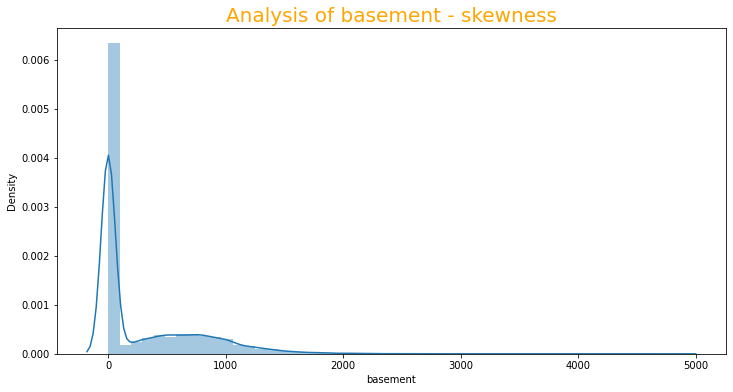

In [62]:
#basement_measure
plt.figure(figsize=(12,6))
sns.distplot(df.basement)
plt.title(f"Analysis of basement - skewness" , fontsize=20,
          color="orange")

 We can see 2 gaussians, which tells us there are propeties which don't have basements and some have the basements

In [63]:
df[df.basement==0].shape

(13126, 24)

We have almost 60% of the properties without basement

<AxesSubplot:xlabel='basement'>

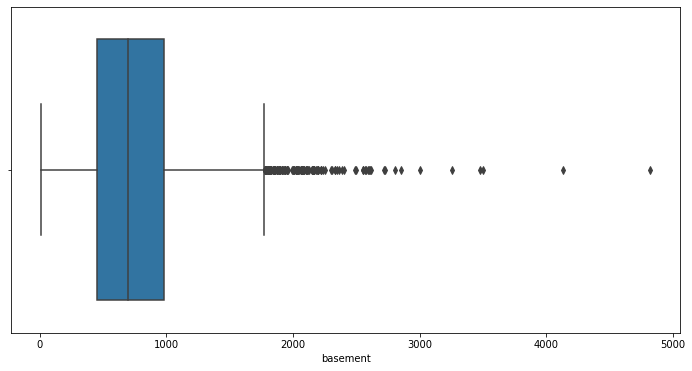

In [64]:
#houses have zero measure of basement i.e. they donot have basements
#let's plot boxplot for properties which have basements only
df_base=df[df['basement']>0]
plt.figure(figsize=(12, 6))
sns.boxplot(df_base['basement'])


 We can clearly see, there are outliers. We need to treat this before our model.

In [65]:
#checking the no. of data points with 'basement' greater than 4000
df[df['basement']>4000]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area,month/year
1245,1924059029,2014-06-17,4670000,5.0,6.75,9640.0,13068.0,1.0,1.0,4.0,...,1983.0,2009,98040,47.5570,-122.210,3270.0,10454.0,1.0,22708.0,June/2014
7928,1225069038,2014-05-05,2280000,7.0,8.00,13540.0,307752.0,3.0,0.0,4.0,...,1999.0,0,98053,47.6675,-121.986,4850.0,217800.0,1.0,321292.0,May/2014


We have only 2 properties with more than 4,000 measure basement

<AxesSubplot:xlabel='basement', ylabel='Density'>

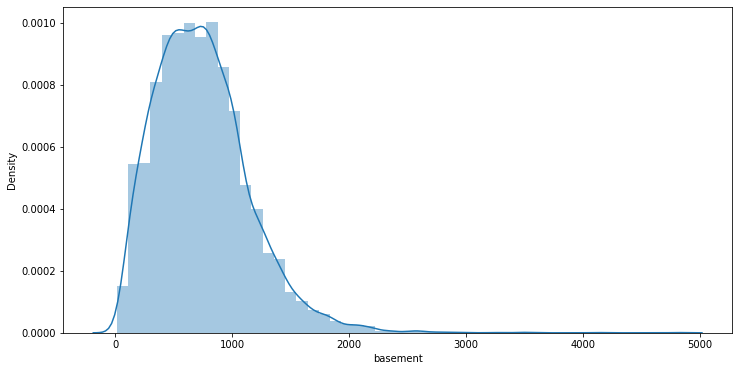

In [66]:
#Distribution of houses having basement
plt.figure(figsize=(12,6))
sns.distplot(df_base.basement)

 Distribution having basement is right-skewed

# Analysis of yr_built

Text(0.5, 1.0, 'Analysis of yr_built')

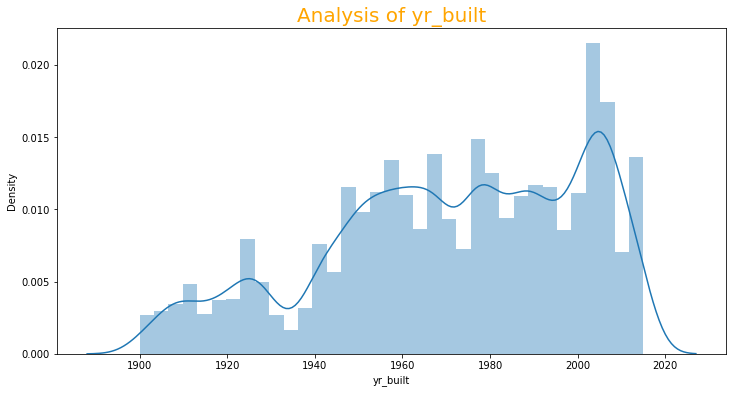

In [67]:
# house range from new to very old
plt.figure(figsize=(12,6))
sns.distplot(df.yr_built)
plt.title(f"Analysis of yr_built" , fontsize=20,
          color="orange")

The built year of the properties range from 1900 to 2014 and we can see upward trend with time

# Analysis of yr_renovated

In [68]:
df[df['yr_renovated']>0].shape

(914, 24)

Only 914 houses were renovated out of 21613 houses

Text(0.5, 1.0, 'Analysis of yr_renovated')

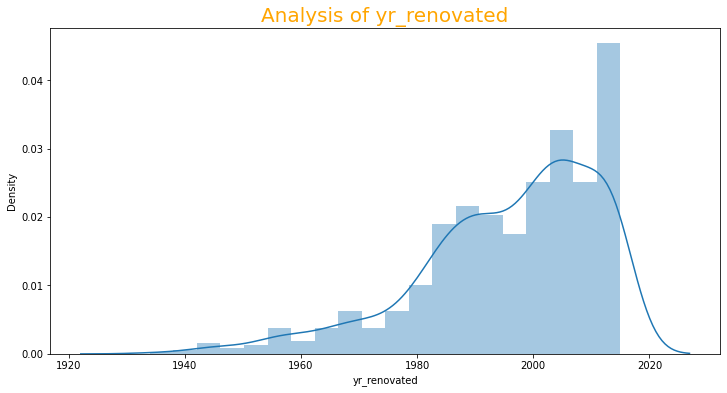

In [69]:
#yr_renovated - plot of houses which are renovated
df_reno=df[df['yr_renovated']>0]
plt.figure(figsize=(12,6))
sns.distplot(df_reno.yr_renovated)
plt.title(f"Analysis of yr_renovated" , fontsize=20,
          color="orange")

Now will create age column from columns : yr_built & yr_renovated

# Analysis of furnished

Text(0.5, 1.0, 'Analysis of furnished')

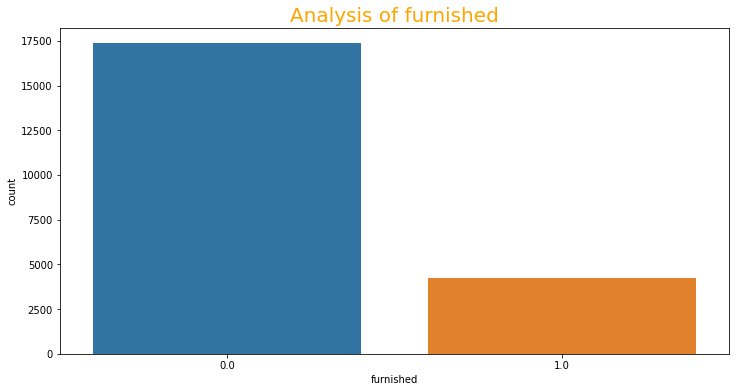

In [70]:
plt.figure(figsize=(12,6))
sns.countplot('furnished',data=df)
df.furnished.value_counts()
plt.title(f"Analysis of furnished" , fontsize=20,
          color="orange")

 Most properties are not furnished. Furnish column need to be converted into categorical column

# Analysis of Price


In [71]:
import numpy as np
min_value = df['price'].min()
max_value = df['price'].max()
bins = np.linspace(min_value,max_value,40)
df['price_bins']=pd.cut(df['price'], bins=bins,labels =[i for i in range(1,40)],include_lowest=True)

Text(0.5, 1.0, 'Analysis of price')

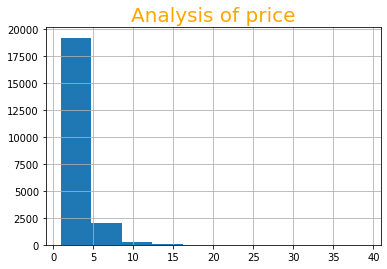

In [72]:
df.price_bins.hist()
plt.title(f"Analysis of price" , fontsize=20,
          color="orange")

# BIVARIATE ANALYSIS

## PairPlot

Text(0.5, 1.0, 'Pairplot')

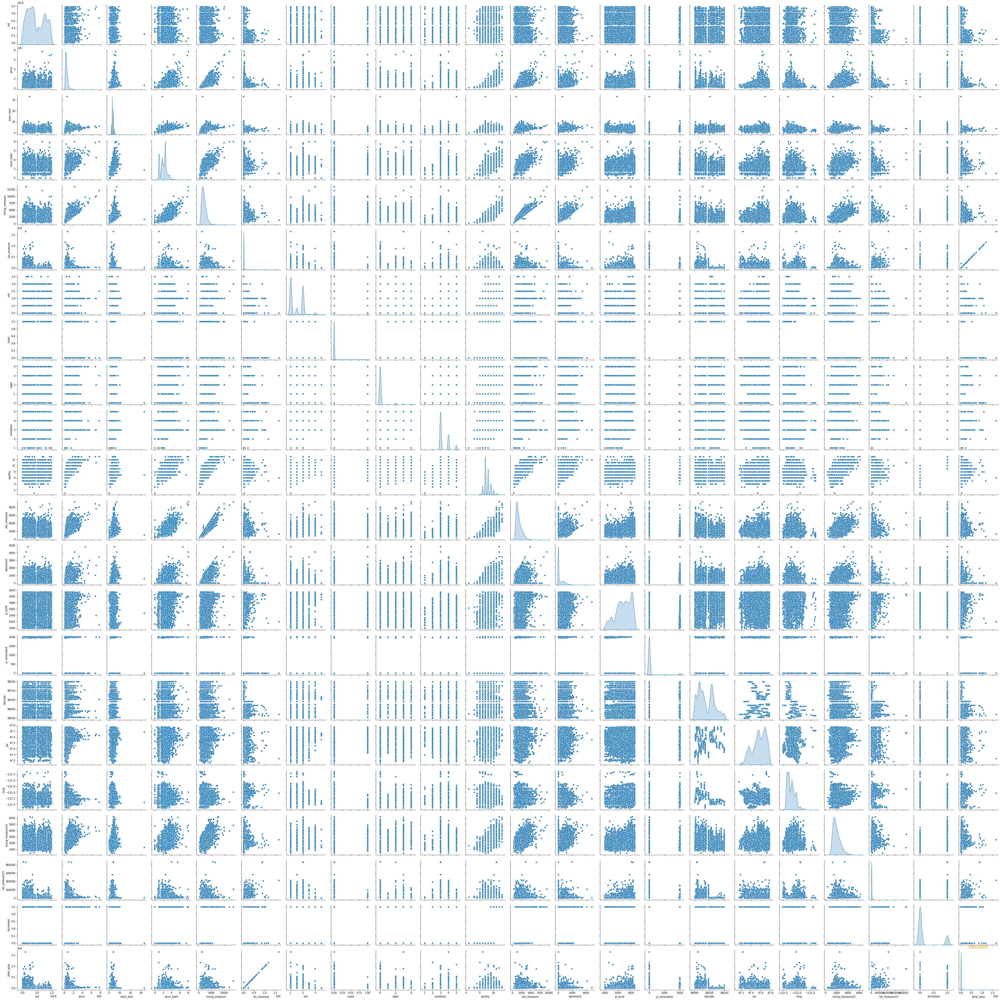

In [73]:
# plot all the variables and confirm our above deduction with more confidence
sns.pairplot(df, diag_kind = 'kde')
plt.title(f"Pairplot" , fontsize=20,
          color="orange")

From above pair plot, we observed/deduced below 

<ol>
    <li><b>price:</b> price distribution is Right-Skewed as we deduced earlier from our 5-factor analysis</li>
    <li><b>room_bed:</b> our target variable (price) and room_bed plot is not linear. It's distribution have lot of gaussians</li>
    <li><b>room_bath:</b> It's plot with price has <b>somewhat linear relationship</b>. Distribution has number of gaussians.</li>
    <li><b>living_measure:</b> Plot against price has <b>strong linear relationship</b>. It also have linear relationship with room_bath variable. So <b>might remove one of these 2</b>. Distribution is Right-Skewed.
    <li><b>lot_measure: No clear relationship</b> with price.</li>
    <li><b>ceil: No clear relationship</b> with price. We can see, it's <b>have 6 unique values</b> only. Therefore, we can <b>convert this column into categorical column</b> for values.</li>
    <li><b>coast: No clear relationship</b> with price. Clearly it's <b>categorical variable with 2 unique values</b>.</li>
    <li><b>sight: No clear relationship</b> with price. This has <b>5 unique values</b>. Can be <b>converted to Categorical variable</b>.</li>
    <li><b>condition: No clear relationship</b> with price. This has <b>5 unique values</b>. Can be <b>converted to Categorical variable</b>.</li>
    <li><b>quality: Somewhat linear relationship with price</b>. Has <b>discrete values from 1 - 13. Can be converted to Categorical variable</b>.</li>
    <li><b>ceil_measure: Strong linear relationship with price</b>. Also with room_bath and living_measure features. Distribution is <b>Right-Skewed</b>.</li>
    <li><b>basement: No clear relationship</b> with price. </li>
    <li><b>yr_built: No clear relationship</b> with price. </li>
    <li><b>yr_renovated: No clear relationship</b> with price. Have <b>2 unique values. Can be converted to Categorical Variable</b> which tells whether house is renovated or not.</li>
    <li><b>zipcode, lat, long: No clear relationship</b> with price or any other feature.</li>
    <li><b>living_measure15: Somewhat linear relationship with target feature</b>. It's same as living_measure. Therefore we can drop this variable.</li>
    <li><b>lot_measure15: No clear relationship</b> with price or any other feature.</li>
    <li><b>furnished: No clear relationship</b> with price or any other feature. <b> 2 unique values so can be converted to Categorical Variable</b></li>
    <li><b>total_area: No clear relationship with price</b>. But it has <b>Very Strong linear relationship with lot_measure</b>. So one of it can be dropped.</li>
    </ol>

In [74]:
# corelatoin between the different features
corr = df.corr(method ='pearson')
corr

,cid,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,...,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
cid,1.000000,-0.016797,0.001492,0.005768,-0.012151,-0.131789,0.019379,-0.004184,0.011776,-0.024273,...,-0.005151,0.021417,-0.016907,-0.008224,-0.001891,0.020885,-0.003126,-0.138699,-0.010099,-0.131638
price,-0.016797,1.000000,0.307766,0.524509,0.702066,0.089676,0.256385,0.266042,0.396999,0.035556,...,0.323837,0.053872,0.126442,-0.053168,0.306919,0.021532,0.583825,0.082597,0.565834,0.104849
room_bed,0.001492,0.307766,1.000000,0.515184,0.575776,0.032007,0.174115,-0.006080,0.078215,0.027836,...,0.301896,0.154150,0.018437,-0.152556,-0.009410,0.129678,0.390003,0.029413,0.258431,0.044447
room_bath,0.005768,0.524509,0.515184,1.000000,0.753265,0.087675,0.496707,0.062046,0.186137,-0.126224,...,0.282696,0.505098,0.050112,-0.203568,0.024578,0.222169,0.566262,0.086769,0.483681,0.103866
living_measure,-0.012151,0.702066,0.575776,0.753265,1.000000,0.172728,0.352695,0.102542,0.284366,-0.058903,...,0.434775,0.317757,0.055211,-0.199588,0.052722,0.240062,0.753594,0.183484,0.632436,0.194168
lot_measure,-0.131789,0.089676,0.032007,0.087675,0.172728,1.000000,-0.005410,0.021167,0.074982,-0.008546,...,0.015364,0.052940,0.007672,-0.129243,-0.085940,0.228884,0.145003,0.716048,0.119169,0.998169
ceil,0.019379,0.256385,0.174115,0.496707,0.352695,-0.005410,1.000000,0.024136,0.028945,-0.262111,...,-0.244864,0.487212,0.005351,-0.058419,0.050372,0.124882,0.277405,-0.011396,0.347236,0.002364
coast,-0.004184,0.266042,-0.006080,0.062046,0.102542,0.021167,0.024136,1.000000,0.400220,0.017683,...,0.079239,-0.025856,0.088358,0.030289,-0.014139,-0.042021,0.086221,0.030727,0.069571,0.023407
sight,0.011776,0.396999,0.078215,0.186137,0.284366,0.074982,0.028945,0.400220,1.000000,0.046519,...,0.277243,-0.052722,0.102980,0.084386,0.006001,-0.078051,0.280910,0.072979,0.219898,0.080998
condition,-0.024273,0.035556,0.027836,-0.126224,-0.058903,-0.008546,-0.262111,0.017683,0.046519,1.000000,...,0.173736,-0.360606,-0.060494,0.003040,-0.015471,-0.106618,-0.093187,-0.002959,-0.122410,-0.009800


 We have linear relationships in below featues as we got to know from above matrix

<ol>
    <li><b>price</b>: room_bath, living_measure, quality, living_measure15, furnished</li>
    <li><b>living_measure</b>: price, room_bath. So we can consider dropping 'room_bath' variable.</li>
    <li><b>quality</b>: price, room_bath, living_measure</li>
    <li><b>ceil_measure</b>: price, room_bath, living_measure, quality</li>
    <li><b>living_measure15</b>: price, living_measure, quality. So we can  consider dropping living_measure15 as well. As it's giving same info as living_measure.</li>
    <li><b>lot_measure15</b>: lot_measure. Therefore, we can consider dropping lot_measure15, as it's giving same info.</li>
    <li><b>furnished</b>: quality</li>
    <li><b>total_area</b>: lot_measure, lot_measure15. Therefore, we can consider dropping total_area feature as well. As it's giving same info as lot_measure.</li>
</ol>

We can plot heatmap and can easily confirm our above findings

Text(0.5, 1.0, 'Heatmap')

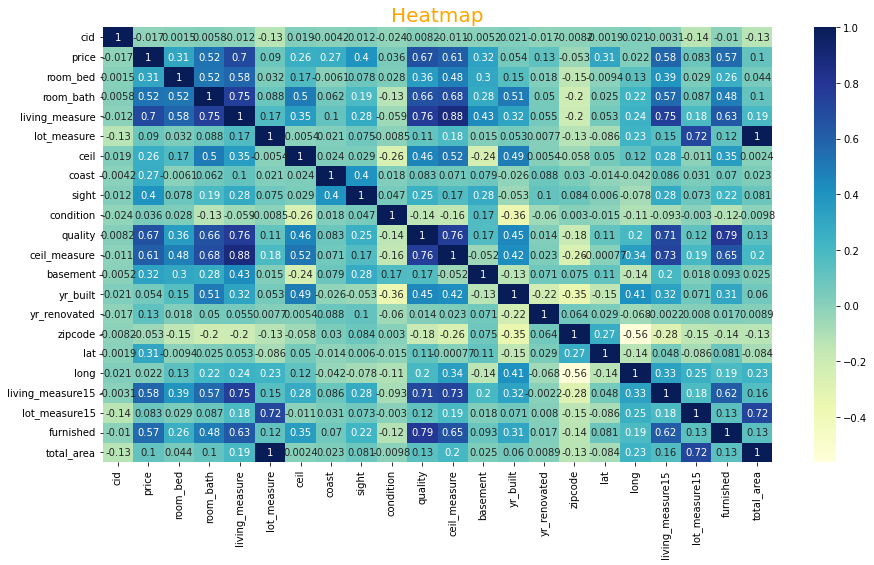

In [75]:
# Plotting heatmap
plt.subplots(figsize =(15, 8)) 
sns.heatmap(corr,cmap="YlGnBu",annot=True)
plt.title(f"Heatmap" , fontsize=20,
          color="orange")

# Bivariate Analysis of  month_year

,mean,median,size
month/year,,,
April/2015,561933.463021,476500.0,2231
August/2014,536527.039691,442100.0,1940
December/2014,524602.893270,432500.0,1471
February/2015,507919.603200,425545.0,1250
January/2015,525963.251534,438500.0,978
July/2014,544892.161013,465000.0,2211
June/2014,558123.736239,465000.0,2180
March/2015,544057.683200,450000.0,1875
May/2014,548166.600113,465000.0,1768


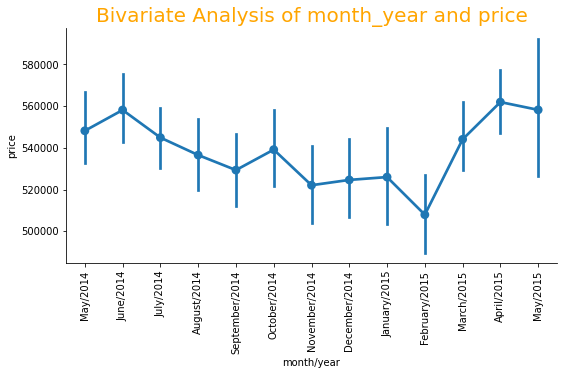

In [76]:
df['month/year'] = pd.to_datetime(df['month/year'], format='%B/%Y')
df.sort_values(["month/year"], axis=0, ascending=True, inplace=True) 
df["month/year"] = df["month/year"].dt.strftime('%B/%Y')
sns.factorplot(x='month/year',y='price',data=df, size=4, aspect=2)
plt.xticks(rotation=90)
plt.title(f"Bivariate Analysis of month_year and price" , fontsize=20,
          color="orange")
df.groupby('month/year')['price'].agg(['mean','median','size'])

 The mean price of the houses tend to be high during March,April, May as compared to that of September, October, November,December period.

# Bivariate Analysis of  room_bed

,mean,median,size
room_bed,,,
0.0,4.102231e+05,288000.0,13
1.0,3.189286e+05,299000.0,197
2.0,4.013572e+05,373500.0,2747
3.0,4.667563e+05,414500.0,9875
4.0,6.357284e+05,549950.0,6854
5.0,7.867329e+05,619000.0,1595
6.0,8.274895e+05,652500.0,270
7.0,9.514478e+05,728580.0,38
8.0,1.105077e+06,700000.0,13


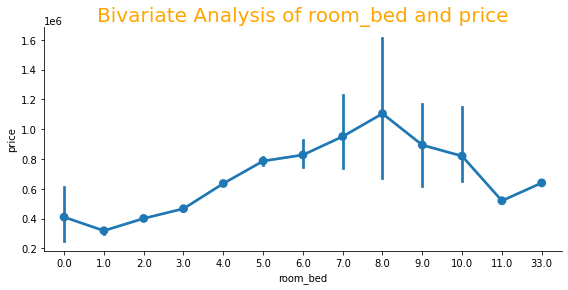

In [77]:
sns.factorplot(x='room_bed',y='price',data=df, size=4, aspect=2)
plt.title(f"Bivariate Analysis of room_bed and price" , fontsize=20,
          color="orange")
df.groupby('room_bed')['price'].agg(['mean','median','size'])

There is clear increasing trend in price with room_bed

,mean,median,size
room_bath,,,
0.00,4.490950e+05,317500.0,10
0.50,2.373750e+05,264000.0,4
0.75,2.945209e+05,273500.0,72
1.00,3.470889e+05,320000.0,3829
1.25,6.217722e+05,516500.0,9
1.50,4.091834e+05,370000.0,1439
1.75,4.549409e+05,422800.0,3031
2.00,4.575184e+05,422500.0,1917
2.25,5.325099e+05,470000.0,2147


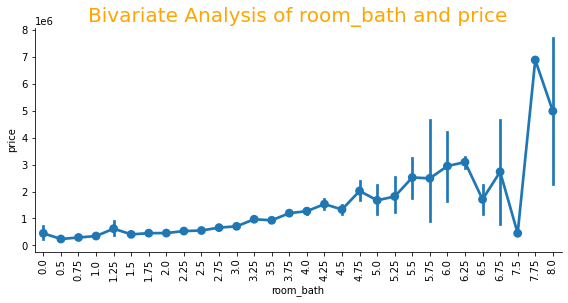

In [78]:
sns.factorplot(x='room_bath',y='price',data=df,size=4, aspect=2)
plt.xticks(rotation=90)
plt.title(f"Bivariate Analysis of room_bath and price" , fontsize=20,
          color="orange")
df.groupby('room_bath')['price'].agg(['mean','median','size'])

Outliers are there. Overall mean and median price increares with increasing room_bath<br>
There is upward trend in price with increase in room_bath

# Bivariate Analysis of living_measure

AxesSubplot(0.125,0.125;0.775x0.755)


count    21613.000000
mean      2079.727155
std        918.147155
min        290.000000
25%       1430.000000
50%       1910.000000
75%       2550.000000
max      13540.000000
Name: living_measure, dtype: float64

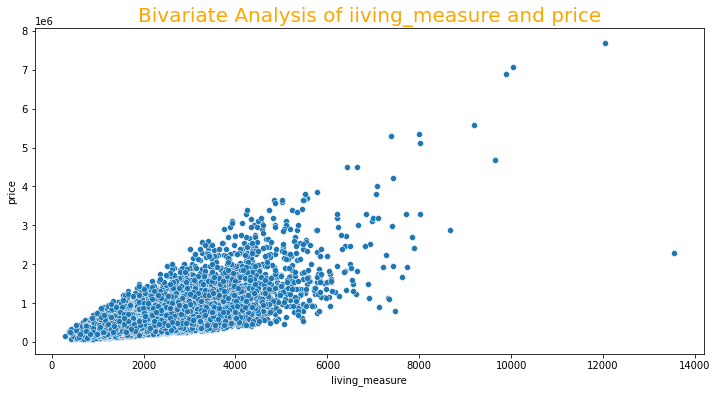

In [79]:
plt.figure(figsize=(12,6))
print(sns.scatterplot(df['living_measure'],df['price']))
plt.title(f"Bivariate Analysis of iiving_measure and price" , fontsize=20,
          color="orange")
df['living_measure'].describe()

There is clear increment in price of the property with increment in the living measure But there seems to be one outlier to this trend. Need to evaluate the same

# Bivariate Analysis of lot_measure

AxesSubplot(0.125,0.125;0.775x0.755)


count    2.161300e+04
mean     1.509003e+04
std      4.138466e+04
min      5.200000e+02
25%      5.043000e+03
50%      7.618000e+03
75%      1.066000e+04
max      1.651359e+06
Name: lot_measure, dtype: float64

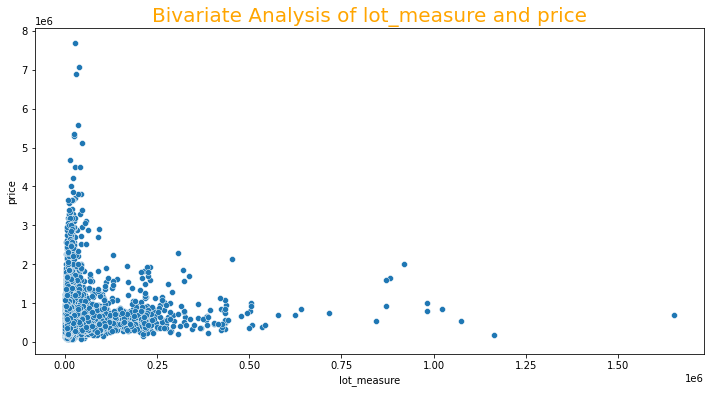

In [80]:
plt.figure(figsize=(12,6))
print(sns.scatterplot(df['lot_measure'],df['price']))
plt.title(f"Bivariate Analysis of lot_measure and price" , fontsize=20,
          color="orange")
df['lot_measure'].describe()

There seems to be no relation between lot_measure and price.<br>
Data value range is very large so breaking it get better view.<br>
There doesnt seem to be no relation between lot_measure and price trend

AxesSubplot(0.125,0.125;0.775x0.755)


count    19717.000000
mean      7760.594817
std       4245.511393
min        520.000000
25%       5000.000000
50%       7260.000000
75%       9612.000000
max      24969.000000
Name: lot_measure, dtype: float64

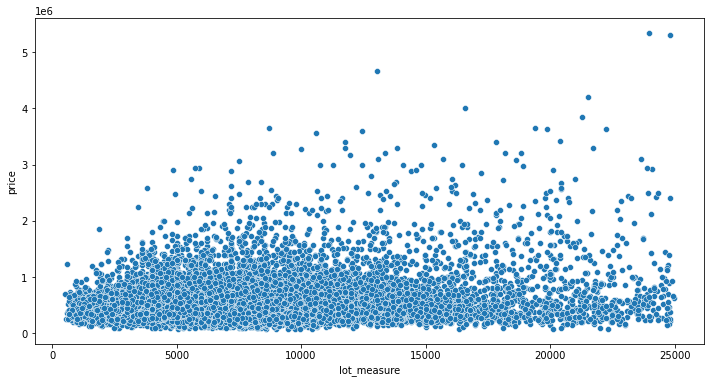

In [81]:
#lot_measure <25000
plt.figure(figsize=(12,6))
x=df[df['lot_measure']<25000]
print(sns.scatterplot(x['lot_measure'],x['price']))
x['lot_measure'].describe()

 Almost 95% of the houses have <25000 lot_measure. But there is no clear trend between lot_measure and price

AxesSubplot(0.125,0.125;0.775x0.755)


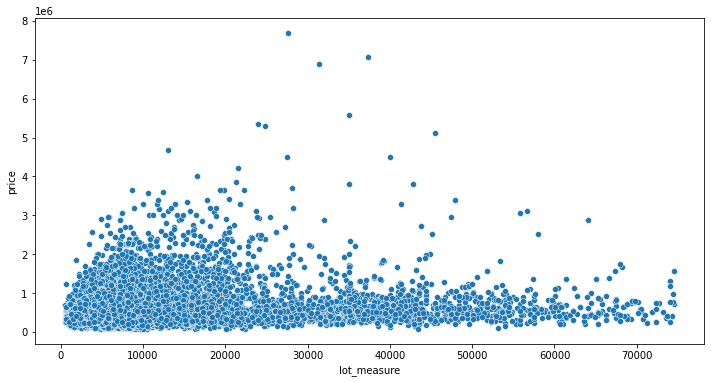

In [82]:
#lot_measure >100000 
plt.figure(figsize=(12,6))
y=df[df['lot_measure']<=75000]
print(sns.scatterplot(y['lot_measure'],y['price']))

price increases with increase in living measure

# Bivariate Analysis of  ceil

,mean,median,size
ceil,,,
1.0,4.427711e+05,390000.0,10719
1.5,5.593744e+05,525000.0,1905
2.0,6.491210e+05,543250.0,8210
2.5,1.061021e+06,799200.0,161
3.0,5.831248e+05,490500.0,610
3.5,9.339375e+05,534500.0,8


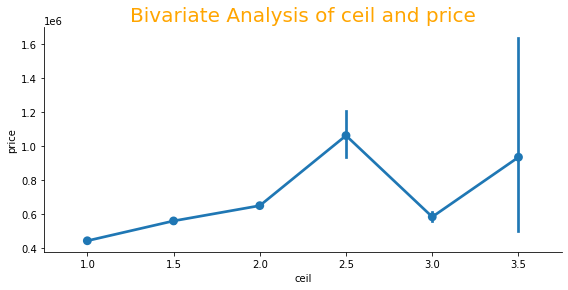

In [83]:
print(sns.factorplot(x='ceil',y='price',data=df, size = 4, aspect = 2))
plt.title(f"Bivariate Analysis of ceil and price" , fontsize=20,
          color="orange")
df.groupby('ceil')['price'].agg(['mean','median','size'])

Median price increases initially and then falls<br>
There is some slight upward trend in price with the ceil

# Bivariate Analysis of  coast

living_measure                   price              
              median         mean     median          mean
coast                                                     
0.0           1910.0  2071.571042   450000.0  5.317155e+05
1.0           2830.0  3166.465839  1410000.0  1.668301e+06

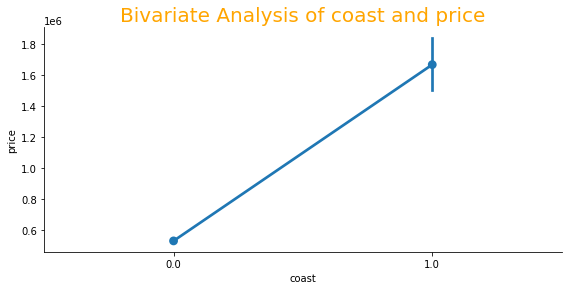

In [84]:
print(sns.factorplot(x='coast',y='price',data=df, size = 4, aspect = 2))
plt.title(f"Bivariate Analysis of coast and price" , fontsize=20,
          color="orange")
df.groupby('coast')['living_measure','price'].agg(['median','mean'])

Mean and median of waterfront view is high however such houses are very small in compare to non-waterfront<br>
Also, living_measure mean and median is greater for waterfront house.<br>
The house properties with water_front tend to have higher price compared to that of non-water_front properties

price                   living_measure               
               mean     median   size           mean  median   size
sight                                                              
0.0    4.967417e+05   432500.0  19494    1997.843285  1850.0  19494
1.0    8.125186e+05   690944.0    332    2568.960843  2420.0    332
2.0    7.918609e+05   675000.0    959    2652.881126  2450.0    959
3.0    9.724684e+05   802500.0    510    3018.564706  2840.0    510
4.0    1.466554e+06  1190000.0    318    3354.433962  3070.0    318

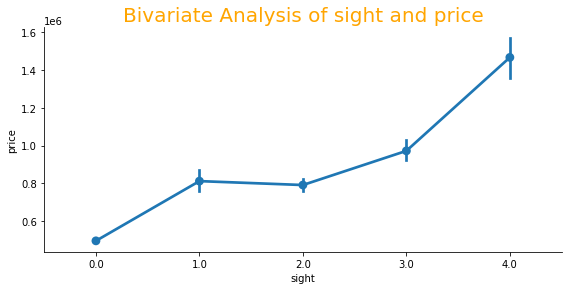

In [85]:
print(sns.factorplot(x='sight',y='price',data=df, size = 4, aspect = 2))
plt.title(f"Bivariate Analysis of sight and price" , fontsize=20,
          color="orange")
df.groupby('sight')['price','living_measure'].agg(['mean','median','size'])

It contains have outliers. 
The house sighted more have high price (mean and median) and have large living area as well.
Properties with higher price have more no.of sights compared to that of houses with lower price

AxesSubplot(0.125,0.125;0.775x0.755)


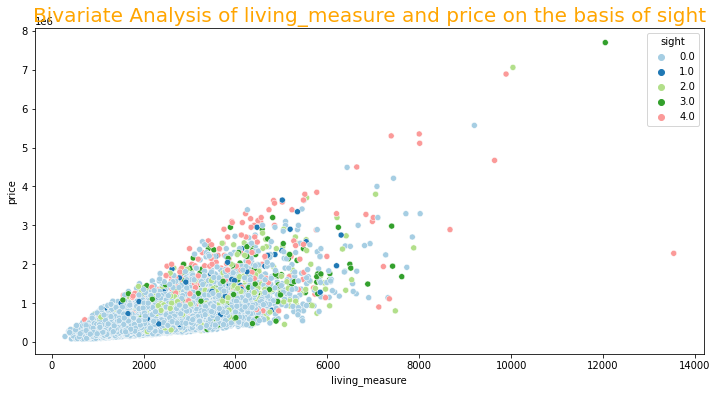

In [86]:
plt.figure(figsize=(12,6))
plt.title(f"Bivariate Analysis of living_measure and price on the basis of sight" , fontsize=20,
          color="orange")
print(sns.scatterplot(df['living_measure'],df['price'],hue=df['sight'],palette='Paired',legend='full'))

Viewed in relation with price and living_measure
Costlier houses with large living area are sighted more.
The above graph also justify that: Properties with higher price have more no.of sights compared to that of houses with lower price

# Bivariate Analysis of  condition

price                  living_measure               
                    mean    median   size           mean  median   size
condition                                                              
1.0        334431.666667  262500.0     30    1216.000000  1000.0     30
2.0        326423.327485  279000.0    171    1414.152047  1330.0    171
3.0        542364.148048  451000.0  14063    2148.572780  1970.0  14063
4.0        520643.219275  440000.0   5655    1950.352255  1820.0   5655
5.0        612515.489965  525444.0   1694    2022.563164  1880.0   1694

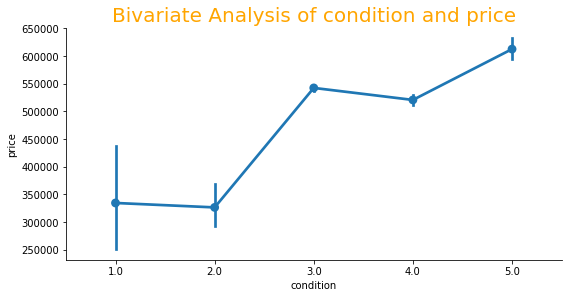

In [87]:
print(sns.factorplot(x='condition',y='price',data=df, size = 4, aspect = 2))
plt.title(f"Bivariate Analysis of condition and price" , fontsize=20,
          color="orange")
df.groupby('condition')['price','living_measure'].agg(['mean','median','size'])

As the condition rating increases its price and living measure mean and median also increases.<br>
The price of the house increases with condition rating of the house

AxesSubplot(0.125,0.125;0.775x0.755)


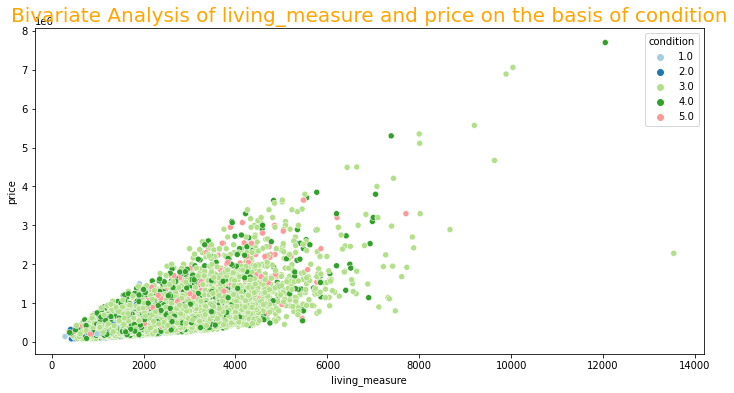

In [88]:
plt.figure(figsize=(12,6))
plt.title(f"Bivariate Analysis of living_measure and price on the basis of condition" , fontsize=20,
          color="orange")
print(sns.scatterplot(df['living_measure'],df['price'],hue=df['condition'],palette='Paired',legend='full'))

Viewed in relation with price and living_measure. Most houses are rated as 3 or more.
We can see some outliers as well
So we found out that smaller houses are in better condition and better condition houses are having higher prices

# Bivariate Analysis of  quality

price                  living_measure              
                 mean     median  size           mean  median  size
quality                                                            
1.0      1.420000e+05   142000.0     1     290.000000   290.0     1
3.0      2.056667e+05   262000.0     3     596.666667   600.0     3
4.0      2.143810e+05   205000.0    29     660.482759   660.0    29
5.0      2.485240e+05   228700.0   242     983.326446   905.0   242
6.0      3.019166e+05   275276.5  2038    1192.096173  1120.0  2038
7.0      4.025850e+05   375000.0  8982    1689.795703  1630.0  8982
8.0      5.429310e+05   510000.0  6067    2184.126257  2150.0  6067
9.0      7.737382e+05   720000.0  2615    2866.572084  2820.0  2615
10.0     1.072347e+06   914327.0  1134    3520.299824  3450.0  1134
11.0     1.497792e+06  1280000.0   399    4395.448622  4260.0   399
12.0     2.192500e+06  1820000.0    90    5471.588889  4965.0    90
13.0     3.710769e+06  2980000.0    13    7483.076923  7100.0    13

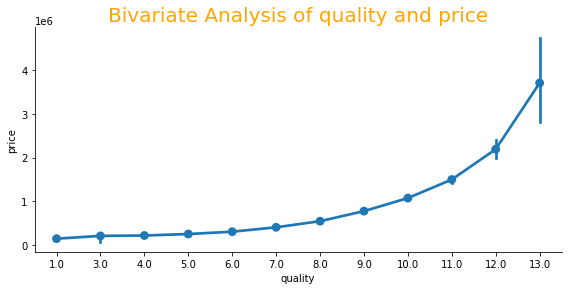

In [89]:
print(sns.factorplot(x='quality',y='price',data=df, size = 4, aspect = 2))
plt.title(f"Bivariate Analysis of quality and price" , fontsize=20,
          color="orange")
df.groupby('quality')['price','living_measure'].agg(['mean','median','size'])

With grade increase price and living_measure increase (mean and median)
There is clear increase in price of the house with higher rating on quality

AxesSubplot(0.125,0.125;0.775x0.755)


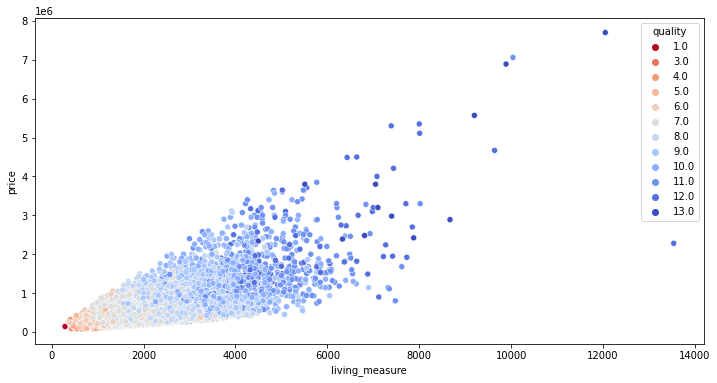

In [90]:
plt.figure(figsize=(12,6))
print(sns.scatterplot(df['living_measure'],df['price'],hue=df['quality'],palette='coolwarm_r', legend='full'))

Viewed in relation with price and living_measure. Most houses are graded as 6 or more.<br>
We can see some outliers as well 

# Bivariate Analysis of  ceil_measure

AxesSubplot(0.125,0.125;0.775x0.755)


count    21613.000000
mean      1788.355989
std        828.084833
min        290.000000
25%       1190.000000
50%       1560.000000
75%       2210.000000
max       9410.000000
Name: ceil_measure, dtype: float64

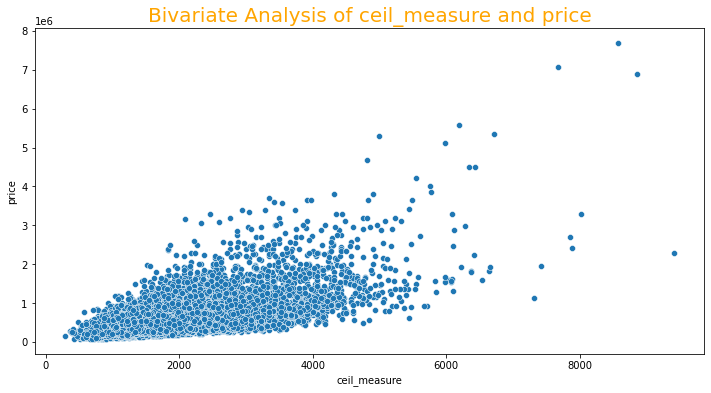

In [91]:
plt.figure(figsize=(12,6))
print(sns.scatterplot(df['ceil_measure'],df['price']))
plt.title(f"Bivariate Analysis of ceil_measure and price" , fontsize=20,
          color="orange")
df['ceil_measure'].describe()

There is upward trend in price with ceil_measure

# Bivariate Analysis of basement

AxesSubplot(0.125,0.125;0.775x0.755)


count    21613.000000
mean       291.509045
std        442.575043
min          0.000000
25%          0.000000
50%          0.000000
75%        560.000000
max       4820.000000
Name: basement, dtype: float64

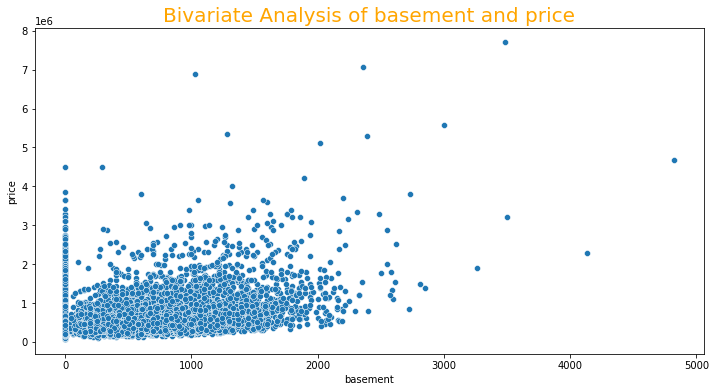

In [92]:
plt.figure(figsize=(12,6))
print(sns.scatterplot(df['basement'],df['price']))
plt.title(f"Bivariate Analysis of basement and price" , fontsize=20,
          color="orange")
df['basement'].describe()

 We will create the categorical variable for basement 'has_basement' for houses with basement and no basement.This categorical variable will be used for further analysis.<br>
 Price increases with increase in ceil measure

### Adding a new caegorical variable for looking into the data which houses are having basements and which are not

In [93]:
# Making bins for basements
def create_basement_group(series):
    if series == 0:
        return "No"
    elif series > 0:
        return "Yes"
    
df['has_basement'] = df['basement'].apply(create_basement_group)

price                  living_measure               
                       mean    median   size           mean  median   size
has_basement                                                              
No            486945.394789  411500.0  13126    1928.891818  1740.0  13126
Yes           622518.174384  515000.0   8487    2313.009191  2100.0   8487

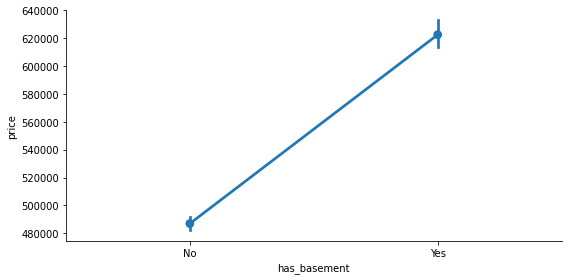

In [94]:
print(sns.factorplot(x='has_basement',y='price',data=df, size = 4, aspect = 2))
df.groupby('has_basement')['price','living_measure'].agg(['mean','median','size'])

After binning we data shows with basement houses are costlier and have higher<br>
The houses with basement has better price compared to that of houses without basement

AxesSubplot(0.125,0.125;0.775x0.755)


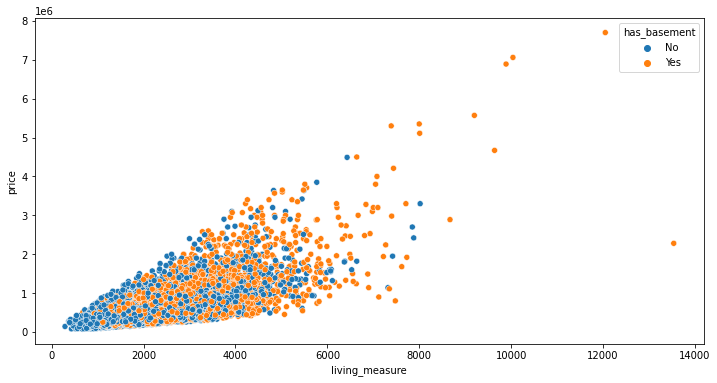

In [95]:
plt.figure(figsize=(12,6))
print(sns.scatterplot(df['living_measure'],df['price'],hue=df['has_basement']))

houses having basement have higher price & living measure

AxesSubplot(0.125,0.125;0.775x0.755)


,mean,median,size
yr_built,,,
1900.0,581536.632184,549000.0,87
1901.0,557108.344828,550000.0,29
1902.0,673192.592593,624000.0,27
1903.0,480958.195652,461000.0,46
1904.0,583867.755556,478000.0,45
...,...,...,...
2011.0,544648.384615,440000.0,130
2012.0,527436.982353,448475.0,170
2013.0,678599.582090,565000.0,201


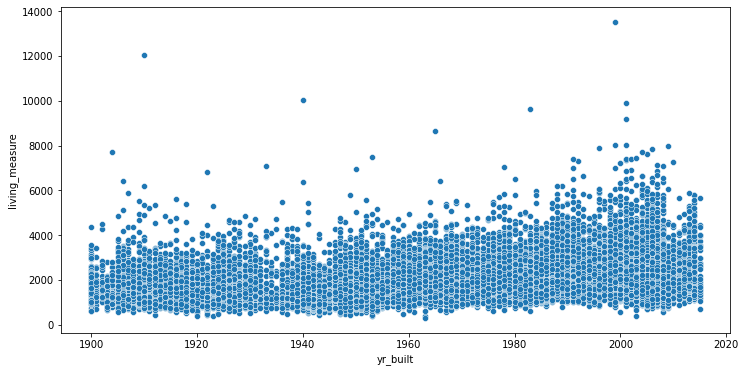

In [96]:
plt.figure(figsize=(12,6))
print(sns.scatterplot(df['yr_built'],df['living_measure']))
df.groupby('yr_built')['price'].agg(['mean','median','size'])

We will create new variable: Houselandratio - This is proportion of living area in the total area of the house. We will explore the trend of price against this houselandratio.

### Creating a new column for calculating the percentage of living space in the house

In [97]:
df["house_land_ratio"]=np.round((df['living_measure']/df['total_area']),2)*100
df["house_land_ratio"].head()

12235    16.0
14791    35.0
1742     17.0
17829    27.0
14810    17.0
Name: house_land_ratio, dtype: float64

# Bivariate Analysis of  yr_renovated

AxesSubplot(0.125,0.125;0.775x0.755)


,mean,median,size
yr_renovated,,,
1934,459950.000000,459950.0,1
1940,378400.000000,378400.0,2
1944,521000.000000,521000.0,1
1945,398666.666667,375000.0,3
1946,351137.500000,351137.5,2
...,...,...,...
2011,607496.153846,577000.0,13
2012,625181.818182,515000.0,11
2013,664960.810811,560000.0,37


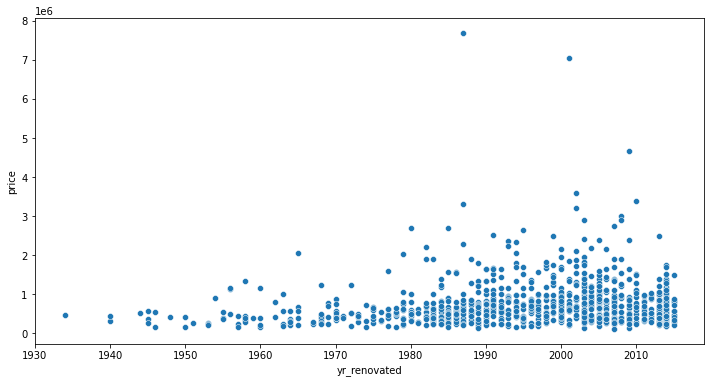

In [98]:
plt.figure(figsize=(12,6))
x=df[df['yr_renovated']>0]
print(sns.scatterplot(x['yr_renovated'],x['price']))
x.groupby('yr_renovated')['price'].agg(['mean','median','size'])

 So most houses are renovated after 1980's. We will create new categorical variable 'has_renovated' to categorize the property as renovated and non-renovated. For further ananlysis we will use this categorical variable.

### Creating new categorical column for looking that a house is renovated or not

In [99]:
def renovated_group(series):
    if series == 0:
        return "No"
    elif series > 0:
        return "Yes"
    
df['has_renovated'] = df['yr_renovated'].apply(renovated_group)

AxesSubplot(0.125,0.125;0.775x0.755)


price                  house_land_ratio              
                        mean    median   size             mean median   size
has_renovated                                                               
No             530447.958597  448000.0  20699        22.069424   20.0  20699
Yes            760628.777899  600000.0    914        22.271335   21.0    914

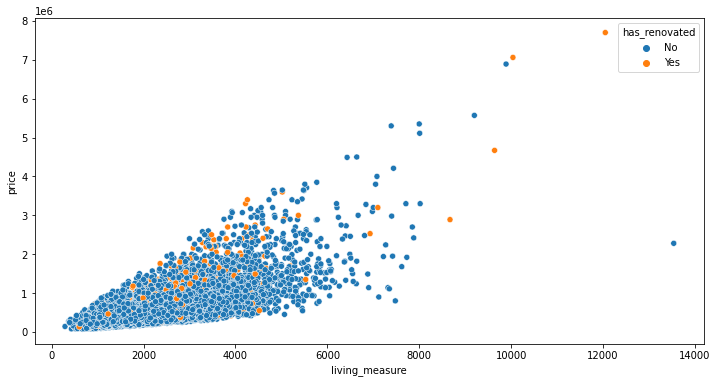

In [100]:
plt.figure(figsize=(12,6))
print(sns.scatterplot(df['living_measure'],df['price'],hue=df['has_renovated']))
df.groupby(['has_renovated'])['price','house_land_ratio'].agg(['mean','median','size'])

Renovated have higher mean and median, however it does not confirm if the prices of house renovated actually increased or not.<br>
Renovated house utilized more land area for construction of house

Renovated properties have higher price than others with same living measure space.

AxesSubplot(0.125,0.125;0.775x0.755)


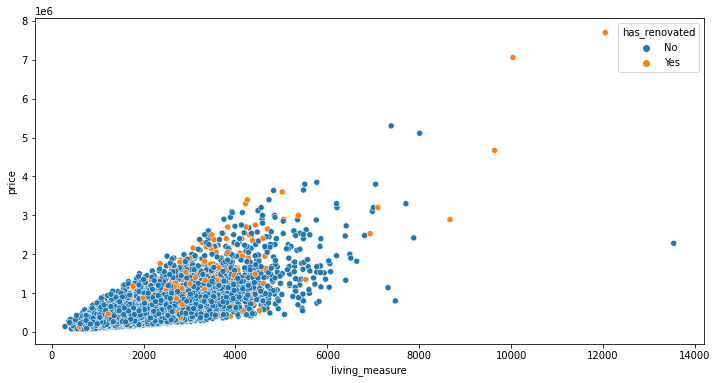

In [101]:
#has_renovated - have higher price & living measure
plt.figure(figsize=(12,6))
x=df[df['yr_built']<2000]
print(sns.scatterplot(x['living_measure'],x['price'],hue=x['has_renovated']))

# Bivariate Analysis of furnished

<AxesSubplot:xlabel='price_bins', ylabel='count'>

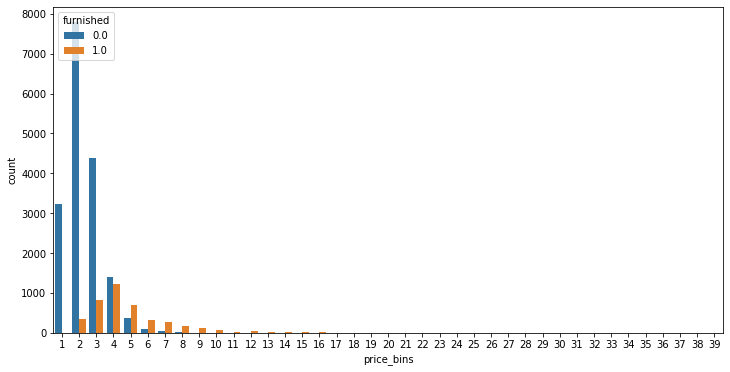

In [102]:
plt.figure(figsize=(12,6))
sns.countplot(x='price_bins', hue='furnished', data=df)

AxesSubplot(0.125,0.125;0.775x0.755)


count    2.161300e+04
mean     5.401822e+05
std      3.673622e+05
min      7.500000e+04
25%      3.219500e+05
50%      4.500000e+05
75%      6.450000e+05
max      7.700000e+06
Name: price, dtype: float64

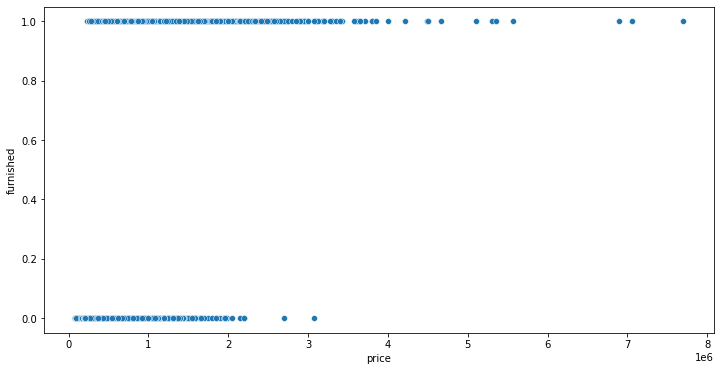

In [103]:
plt.figure(figsize=(12,6))
print(sns.scatterplot(df['price'],df['furnished'],))
df['price'].describe()

AxesSubplot(0.125,0.125;0.775x0.755)


count    21613.000000
mean      2079.727155
std        918.147155
min        290.000000
25%       1430.000000
50%       1910.000000
75%       2550.000000
max      13540.000000
Name: living_measure, dtype: float64

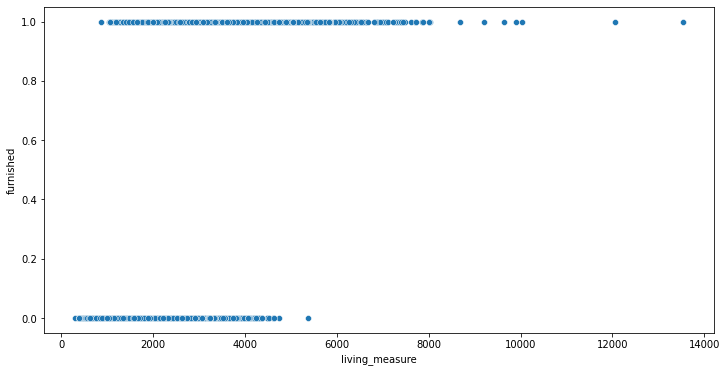

In [104]:
plt.figure(figsize=(12,6))
print(sns.scatterplot(df['living_measure'],df['furnished'],))
df['living_measure'].describe()

AxesSubplot(0.125,0.125;0.775x0.755)


price                  living_measure                 \
                    mean    median   size           mean  median   size   
furnished                                                                 
0.0        437403.973628  401000.0  17367    1792.618184  1720.0  17367   
1.0        960565.753179  810000.0   4246    3254.060999  3110.0   4246   

          house_land_ratio                
                      mean median   size  
furnished                                 
0.0              21.506708   19.0  17367  
1.0              24.414508   24.0   4246

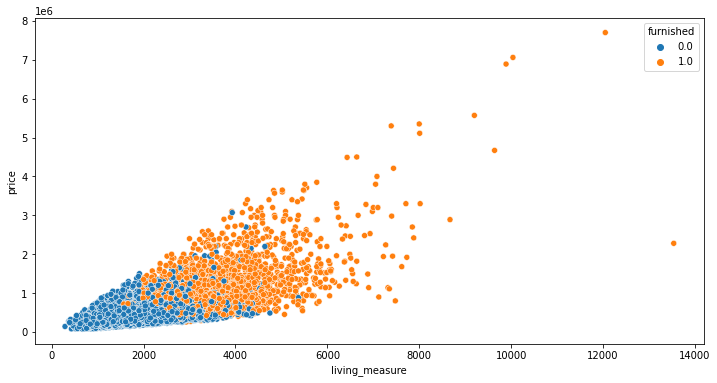

In [105]:
plt.figure(figsize=(12,6))
print(sns.scatterplot(df['living_measure'],df['price'],hue=df['furnished']))
df.groupby('furnished')['price','living_measure','house_land_ratio'].agg(['mean','median','size'])

Furnished has higher price value and has greater living_measure <Br>
Furnished houses have higher price than that of the Non-furnished houses

# Some other analysis

### Looking into the most common house according to number of bedroom 

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

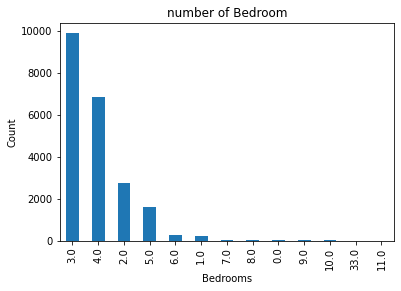

In [106]:
df['room_bed'].value_counts().plot(kind='bar')
plt.title('number of Bedroom')
plt.xlabel('Bedrooms')
plt.ylabel('Count')
sns.despine

we can clearly see that the houses having 3 and 4 number of bedrooms are higher

# Visualizing the location of the houses based on latitude and longitude.

<Figure size 720x720 with 0 Axes>

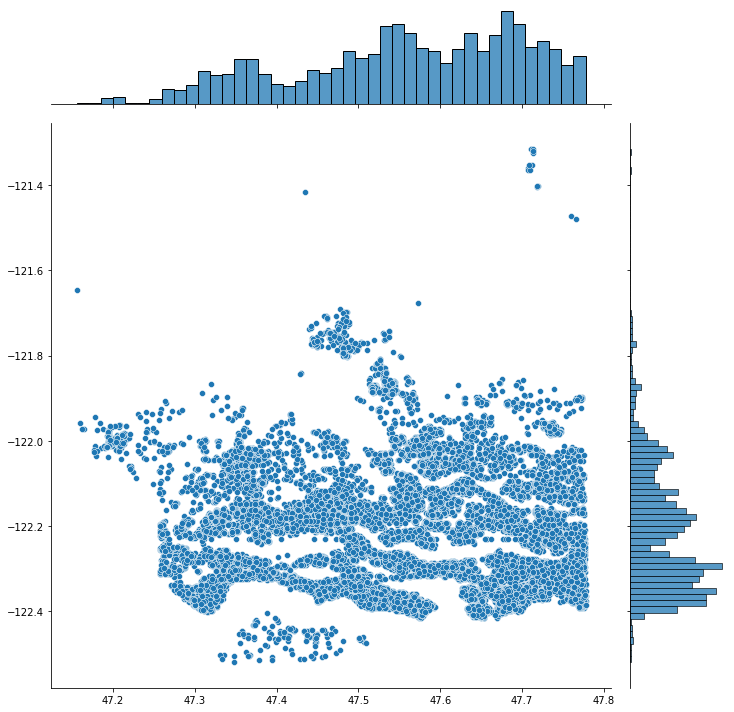

<function seaborn.utils.despine(fig=None, ax=None, top=True, right=True, left=False, bottom=False, offset=None, trim=False)>

In [107]:
plt.figure(figsize=(10,10))
sns.jointplot(x=df.lat.values, y=df.long.values, size=10)
plt.ylabel('Longitude', fontsize=12)
plt.xlabel('Latitude', fontsize=12)
plt.show()
sns.despine

We can see that for latitude between -47.7 and -48.8 and for longitude  between -122.2 to -122.4 there are many houses

# DATA PROCESSING

### Treating Outlilers 
We have seen outliers for columns room_bath(33 bed), living_measure, lot_measure, ceil_measure and Basement 

In [108]:
def outlier_removal(datacolumn):
    sorted(datacolumn)
    Q1,Q3 = np.percentile(datacolumn , [25,75])
    IQR = Q3-Q1
    lower_range = Q1-(1.5 * IQR)
    upper_range = Q3+(1.5 * IQR)
    return lower_range,upper_range

Using the above function, lets get the lowerbound and upperbound values

# Removing oultier from ceil_measure

In [109]:
lowerbound,upperbound = outlier_removal(df.ceil_measure)
print(lowerbound,upperbound)

-340.0 3740.0


Lets check which column is considered as an outlier

In [110]:
df[(df.ceil_measure < lowerbound) | (df.ceil_measure > upperbound)]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,long,living_measure15,lot_measure15,furnished,total_area,month/year,price_bins,has_basement,house_land_ratio,has_renovated
17852,7237550310,2014-05-12,1230000,4.0,4.50,5420.0,101930.0,1.0,0.0,0.0,...,-122.005,4760.0,101930.0,1.0,107350.0,May/2014,6,Yes,5.0,No
10641,3892500150,2014-05-21,1550000,3.0,2.50,4460.0,26027.0,2.0,0.0,0.0,...,-122.173,3770.0,26027.0,1.0,30487.0,May/2014,8,No,15.0,No
18983,425069020,2014-05-05,1090000,4.0,2.50,4340.0,141570.0,2.5,0.0,0.0,...,-122.048,2720.0,97138.0,1.0,145910.0,May/2014,6,No,3.0,No
10456,7397300220,2014-05-29,2750000,4.0,3.25,4430.0,21000.0,2.0,0.0,0.0,...,-122.237,3930.0,20000.0,1.0,25430.0,May/2014,14,No,17.0,Yes
1990,2616800600,2014-05-30,840000,7.0,4.50,4290.0,37607.0,1.5,0.0,0.0,...,-122.033,2810.0,40510.0,1.0,41897.0,May/2014,4,No,10.0,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10744,3751600409,2015-05-08,510000,4.0,2.50,4073.0,17334.0,2.0,0.0,0.0,...,-122.270,1780.0,9625.0,0.0,21407.0,May/2015,3,No,19.0,No
11285,2424059174,2015-05-08,2000000,4.0,3.25,5640.0,35006.0,2.0,0.0,2.0,...,-122.104,4920.0,35033.0,1.0,40646.0,May/2015,10,Yes,14.0,No
18840,6065300370,2015-05-06,4210000,5.0,6.00,7440.0,21540.0,2.0,0.0,0.0,...,-122.189,4740.0,19329.0,1.0,28980.0,May/2015,22,Yes,26.0,No
9276,1266200140,2015-05-06,1850000,4.0,3.25,4160.0,10335.0,2.0,0.0,0.0,...,-122.192,1840.0,10333.0,1.0,14495.0,May/2015,10,No,29.0,No


We got 611 records which are outliers

In [111]:
# dropping the record from the dataset
df.drop(df[ (df.ceil_measure > upperbound) | (df.ceil_measure < lowerbound) ].index, inplace=True)

In [112]:
df.shape

(21002, 28)

Skewness is : 0.8200505904266921


count    21002.000000
mean      1712.202457
std        696.032643
min        290.000000
25%       1180.000000
50%       1540.000000
75%       2140.000000
max       3740.000000
Name: ceil_measure, dtype: float64

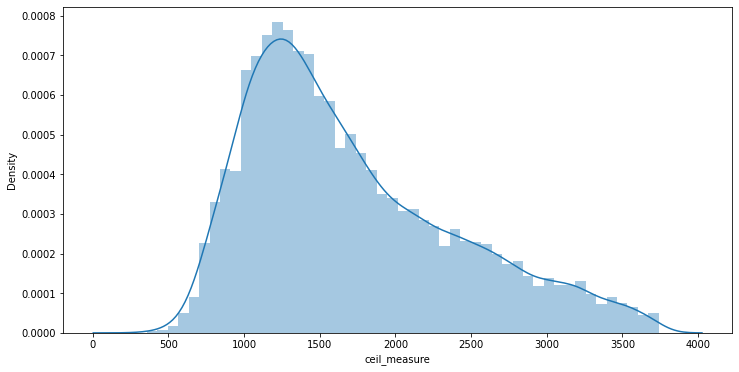

In [113]:
# ceil_measure
print("Skewness is :", df.ceil_measure.skew())
plt.figure(figsize=(12,6))
sns.distplot(df.ceil_measure)
df.ceil_measure.describe()

After treating outliers of ceil_measure, the data has reduced by about 600(~3%) data points but data is nicely distributed

# Removing oultier from basement

In [114]:
lowerbound_base,upperbound_base = outlier_removal(df.basement)
print(lowerbound_base,upperbound_base)

-855.0 1425.0


In [115]:
df[(df.basement < lowerbound_base) | (df.basement > upperbound_base)]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,long,living_measure15,lot_measure15,furnished,total_area,month/year,price_bins,has_basement,house_land_ratio,has_renovated
1724,1424059154,2014-05-16,1270000,4.0,3.00,5520.0,8313.0,2.0,0.0,3.0,...,-122.129,3770.0,8278.0,1.0,13833.0,May/2014,7,Yes,40.0,No
1576,5152100060,2014-05-29,472000,6.0,2.50,4410.0,14034.0,1.0,0.0,2.0,...,-122.324,2600.0,13988.0,1.0,18444.0,May/2014,3,Yes,24.0,No
20475,9322800210,2014-05-20,879950,4.0,2.25,3500.0,13875.0,1.0,0.0,4.0,...,-122.388,2960.0,15000.0,1.0,17375.0,May/2014,5,Yes,20.0,No
4347,3623500205,2014-05-13,2450000,4.0,4.50,5030.0,11023.0,2.0,0.0,2.0,...,-122.236,3640.0,11490.0,1.0,16053.0,May/2014,13,Yes,31.0,No
4400,7784400130,2014-05-05,497300,6.0,2.75,3200.0,9200.0,1.0,0.0,2.0,...,-122.364,2220.0,9500.0,0.0,12400.0,May/2014,3,Yes,26.0,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2506,7964410100,2015-05-04,700000,4.0,3.50,5360.0,25800.0,1.0,0.0,0.0,...,-122.054,2650.0,21781.0,1.0,31160.0,May/2015,4,Yes,17.0,No
4016,1742800430,2015-05-04,463828,5.0,1.75,3250.0,13702.0,1.0,0.0,2.0,...,-122.225,2620.0,11328.0,0.0,16952.0,May/2015,2,Yes,19.0,No
9621,1822079046,2015-05-04,500000,3.0,2.00,3040.0,41072.0,1.0,0.0,0.0,...,-121.972,2230.0,54014.0,0.0,44112.0,May/2015,3,Yes,7.0,No
4248,1925069082,2015-05-11,2200000,5.0,4.25,4640.0,22703.0,2.0,1.0,4.0,...,-122.097,3140.0,14200.0,0.0,27343.0,May/2015,11,Yes,17.0,No


 We got 408 records as outliers, let's drop these outliers

In [116]:
# dropping the record from the dataset
df.drop(df[ (df.basement > upperbound_base) | (df.basement < lowerbound_base) ].index, inplace=True)

In [117]:
df.shape

(20594, 28)

<AxesSubplot:xlabel='basement', ylabel='Density'>

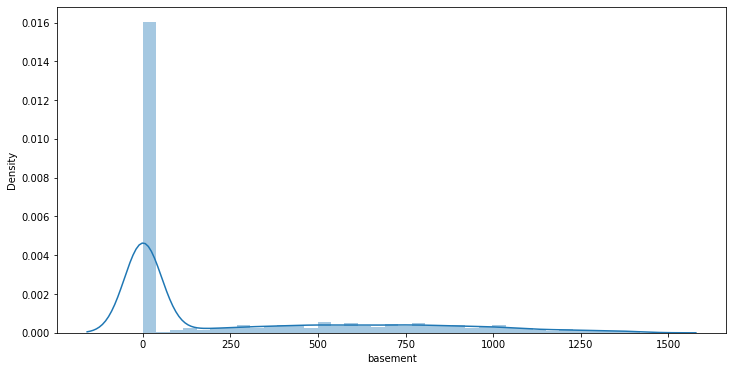

In [118]:
# basement_measure
plt.figure(figsize=(12,6))
sns.distplot(df.basement)

After treating outliers of basement, we can see that 400(~2%) data points got imputed. Total about 5% data has been imputed after treating ceil_measure and basement.

<AxesSubplot:xlabel='basement'>

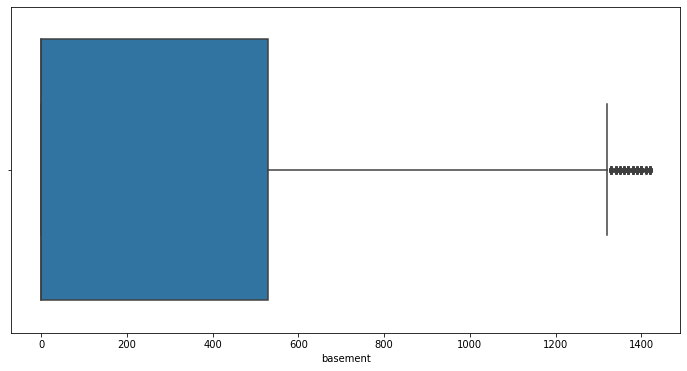

In [119]:
# boxplot now for basement
plt.figure(figsize=(12,6))
sns.boxplot(df['basement'])

# Removing oultier from living_measure

In [120]:
lowerbound_lim,upperbound_lim = outlier_removal(df.living_measure)
print(lowerbound_lim,upperbound_lim)

-160.0 4000.0


In [121]:
df[(df.living_measure < lowerbound_lim) | (df.living_measure > upperbound_lim)]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,long,living_measure15,lot_measure15,furnished,total_area,month/year,price_bins,has_basement,house_land_ratio,has_renovated
14696,723000114,2014-05-05,1400000,5.0,3.50,4010.0,8510.0,2.0,0.0,1.0,...,-122.286,2610.0,6128.0,1.0,12520.0,May/2014,7,Yes,32.0,No
9776,251620090,2014-05-30,2400000,4.0,3.25,4140.0,20734.0,1.0,0.0,1.0,...,-122.215,4020.0,20008.0,1.0,24874.0,May/2014,12,Yes,17.0,Yes
15200,1338600225,2014-05-28,1970000,8.0,3.50,4440.0,6480.0,2.0,0.0,3.0,...,-122.303,4440.0,8640.0,1.0,10920.0,May/2014,10,Yes,41.0,No
2693,8562710250,2014-05-05,890000,4.0,4.25,4420.0,5750.0,2.0,0.0,0.0,...,-122.073,4420.0,5750.0,1.0,10170.0,May/2014,5,Yes,43.0,No
13385,3758900075,2014-05-07,1530000,5.0,4.50,4270.0,8076.0,2.0,0.0,0.0,...,-122.206,4100.0,10631.0,1.0,12346.0,May/2014,8,Yes,35.0,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18375,8562720420,2015-04-30,1350000,4.0,3.50,4740.0,8611.0,2.0,0.0,3.0,...,-122.070,4042.0,8321.0,1.0,13351.0,April/2015,7,Yes,36.0,No
8258,2421059090,2015-05-11,640000,4.0,2.50,4090.0,215186.0,2.0,0.0,0.0,...,-122.116,2430.0,142005.0,0.0,219276.0,May/2015,3,Yes,2.0,No
9506,1525069088,2015-05-04,442500,5.0,3.25,4240.0,226097.0,2.0,0.0,0.0,...,-122.017,2980.0,217800.0,0.0,230337.0,May/2015,2,Yes,2.0,No
14071,5428000070,2015-05-11,770000,5.0,3.50,4750.0,8234.0,2.0,0.0,2.0,...,-122.318,2160.0,14496.0,1.0,12984.0,May/2015,4,Yes,37.0,No


We got 178 records as outliers. Let's treat this by dropping

In [122]:
# dropping the record from the dataset
df.drop(df[ (df.living_measure > upperbound_lim) | (df.living_measure < lowerbound_lim) ].index, inplace=True)

<AxesSubplot:xlabel='living_measure'>

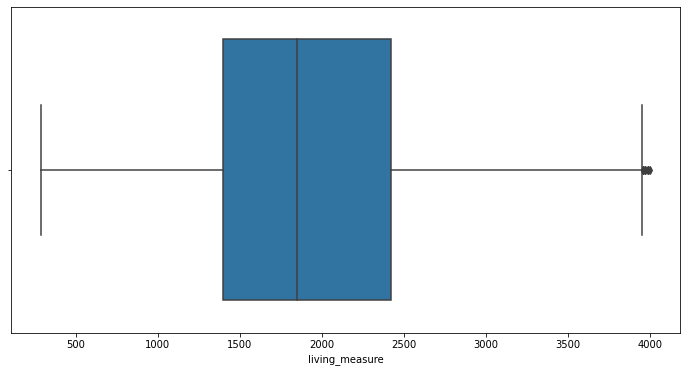

In [123]:
# boxplot after dropping the outliers
plt.figure(figsize=(12,6))
sns.boxplot(df['living_measure'])

<AxesSubplot:xlabel='living_measure', ylabel='Density'>

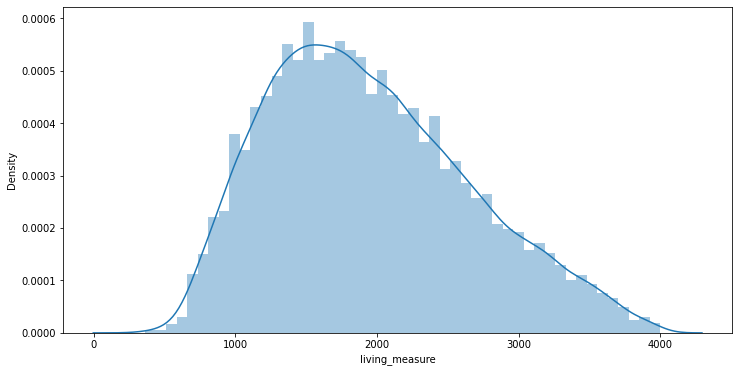

In [124]:
plt.figure(figsize=(12,6))
sns.distplot(df.living_measure)

 By treating outliers of living_measure, we lost 178 data points more and data distribution looks normal

In [125]:
# shape of the data after removing outliers in living_column
df.shape

(20416, 28)

# Removing oultier from lot_measure

In [126]:
lowerbound_lom,upperbound_lom = outlier_removal(df.lot_measure)
print(lowerbound_lom,upperbound_lom)

-2768.5 17947.5


In [127]:
df[(df.lot_measure < lowerbound_lom) | (df.lot_measure > upperbound_lom)]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,long,living_measure15,lot_measure15,furnished,total_area,month/year,price_bins,has_basement,house_land_ratio,has_renovated
20407,320069049,2014-05-14,305000,4.0,1.50,1590.0,131551.0,1.0,0.0,3.0,...,-122.024,2280.0,108028.0,0.0,133141.0,May/2014,2,No,1.0,No
10566,2322069168,2014-05-07,630000,3.0,2.50,2680.0,327135.0,2.0,0.0,0.0,...,-122.003,2020.0,60080.0,0.0,329815.0,May/2014,3,No,1.0,No
1718,3323059027,2014-05-28,326000,3.0,2.75,1720.0,28000.0,1.0,0.0,0.0,...,-122.176,2000.0,41817.0,0.0,29720.0,May/2014,2,No,6.0,No
18962,587550340,2014-05-02,604000,3.0,2.50,3240.0,33151.0,2.0,0.0,2.0,...,-122.378,4050.0,24967.0,1.0,36391.0,May/2014,3,No,9.0,No
20401,124069032,2014-05-05,600000,3.0,1.75,1670.0,39639.0,1.0,0.0,0.0,...,-121.989,2330.0,30492.0,0.0,41309.0,May/2014,3,No,4.0,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,7932000041,2015-05-12,602500,2.0,2.50,3090.0,47044.0,1.0,0.0,0.0,...,-122.177,1860.0,62829.0,1.0,50134.0,May/2015,3,Yes,6.0,No
13854,1324079085,2015-05-04,378000,3.0,1.50,1050.0,57499.0,1.0,0.0,0.0,...,-121.860,1460.0,42688.0,0.0,58549.0,May/2015,2,No,2.0,No
20733,5561000330,2015-05-05,525000,3.0,1.75,2620.0,38350.0,1.0,0.0,0.0,...,-121.991,2170.0,36962.0,0.0,40970.0,May/2015,3,Yes,6.0,No
19141,626059220,2015-05-06,532500,4.0,2.00,2220.0,23750.0,1.0,0.0,0.0,...,-122.214,2650.0,21167.0,0.0,25970.0,May/2015,3,No,9.0,No


 We got 2155 records which are outliers. Let's drop these outlier records.

In [128]:
# dropping the record from the dataset
df.drop(df[ (df.lot_measure > upperbound_lom) | (df.lot_measure < lowerbound_lom) ].index, inplace=True)

<AxesSubplot:xlabel='lot_measure'>

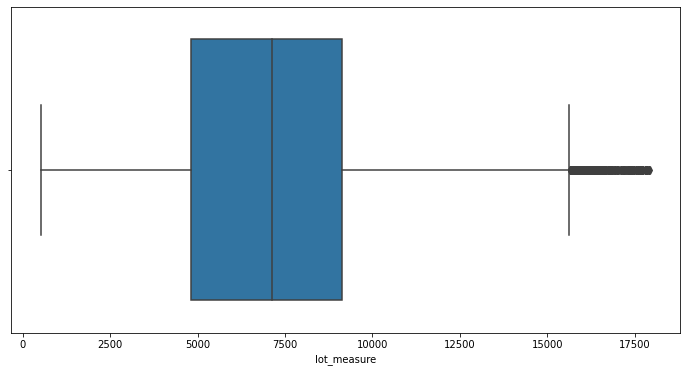

In [129]:
# plotting after removing outliers
plt.figure(figsize=(12,6))
sns.boxplot(df['lot_measure'])

In [130]:
df.shape

(18292, 28)

Total outliers in the lot_measure are 2128 data points. But still we are going ahead with imputing the data. We will analyze later whether there is any impact on the data set or not. 

# Removing oultier from room_bed

In [131]:
#As we know for room_bed = 33 was outlier from our earlier findings, let's see the record and drop it
df[df['room_bed']==33]

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,long,living_measure15,lot_measure15,furnished,total_area,month/year,price_bins,has_basement,house_land_ratio,has_renovated
16913,2402100895,2014-06-25,640000,33.0,1.75,1620.0,6000.0,1.0,0.0,0.0,...,-122.331,1330.0,4700.0,0.0,7620.0,June/2014,3,Yes,21.0,No


In [132]:
# dropping the record from the dataset
df.drop(df[ (df.room_bed == 33) ].index, inplace=True)

In [133]:
df.shape

(18291, 28)

 In summary, after treating outliers, we have lost about 15% of the data. We will analyse the impact of this data loss during the model evaluation.

In [134]:
#let's see the feature/columns and drop the unneccessary features
df.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area', 'month/year', 'price_bins', 'has_basement',
       'house_land_ratio', 'has_renovated'],
      dtype='object')

As we already have this information in other features. We will drop the unwanted columns from new copied dataframe instance : cid,dayhours,yr_renovated,zipcode,lat,long,county,type

In [135]:
# Creating another dataframe for modeling part which we use later
df_model=df.copy()

In [136]:
df_model.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,...,long,living_measure15,lot_measure15,furnished,total_area,month/year,price_bins,has_basement,house_land_ratio,has_renovated
12235,1425059178,2014-05-07,460000,3.0,2.00,1760.0,9055.0,2.0,0.0,0.0,...,-122.128,2010.0,9383.0,0.0,10815.0,May/2014,2,No,16.0,No
14791,7942601475,2014-05-20,345600,5.0,3.50,2800.0,5120.0,2.5,0.0,0.0,...,-122.310,1780.0,5120.0,1.0,7920.0,May/2014,2,No,35.0,Yes
1742,5652600185,2014-05-02,750000,3.0,1.75,2240.0,10578.0,2.0,0.0,0.0,...,-122.292,1570.0,10578.0,0.0,12818.0,May/2014,4,Yes,17.0,No
17829,3529200190,2014-05-14,325000,3.0,2.50,2220.0,6049.0,2.0,0.0,0.0,...,-122.182,1980.0,7226.0,0.0,8269.0,May/2014,2,No,27.0,No
14810,5631500992,2014-05-15,390000,3.0,2.50,2240.0,10800.0,2.0,0.0,0.0,...,-122.229,1900.0,9900.0,0.0,13040.0,May/2014,2,No,17.0,No


New instance of dataframe for model created successfully

In [137]:
#let's verify the columns
df_model.columns

Index(['cid', 'dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area', 'month/year', 'price_bins', 'has_basement',
       'house_land_ratio', 'has_renovated'],
      dtype='object')

In [138]:
#Dropping the feature not required in 1st Iteration
df_final=df_model.drop(['cid','yr_renovated','zipcode','lat','long',],axis=1)

In [139]:
df_final.shape

(18291, 23)

In [140]:
df_final.head()

,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,...,yr_built,living_measure15,lot_measure15,furnished,total_area,month/year,price_bins,has_basement,house_land_ratio,has_renovated
12235,2014-05-07,460000,3.0,2.00,1760.0,9055.0,2.0,0.0,0.0,4.0,...,1985.0,2010.0,9383.0,0.0,10815.0,May/2014,2,No,16.0,No
14791,2014-05-20,345600,5.0,3.50,2800.0,5120.0,2.5,0.0,0.0,3.0,...,1903.0,1780.0,5120.0,1.0,7920.0,May/2014,2,No,35.0,Yes
1742,2014-05-02,750000,3.0,1.75,2240.0,10578.0,2.0,0.0,0.0,5.0,...,1923.0,1570.0,10578.0,0.0,12818.0,May/2014,4,Yes,17.0,No
17829,2014-05-14,325000,3.0,2.50,2220.0,6049.0,2.0,0.0,0.0,4.0,...,1990.0,1980.0,7226.0,0.0,8269.0,May/2014,2,No,27.0,No
14810,2014-05-15,390000,3.0,2.50,2240.0,10800.0,2.0,0.0,0.0,3.0,...,1996.0,1900.0,9900.0,0.0,13040.0,May/2014,2,No,17.0,No


In [141]:
df_final.columns

Index(['dayhours', 'price', 'room_bed', 'room_bath', 'living_measure',
       'lot_measure', 'ceil', 'coast', 'sight', 'condition', 'quality',
       'ceil_measure', 'basement', 'yr_built', 'living_measure15',
       'lot_measure15', 'furnished', 'total_area', 'month/year', 'price_bins',
       'has_basement', 'house_land_ratio', 'has_renovated'],
      dtype='object')

In [142]:
df_final.to_csv("innercity_new.csv",index=False)

# Feature Scaling

In [143]:
df_final

,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,...,yr_built,living_measure15,lot_measure15,furnished,total_area,month/year,price_bins,has_basement,house_land_ratio,has_renovated
12235,2014-05-07,460000,3.0,2.00,1760.0,9055.0,2.0,0.0,0.0,4.0,...,1985.0,2010.0,9383.0,0.0,10815.0,May/2014,2,No,16.0,No
14791,2014-05-20,345600,5.0,3.50,2800.0,5120.0,2.5,0.0,0.0,3.0,...,1903.0,1780.0,5120.0,1.0,7920.0,May/2014,2,No,35.0,Yes
1742,2014-05-02,750000,3.0,1.75,2240.0,10578.0,2.0,0.0,0.0,5.0,...,1923.0,1570.0,10578.0,0.0,12818.0,May/2014,4,Yes,17.0,No
17829,2014-05-14,325000,3.0,2.50,2220.0,6049.0,2.0,0.0,0.0,4.0,...,1990.0,1980.0,7226.0,0.0,8269.0,May/2014,2,No,27.0,No
14810,2014-05-15,390000,3.0,2.50,2240.0,10800.0,2.0,0.0,0.0,3.0,...,1996.0,1900.0,9900.0,0.0,13040.0,May/2014,2,No,17.0,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3495,2015-05-11,210000,2.0,1.00,990.0,8140.0,1.0,0.0,0.0,1.0,...,1910.0,2150.0,5000.0,0.0,9130.0,May/2015,1,No,11.0,No
13781,2015-05-04,617450,3.0,2.25,1580.0,14398.0,1.0,0.0,0.0,3.0,...,1981.0,1840.0,14407.0,0.0,15978.0,May/2015,3,Yes,10.0,No
9980,2015-05-06,545000,3.0,2.00,1900.0,9975.0,1.0,0.0,0.0,3.0,...,1973.0,2140.0,9825.0,0.0,11875.0,May/2015,3,Yes,16.0,No
3462,2015-05-05,603000,4.0,3.50,3610.0,6345.0,2.0,0.0,0.0,3.0,...,2008.0,3010.0,29279.0,1.0,9955.0,May/2015,3,Yes,36.0,No


In [144]:
df_target=df_final.drop(['price', 'dayhours', 'month/year', 'price_bins',
       'has_basement', 'house_land_ratio', 'has_renovated'],axis=1)
nrm = Normalizer()
nrm.fit(df_target)
normal_data = nrm.transform(df_target)

here we are droping the extra added columns and doing the feature scaling using the minmax scaling

# Applying TSNE for clustering our data.

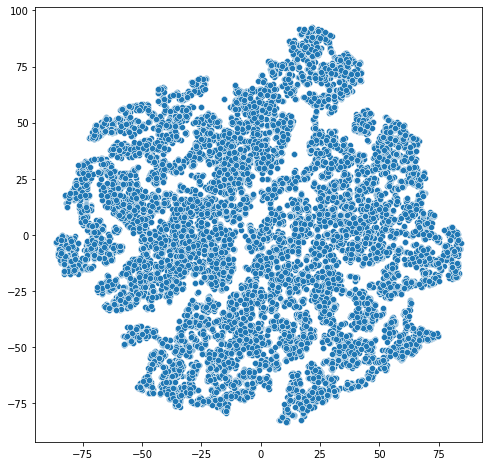

In [145]:
tsn = TSNE(random_state=10)
res_tsne = tsn.fit_transform(normal_data)
plt.figure(figsize=(8,8))
sns.scatterplot(res_tsne[:,0],res_tsne[:,1]);

By this plot we can commit that it is noisy or not. Try to cluster the data:

# Clustering

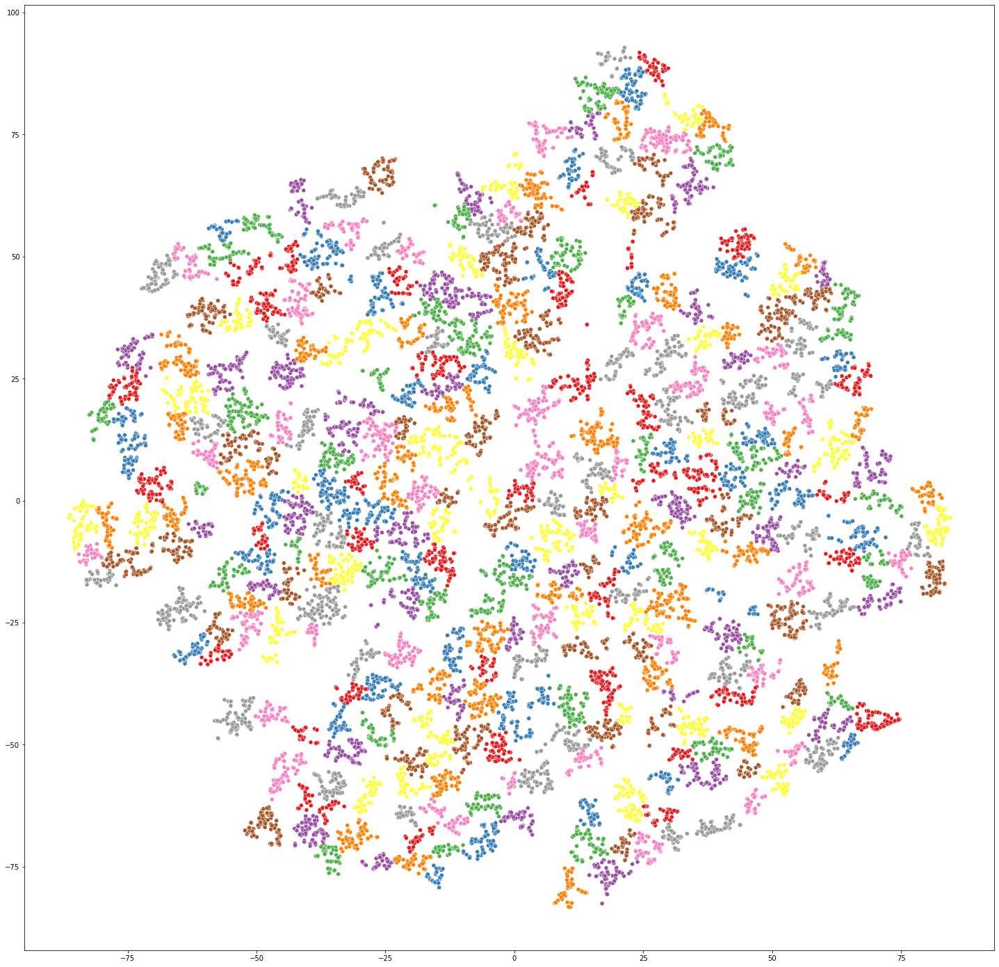

In [146]:
ward_res = ward(res_tsne)
vb = fcluster(ward_res,t=30, criterion='distance')
plt.figure(figsize=(25,25))
ax=sns.scatterplot(x=res_tsne[:,0],y=res_tsne[:,1],hue=vb,palette="Set1");
ax.get_legend().remove()

keeping the value of t (threshold to apply when forming flat clusters) = 30 then we can see the small cluster on the basis of there properties

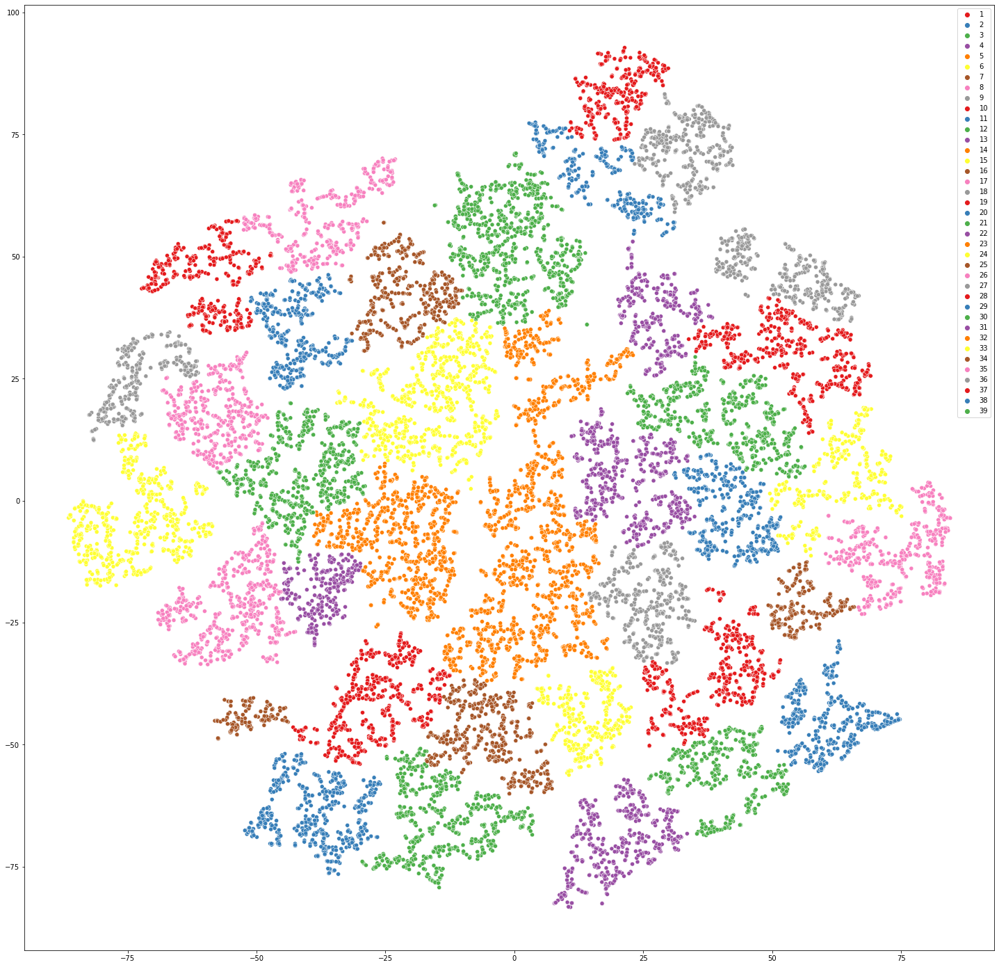

In [147]:
ward_res = ward(res_tsne)
vb = fcluster(ward_res,t=300, criterion='distance')
plt.figure(figsize=(25,25))
sns.scatterplot(x=res_tsne[:,0],y=res_tsne[:,1],hue=vb,palette="Set1");

keeping the value of t (threshold to apply when forming flat clusters) = 300 then we can see the small cluster on the basis of there properties we can see the number of cluster decreased to 40

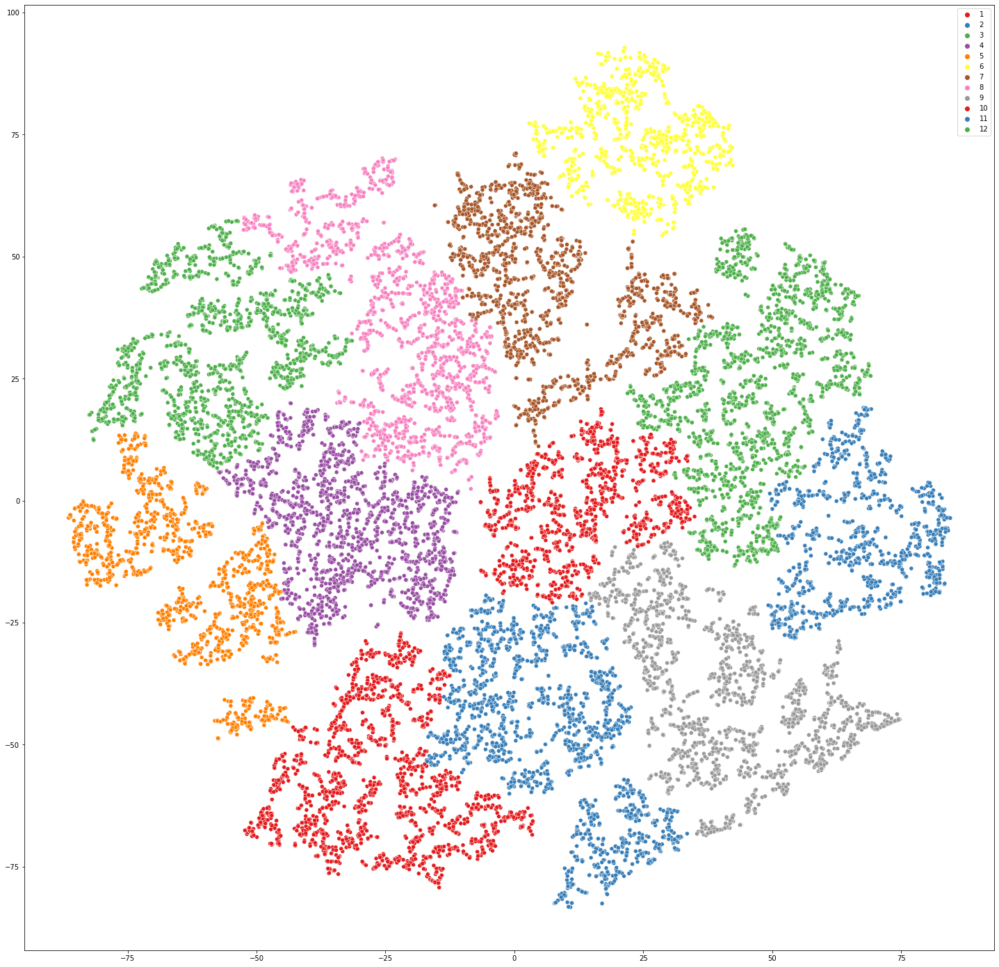

In [148]:
ward_res = ward(res_tsne)
vb = fcluster(ward_res,t=1000, criterion='distance')
plt.figure(figsize=(25,25))
sns.scatterplot(x=res_tsne[:,0],y=res_tsne[:,1],hue=vb,palette="Set1");


keeping the value of t (threshold to apply when forming flat clusters) = 1000 then we can see the small cluster on the basis of there properties we can see the number of cluster decreased to 13

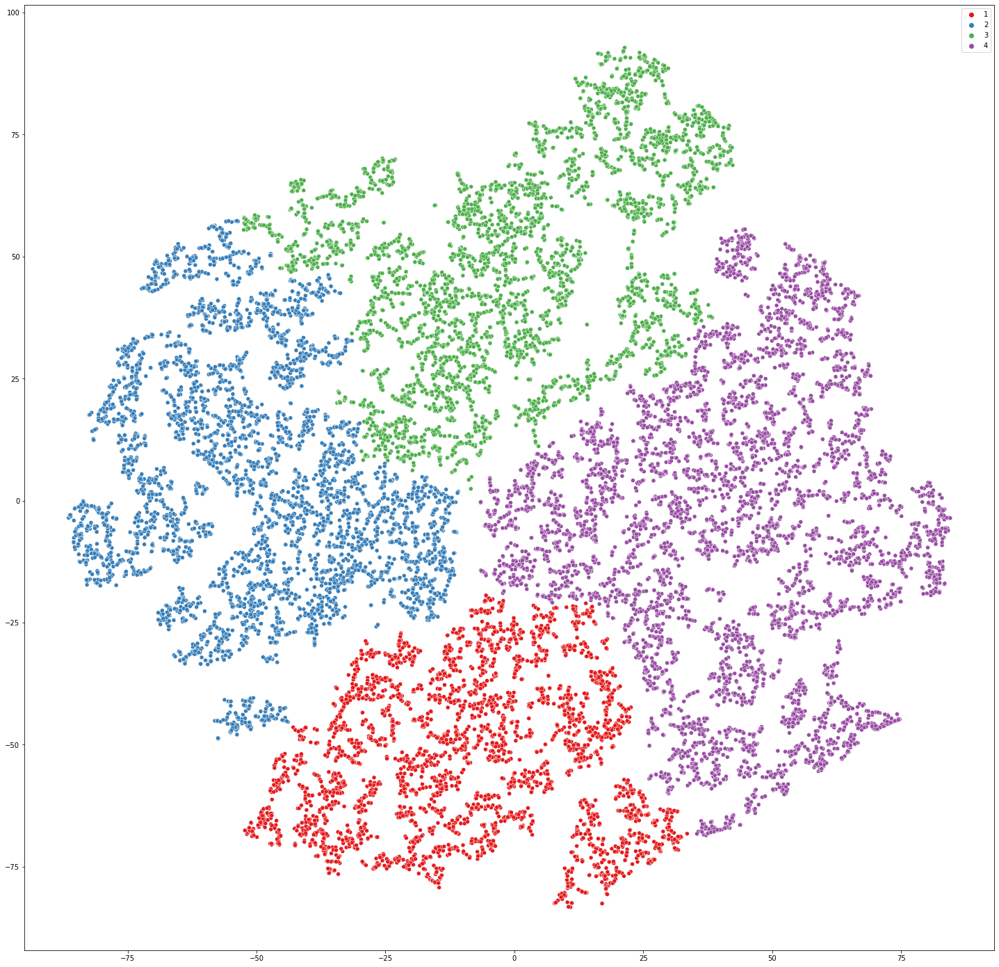

In [149]:
ward_res = ward(res_tsne)
vb = fcluster(ward_res,t=3000, criterion='distance')
plt.figure(figsize=(25,25))
sns.scatterplot(x=res_tsne[:,0],y=res_tsne[:,1],hue=vb,palette="Set1");


 keeping the value of t (threshold to apply when forming flat clusters) = 3000 then we can see the small cluster on the basis of there properties we can see the number of cluster decreased to 13

### Clustering on the basics of price

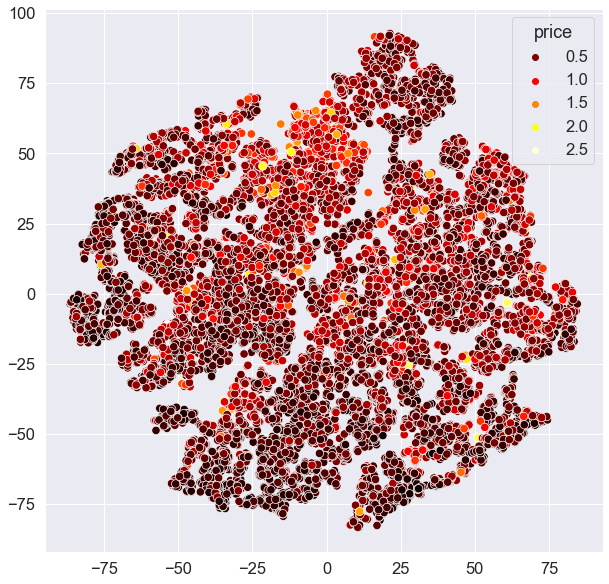

In [150]:
plt.figure(figsize=(10,10))
sns.set(font_scale=1.5)
sns.scatterplot(x=res_tsne[:,0],y=res_tsne[:,1],hue=df_final['price'],s=70,palette="hot");

From this we can conclude that the houses having hight prices are 

# Importing Libraries

In [151]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [152]:
from sklearn.model_selection import train_test_split
#importing the necessary libraries
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingRegressor, BaggingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from xgboost.sklearn import XGBRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV

from sklearn import metrics
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error


# Importing the data

In [153]:
df=pd.read_csv('innercity_new.csv')

In [154]:
df

,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,...,yr_built,living_measure15,lot_measure15,furnished,total_area,month/year,price_bins,has_basement,house_land_ratio,has_renovated
0,2014-05-07,460000,3.0,2.00,1760.0,9055.0,2.0,0.0,0.0,4.0,...,1985.0,2010.0,9383.0,0.0,10815.0,May/2014,2,No,16.0,No
1,2014-05-20,345600,5.0,3.50,2800.0,5120.0,2.5,0.0,0.0,3.0,...,1903.0,1780.0,5120.0,1.0,7920.0,May/2014,2,No,35.0,Yes
2,2014-05-02,750000,3.0,1.75,2240.0,10578.0,2.0,0.0,0.0,5.0,...,1923.0,1570.0,10578.0,0.0,12818.0,May/2014,4,Yes,17.0,No
3,2014-05-14,325000,3.0,2.50,2220.0,6049.0,2.0,0.0,0.0,4.0,...,1990.0,1980.0,7226.0,0.0,8269.0,May/2014,2,No,27.0,No
4,2014-05-15,390000,3.0,2.50,2240.0,10800.0,2.0,0.0,0.0,3.0,...,1996.0,1900.0,9900.0,0.0,13040.0,May/2014,2,No,17.0,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18286,2015-05-11,210000,2.0,1.00,990.0,8140.0,1.0,0.0,0.0,1.0,...,1910.0,2150.0,5000.0,0.0,9130.0,May/2015,1,No,11.0,No
18287,2015-05-04,617450,3.0,2.25,1580.0,14398.0,1.0,0.0,0.0,3.0,...,1981.0,1840.0,14407.0,0.0,15978.0,May/2015,3,Yes,10.0,No
18288,2015-05-06,545000,3.0,2.00,1900.0,9975.0,1.0,0.0,0.0,3.0,...,1973.0,2140.0,9825.0,0.0,11875.0,May/2015,3,Yes,16.0,No
18289,2015-05-05,603000,4.0,3.50,3610.0,6345.0,2.0,0.0,0.0,3.0,...,2008.0,3010.0,29279.0,1.0,9955.0,May/2015,3,Yes,36.0,No


In [155]:
# shape of the data
df.shape

(18291, 23)

In [156]:
#let's drop the some column
df=df.drop(['dayhours','month/year','price_bins'],axis=1)

In [157]:
df.columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'basement', 'yr_built', 'living_measure15', 'lot_measure15',
       'furnished', 'total_area', 'has_basement', 'house_land_ratio',
       'has_renovated'],
      dtype='object')

In [158]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18291 entries, 0 to 18290
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             18291 non-null  int64  
 1   room_bed          18291 non-null  float64
 2   room_bath         18291 non-null  float64
 3   living_measure    18291 non-null  float64
 4   lot_measure       18291 non-null  float64
 5   ceil              18291 non-null  float64
 6   coast             18291 non-null  float64
 7   sight             18291 non-null  float64
 8   condition         18291 non-null  float64
 9   quality           18291 non-null  float64
 10  ceil_measure      18291 non-null  float64
 11  basement          18291 non-null  float64
 12  yr_built          18291 non-null  float64
 13  living_measure15  18291 non-null  float64
 14  lot_measure15     18291 non-null  float64
 15  furnished         18291 non-null  float64
 16  total_area        18291 non-null  float6

##### Creating dummies for categorical variables: 'room_bed', 'room_bath', 'ceil', 'coast', 'sight', 'condition', 'quality', 'furnished','City', 'has_basement', 'has_renovated'

In [159]:
# Getting dummies 
dff = pd.get_dummies(df, columns=['room_bed', 'room_bath', 'ceil', 'coast', 'sight', 'condition', 'quality', 'furnished', 
                                        'has_basement', 'has_renovated'],drop_first=True)

In [160]:
# shape of the data
dff.shape

(18291, 68)

In [161]:
# let's see the data types of the features
dff.columns

Index(['price', 'living_measure', 'lot_measure', 'ceil_measure', 'basement',
       'yr_built', 'living_measure15', 'lot_measure15', 'total_area',
       'house_land_ratio', 'room_bed_1.0', 'room_bed_2.0', 'room_bed_3.0',
       'room_bed_4.0', 'room_bed_5.0', 'room_bed_6.0', 'room_bed_7.0',
       'room_bed_8.0', 'room_bed_9.0', 'room_bed_10.0', 'room_bed_11.0',
       'room_bath_0.5', 'room_bath_0.75', 'room_bath_1.0', 'room_bath_1.25',
       'room_bath_1.5', 'room_bath_1.75', 'room_bath_2.0', 'room_bath_2.25',
       'room_bath_2.5', 'room_bath_2.75', 'room_bath_3.0', 'room_bath_3.25',
       'room_bath_3.5', 'room_bath_3.75', 'room_bath_4.0', 'room_bath_4.25',
       'room_bath_4.5', 'room_bath_4.75', 'room_bath_5.0', 'room_bath_5.25',
       'room_bath_5.75', 'ceil_1.5', 'ceil_2.0', 'ceil_2.5', 'ceil_3.0',
       'ceil_3.5', 'coast_1.0', 'sight_1.0', 'sight_2.0', 'sight_3.0',
       'sight_4.0', 'condition_2.0', 'condition_3.0', 'condition_4.0',
       'condition_5.0', 'quality_4

# Checking fo Multi-Collinearity using VIF


In [162]:
!pip install statsmodels

In [163]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["features"] = dff.columns
vif["vif_Factor"] = [variance_inflation_factor(dff.values, i) for i in range(dff.shape[1])]
vif

,features,vif_Factor
0,price,11.918935
1,living_measure,8597.482058
2,lot_measure,40.963174
3,ceil_measure,6580.844536
4,basement,439.837724
...,...,...
63,quality_11.0,60.054393
64,quality_12.0,2.565603
65,furnished_1.0,653.162962
66,has_basement_Yes,7.329076


As we can see most of the values are greater then 10 then the data is highly corelated

# Checking significance of variable using p value 

In [164]:
data_new=dff.drop(['price'],axis=1)
selected_columns=data_new.columns

In [165]:
import statsmodels.api as sm
def backwardElimination(x, Y, sl, columns):
    numVars = len(x[0])
    for i in range(0, numVars):
        regressor_OLS = sm.OLS(Y, x).fit()
        maxVar = max(regressor_OLS.pvalues).astype(float)
        if maxVar > sl:
            for j in range(0, numVars - i):
                if (regressor_OLS.pvalues[j].astype(float) == maxVar):
                    x = np.delete(x, j, 1)
                    columns = np.delete(columns, j)
                    
    regressor_OLS.summary()
    return x, columns

In [166]:
SL = 0.05
data_modeled, selected_columns = backwardElimination(data_new.values,dff['price'].values, SL, selected_columns)


In [167]:
result = pd.DataFrame()
result['price'] = dff.iloc[:,0]

In [168]:
dff.iloc[:,0]

0        460000
1        345600
2        750000
3        325000
4        390000
          ...  
18286    210000
18287    617450
18288    545000
18289    603000
18290    370000
Name: price, Length: 18291, dtype: int64

In [169]:
dff

,price,living_measure,lot_measure,ceil_measure,basement,yr_built,living_measure15,lot_measure15,total_area,house_land_ratio,...,quality_6.0,quality_7.0,quality_8.0,quality_9.0,quality_10.0,quality_11.0,quality_12.0,furnished_1.0,has_basement_Yes,has_renovated_Yes
0,460000,1760.0,9055.0,1760.0,0.0,1985.0,2010.0,9383.0,10815.0,16.0,...,0,1,0,0,0,0,0,0,0,0
1,345600,2800.0,5120.0,2800.0,0.0,1903.0,1780.0,5120.0,7920.0,35.0,...,0,0,0,1,0,0,0,1,0,1
2,750000,2240.0,10578.0,1550.0,690.0,1923.0,1570.0,10578.0,12818.0,17.0,...,0,0,1,0,0,0,0,0,1,0
3,325000,2220.0,6049.0,2220.0,0.0,1990.0,1980.0,7226.0,8269.0,27.0,...,0,0,1,0,0,0,0,0,0,0
4,390000,2240.0,10800.0,2240.0,0.0,1996.0,1900.0,9900.0,13040.0,17.0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18286,210000,990.0,8140.0,990.0,0.0,1910.0,2150.0,5000.0,9130.0,11.0,...,1,0,0,0,0,0,0,0,0,0
18287,617450,1580.0,14398.0,1080.0,500.0,1981.0,1840.0,14407.0,15978.0,10.0,...,0,1,0,0,0,0,0,0,1,0
18288,545000,1900.0,9975.0,1500.0,400.0,1973.0,2140.0,9825.0,11875.0,16.0,...,0,0,1,0,0,0,0,0,1,0
18289,603000,3610.0,6345.0,2370.0,1240.0,2008.0,3010.0,29279.0,9955.0,36.0,...,0,0,0,1,0,0,0,1,1,0


In [170]:
data_f1 = pd.DataFrame(data = data_modeled, columns = selected_columns)
data_f1

,living_measure,lot_measure,ceil_measure,yr_built,living_measure15,lot_measure15,total_area,house_land_ratio,room_bed_1.0,room_bed_2.0,...,quality_5.0,quality_6.0,quality_7.0,quality_8.0,quality_9.0,quality_10.0,quality_11.0,quality_12.0,has_basement_Yes,has_renovated_Yes
0,1760.0,9055.0,1760.0,1985.0,2010.0,9383.0,10815.0,16.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2800.0,5120.0,2800.0,1903.0,1780.0,5120.0,7920.0,35.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,2240.0,10578.0,1550.0,1923.0,1570.0,10578.0,12818.0,17.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,2220.0,6049.0,2220.0,1990.0,1980.0,7226.0,8269.0,27.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2240.0,10800.0,2240.0,1996.0,1900.0,9900.0,13040.0,17.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18286,990.0,8140.0,990.0,1910.0,2150.0,5000.0,9130.0,11.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18287,1580.0,14398.0,1080.0,1981.0,1840.0,14407.0,15978.0,10.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
18288,1900.0,9975.0,1500.0,1973.0,2140.0,9825.0,11875.0,16.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
18289,3610.0,6345.0,2370.0,2008.0,3010.0,29279.0,9955.0,36.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0


In [171]:
selected_columns

Index(['living_measure', 'lot_measure', 'ceil_measure', 'yr_built',
       'living_measure15', 'lot_measure15', 'total_area', 'house_land_ratio',
       'room_bed_1.0', 'room_bed_2.0', 'room_bed_3.0', 'room_bath_0.5',
       'room_bath_0.75', 'room_bath_1.0', 'room_bath_1.25', 'room_bath_1.5',
       'room_bath_1.75', 'room_bath_2.0', 'room_bath_2.25', 'room_bath_2.5',
       'room_bath_2.75', 'room_bath_3.0', 'room_bath_3.25', 'room_bath_3.5',
       'room_bath_3.75', 'room_bath_4.0', 'room_bath_4.25', 'room_bath_4.5',
       'room_bath_4.75', 'room_bath_5.0', 'room_bath_5.25', 'ceil_1.5',
       'ceil_2.5', 'ceil_3.0', 'ceil_3.5', 'coast_1.0', 'sight_1.0',
       'sight_2.0', 'sight_3.0', 'sight_4.0', 'condition_2.0', 'condition_3.0',
       'condition_4.0', 'condition_5.0', 'quality_4.0', 'quality_5.0',
       'quality_6.0', 'quality_7.0', 'quality_8.0', 'quality_9.0',
       'quality_10.0', 'quality_11.0', 'quality_12.0', 'has_basement_Yes',
       'has_renovated_Yes'],
      dtype

These are the selected feature which we can use for analysis

## Creating data for model training

In [172]:
#Creating X, y for training and testing set
X = data_f1
y = dff["price"]

In [173]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1)

In [174]:
print(X_train.shape, y_train.shape)
print(X_test.shape,y_test.shape)
print(X_val.shape, y_val.shape)

(10288, 55) (10288,)
(4573, 55) (4573,)
(3430, 55) (3430,)


# Function for mape and adjusted R2

In [175]:
def mape(y_true, y_pred):
    """
    This function calculates MAPE.
    :param y_true: list of real numbers, true values
    :param y_pred: list of real numbers, predicted values
    :returns: mean absolute percentage error
    """
    return np.mean(np.abs(np.array(y_pred) - np.array(y_true)) / np.array(y_true), axis=0)
def adjR(y_true, y_pred,p):
    R2=r2_score(y_true,y_pred)
    n=10
    return 1-(1-R2)*(n-1)/(n-p-1)

# Model building
Let's build the model and see their performances

#### Linear Regression (with Ridge and Lasso)

In [176]:
# defining the model
LR1 = LinearRegression()
LR1.fit(X_train, y_train)

# Making Predictions
y_LR1_predtr= LR1.predict(X_train)
y_LR1_predvl= LR1.predict(X_val)
y_LR1_predte= LR1.predict(X_test)

LR1.coef_

array([ 6.83433965e+01, -9.14884280e+00,  7.39224811e+00, -2.97854722e+03,
        7.16724920e+01, -1.62296850e+00,  8.33671894e+00,  2.34830691e+03,
        7.94171099e+03,  4.64742750e+04,  2.08682181e+04, -7.37420542e+04,
        4.13709210e+04,  5.98292051e+04,  7.80818153e+04,  6.68396423e+04,
        7.19486911e+04,  6.70831501e+04,  8.96763472e+04,  7.59588865e+04,
        7.73763100e+04,  1.04259458e+05,  1.35903003e+05,  1.47729681e+05,
        2.41644679e+05,  1.35409249e+05,  2.06211814e+05,  1.72731165e+05,
        1.02427212e+06,  5.05201812e+04, -1.80443749e-09,  3.04575144e+03,
        3.08275080e+04,  6.60278229e+04,  1.88171171e+05,  3.30778124e+05,
        4.55685040e+04,  6.01659431e+04,  9.14900125e+04,  2.56675691e+05,
        1.17480035e+05,  1.40066725e+05,  1.66284054e+05,  1.98980856e+05,
       -3.61525456e+05, -4.12853855e+05, -3.67183434e+05, -2.84107532e+05,
       -1.88408477e+05, -2.59022088e+04,  9.26994560e+04,  2.52628154e+05,
        1.29465335e+06,  

In [177]:
# Performance on train data
LR1_tr_R2score=r2_score(y_train,y_LR1_predtr)
LR1_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_LR1_predtr))
LR1_tr_MSE=mean_squared_error(y_train, y_LR1_predtr)
LR1_tr_MAE=mean_absolute_error(y_train, y_LR1_predtr)
LR1_tr_MAPE=mape(y_train, y_LR1_predtr)
LR1_tr_AR2=adjR(y_train, y_LR1_predtr,p=len(X.columns))

# Performance on val data
LR1_vl_R2score=r2_score(y_val,y_LR1_predvl)
LR1_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_LR1_predvl))
LR1_vl_MSE=mean_squared_error(y_val, y_LR1_predvl)
LR1_vl_MAE=mean_absolute_error(y_val, y_LR1_predvl)
LR1_vl_MAPE=mape(y_val, y_LR1_predvl)
LR1_vl_AR2=adjR(y_val, y_LR1_predvl,p=len(X.columns))

# Performance on test data
LR1_te_R2score=r2_score(y_test,y_LR1_predte)
LR1_te_RMSE=np.sqrt(mean_squared_error(y_test, y_LR1_predte))
LR1_te_MSE=mean_squared_error(y_test, y_LR1_predte)
LR1_te_MAE=mean_absolute_error(y_test, y_LR1_predte)
LR1_te_MAPE=mape(y_test, y_LR1_predte)
LR1_te_AR2=adjR(y_test, y_LR1_predte,p=len(X.columns))

model_comp=pd.DataFrame({'Algorithm':['Simple Linear Reg Model'],
                       'train Score':LR1_tr_R2score,'RMSE_tr': LR1_tr_RMSE, 'MSE_tr': LR1_tr_MSE, 'MAE_tr': LR1_tr_MAE,
                         "Mape_tr":LR1_tr_MAPE, "Adjusted_r2_tr":LR1_tr_AR2,
                        'Val Score':LR1_vl_R2score,'RMSE_vl': LR1_vl_RMSE, 'MSE_vl': LR1_vl_MSE, 'MAE_vl': LR1_vl_MAE,
                         "Mape_val":LR1_vl_MAPE, "Adjusted_r2_val":LR1_vl_AR2,
                      'test Score':LR1_te_R2score,'RMSE_te': LR1_te_RMSE, 'MSE_te': LR1_te_MSE, 'MAE_te': LR1_te_MAE,
                        "Mape_te":LR1_te_MAPE, "Adjusted_r2_te":LR1_te_AR2})
model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.07081,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924


The linear regression model performed with scores 0.62, 0.61 & 0.62 in training data set, validation data and test data set respectively

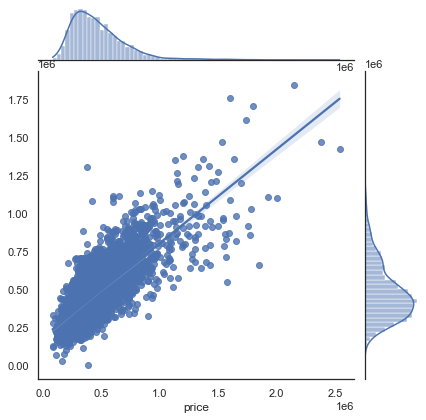

In [178]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_LR1_predvl, kind="reg")

#### Lasso model

In [179]:
# defining the model
Lasso1 = Lasso(alpha=1)
Lasso1.fit(X_train, y_train)

# Making Predictions
y_Lasso1_predtr= Lasso1.predict(X_train)
y_Lasso1_predvl= Lasso1.predict(X_val)
y_Lasso1_predte= Lasso1.predict(X_test)

Lasso1.coef_

array([ 6.84136155e+01, -9.15021335e+00,  7.25033349e+00, -2.97753319e+03,
        7.16715663e+01, -1.63031661e+00,  8.35746361e+00,  2.35328842e+03,
        7.60294818e+03,  4.65190320e+04,  2.09182904e+04, -1.28808130e+05,
       -1.86775236e+04, -5.42732467e+02,  1.64924807e+04,  6.42192023e+03,
        1.15455065e+04,  6.68893075e+03,  2.92524782e+04,  1.55635841e+04,
        1.69593649e+04,  4.38781807e+04,  7.54816701e+04,  8.72656244e+04,
        1.80976832e+05,  7.45628380e+04,  1.44739770e+05,  1.11960668e+05,
        9.58703959e+05, -4.54264213e+03,  0.00000000e+00,  3.09450147e+03,
        3.06727651e+04,  6.59104051e+04,  1.73943495e+05,  3.30528033e+05,
        4.50488017e+04,  6.00322570e+04,  9.14349780e+04,  2.56538935e+05,
        1.10891401e+05,  1.33650507e+05,  1.59865850e+05,  1.92579615e+05,
       -2.29790995e+05, -2.82076350e+05, -2.36386118e+05, -1.53351896e+05,
       -5.76159068e+04,  1.04922430e+05,  2.23548836e+05,  3.83449884e+05,
        1.42029584e+06,  

In [180]:
# Performance on train data
Lasso1_tr_R2score=r2_score(y_train,y_Lasso1_predtr)
Lasso1_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_Lasso1_predtr))
Lasso1_tr_MSE=mean_squared_error(y_train, y_Lasso1_predtr)
Lasso1_tr_MAE=mean_absolute_error(y_train, y_Lasso1_predtr)
Lasso1_tr_MAPE=mape(y_train, y_Lasso1_predtr)
Lasso1_tr_AR2=adjR(y_train, y_Lasso1_predtr,p=len(X.columns))

# Performance on val data
Lasso1_vl_R2score=r2_score(y_val,y_Lasso1_predvl)
Lasso1_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_Lasso1_predvl))
Lasso1_vl_MSE=mean_squared_error(y_val, y_Lasso1_predvl)
Lasso1_vl_MAE=mean_absolute_error(y_val, y_Lasso1_predvl)
Lasso1_vl_MAPE=mape(y_val, y_Lasso1_predvl)
Lasso1_vl_AR2=adjR(y_val, y_Lasso1_predvl,p=len(X.columns))

# Performance on test data
Lasso1_te_R2score=r2_score(y_test,y_Lasso1_predte)
Lasso1_te_RMSE=np.sqrt(mean_squared_error(y_test, y_Lasso1_predte))
Lasso1_te_MSE=mean_squared_error(y_test, y_Lasso1_predte)
Lasso1_te_MAE=mean_absolute_error(y_test, y_Lasso1_predte)
Lasso1_te_MAPE=mape(y_test, y_Lasso1_predte)
Lasso1_te_AR2=adjR(y_test, y_Lasso1_predte,p=len(X.columns))

Lasso1_df=pd.DataFrame({'Algorithm':['SLinear-Reg (Lasso)'],
                       'train Score':Lasso1_tr_R2score,'RMSE_tr': Lasso1_tr_RMSE, 'MSE_tr': Lasso1_tr_MSE, 'MAE_tr': Lasso1_tr_MAE,
                         "Mape_tr":Lasso1_tr_MAPE, "Adjusted_r2_tr":Lasso1_tr_AR2,
                        'Val Score':Lasso1_vl_R2score,'RMSE_vl': Lasso1_vl_RMSE, 'MSE_vl': Lasso1_vl_MSE, 'MAE_vl': Lasso1_vl_MAE,
                         "Mape_val":Lasso1_vl_MAPE, "Adjusted_r2_val":Lasso1_vl_AR2,
                      'test Score':Lasso1_te_R2score,'RMSE_te': Lasso1_te_RMSE, 'MSE_te': Lasso1_te_MSE, 'MAE_te': Lasso1_te_MAE,
                        "Mape_te":Lasso1_te_MAPE, "Adjusted_r2_te":Lasso1_te_AR2})
model_comp = pd.concat([model_comp, Lasso1_df]).reset_index(drop=True)

model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.070810,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924
1,SLinear-Reg (Lasso),0.638065,154636.497425,2.391245e+10,111286.325970,0.257109,1.070813,0.606626,154736.893644,2.394351e+10,111316.112298,0.268349,1.076965,0.597316,165053.923854,2.724280e+10,115648.922264,0.270838,1.078786


The lasso linear regression model performed with scores  0.62, 0.61 & 0.62 in training data set, validation data and test data set respectively. The coefficeints of 1 variable in lasso model is almost '0', signifying that the variable with '0' coefficient can be dropped.

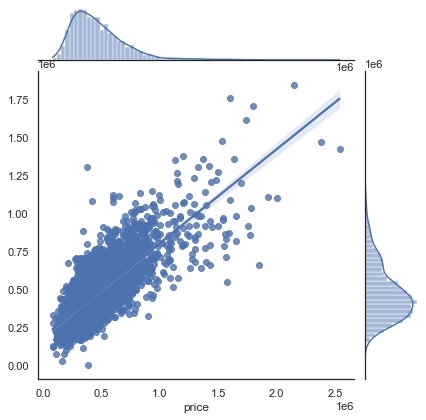

In [181]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_Lasso1_predvl, kind="reg")

# Ridge model

In [182]:
# defining the model
Ridge1 = Ridge(alpha=0.5)
Ridge1.fit(X_train, y_train)

# Making Predictions
y_Ridge1_predtr= Ridge1.predict(X_train)
y_Ridge1_predvl= Ridge1.predict(X_val)
y_Ridge1_predte= Ridge1.predict(X_test)

Ridge1.coef_

array([ 6.90624591e+01, -9.11808140e+00,  7.69690124e+00, -2.97730236e+03,
        7.16640909e+01, -1.63593280e+00,  8.38921724e+00,  2.37983415e+03,
        6.73298796e+03,  4.69374637e+04,  2.12468770e+04, -1.44842893e+05,
       -6.69976233e+04, -4.78285596e+04, -2.68900391e+04, -4.09952781e+04,
       -3.59817746e+04, -4.08445877e+04, -1.84604914e+04, -3.23134358e+04,
       -3.10105765e+04, -4.10320087e+03,  2.95561799e+04,  3.87510595e+04,
        1.31155671e+05,  2.57003445e+04,  9.19726915e+04,  6.24811383e+04,
        7.31534234e+05, -4.66044136e+04,  0.00000000e+00,  2.91031506e+03,
        3.01439422e+04,  6.57142222e+04,  1.50948386e+05,  3.25629946e+05,
        4.41740913e+04,  6.03425264e+04,  9.10662400e+04,  2.56352406e+05,
        9.18194164e+04,  1.15805901e+05,  1.41859467e+05,  1.74539472e+05,
       -3.18387525e+05, -3.82401048e+05, -3.38363905e+05, -2.55919437e+05,
       -1.60627959e+05,  1.29415074e+03,  1.19961176e+05,  2.79989014e+05,
        1.05445553e+06,  

In [183]:
# Performance on train data
Ridge1_tr_R2score=r2_score(y_train,y_Ridge1_predtr)
Ridge1_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_Ridge1_predtr))
Ridge1_tr_MSE=mean_squared_error(y_train, y_Ridge1_predtr)
Ridge1_tr_MAE=mean_absolute_error(y_train, y_Ridge1_predtr)
Ridge1_tr_MAPE=mape(y_train, y_Ridge1_predtr)
Ridge1_tr_AR2=adjR(y_train, y_Ridge1_predtr,p=len(X.columns))

# Performance on val data
Ridge1_vl_R2score=r2_score(y_val,y_Ridge1_predvl)
Ridge1_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_Ridge1_predvl))
Ridge1_vl_MSE=mean_squared_error(y_val, y_Ridge1_predvl)
Ridge1_vl_MAE=mean_absolute_error(y_val, y_Ridge1_predvl)
Ridge1_vl_MAPE=mape(y_val, y_Ridge1_predvl)
Ridge1_vl_AR2=adjR(y_val, y_Ridge1_predvl,p=len(X.columns))

# Performance on test data
Ridge1_te_R2score=r2_score(y_test,y_Ridge1_predte)
Ridge1_te_RMSE=np.sqrt(mean_squared_error(y_test, y_Ridge1_predte))
Ridge1_te_MSE=mean_squared_error(y_test, y_Ridge1_predte)
Ridge1_te_MAE=mean_absolute_error(y_test, y_Ridge1_predte)
Ridge1_te_MAPE=mape(y_test, y_Ridge1_predte)
Ridge1_te_AR2=adjR(y_test, y_Ridge1_predte,p=len(X.columns))

Ridge1_df=pd.DataFrame({'Algorithm':['SLinear-Reg (Ridge)'],
                       'train Score':Ridge1_tr_R2score,'RMSE_tr': Ridge1_tr_RMSE, 'MSE_tr': Ridge1_tr_MSE, 'MAE_tr': Ridge1_tr_MAE,
                         "Mape_tr":Ridge1_tr_MAPE, "Adjusted_r2_tr":Ridge1_tr_AR2,
                        'Val Score':Ridge1_vl_R2score,'RMSE_vl': Ridge1_vl_RMSE, 'MSE_vl': Ridge1_vl_MSE, 'MAE_vl': Ridge1_vl_MAE,
                         "Mape_val":Ridge1_vl_MAPE, "Adjusted_r2_val":Ridge1_vl_AR2,
                      'test Score':Ridge1_te_R2score,'RMSE_te': Ridge1_te_RMSE, 'MSE_te': Ridge1_te_MSE, 'MAE_te': Ridge1_te_MAE,
                        "Mape_te":Ridge1_te_MAPE, "Adjusted_r2_te":Ridge1_te_AR2})
model_comp = pd.concat([model_comp, Ridge1_df]).reset_index(drop=True)

model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.070810,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924
1,SLinear-Reg (Lasso),0.638065,154636.497425,2.391245e+10,111286.325970,0.257109,1.070813,0.606626,154736.893644,2.394351e+10,111316.112298,0.268349,1.076965,0.597316,165053.923854,2.724280e+10,115648.922264,0.270838,1.078786
2,SLinear-Reg (Ridge),0.637703,154713.773556,2.393635e+10,111373.019764,0.257248,1.070884,0.606710,154720.208157,2.393834e+10,111348.284212,0.268446,1.076948,0.597425,165031.645127,2.723544e+10,115680.198136,0.270995,1.078765



The Ridge linear regression model performed with scores 0.62, 0.61 & 0.62 in training data set, validation data and test data set respectively. The coefficeints of variables in ridge model are all non-zero, indicating that non of the variables can be dropped.

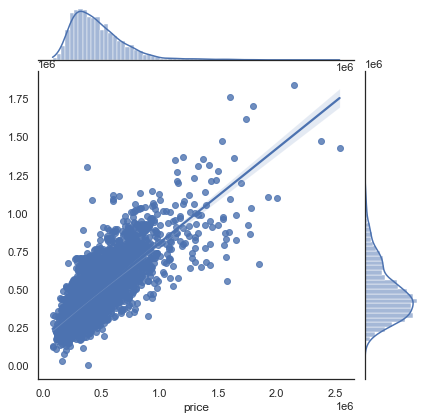

In [184]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_Ridge1_predvl, kind="reg")

In summary, Linear models have performed almost with similar results in both regularized model and non-regularized models
From the graph we can also see that the over model is in ideal state as  regularized model and non-regularized models

### KNN Regressor

In [185]:
# defining the model
knn1 = KNeighborsRegressor(n_neighbors=4,weights='distance')
knn1.fit(X_train, y_train)

# Making Predictions
y_knn1_predtr= knn1.predict(X_train)
y_knn1_predvl= knn1.predict(X_val)
y_knn1_predte= knn1.predict(X_test)

In [186]:
# Performance on train data
knn1_tr_R2score=r2_score(y_train,y_knn1_predtr)
knn1_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_knn1_predtr))
knn1_tr_MSE=mean_squared_error(y_train, y_knn1_predtr)
knn1_tr_MAE=mean_absolute_error(y_train, y_knn1_predtr)
knn1_tr_MAPE=mape(y_train, y_knn1_predtr)
knn1_tr_AR2=adjR(y_train, y_knn1_predtr,p=len(X.columns))

# Performance on val data
knn1_vl_R2score=r2_score(y_val,y_knn1_predvl)
knn1_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_knn1_predvl))
knn1_vl_MSE=mean_squared_error(y_val, y_knn1_predvl)
knn1_vl_MAE=mean_absolute_error(y_val, y_knn1_predvl)
knn1_vl_MAPE=mape(y_val, y_knn1_predvl)
knn1_vl_AR2=adjR(y_val, y_knn1_predvl,p=len(X.columns))

# Performance on test data
knn1_te_R2score=r2_score(y_test,y_knn1_predte)
knn1_te_RMSE=np.sqrt(mean_squared_error(y_test, y_knn1_predte))
knn1_te_MSE=mean_squared_error(y_test, y_knn1_predte)
knn1_te_MAE=mean_absolute_error(y_test, y_knn1_predte)
knn1_te_MAPE=mape(y_test, y_knn1_predte)
knn1_te_AR2=adjR(y_test, y_knn1_predte,p=len(X.columns))

knn1_df=pd.DataFrame({'Algorithm':['KNN'],
                       'train Score':knn1_tr_R2score,'RMSE_tr': knn1_tr_RMSE, 'MSE_tr': knn1_tr_MSE, 'MAE_tr': knn1_tr_MAE,
                         "Mape_tr":knn1_tr_MAPE, "Adjusted_r2_tr":knn1_tr_AR2,
                        'Val Score':knn1_vl_R2score,'RMSE_vl': knn1_vl_RMSE, 'MSE_vl': knn1_vl_MSE, 'MAE_vl': knn1_vl_MAE,
                         "Mape_val":knn1_vl_MAPE, "Adjusted_r2_val":knn1_vl_AR2,
                      'test Score':knn1_te_R2score,'RMSE_te': knn1_te_RMSE, 'MSE_te': knn1_te_MSE, 'MAE_te': knn1_te_MAE,
                        "Mape_te":knn1_te_MAPE, "Adjusted_r2_te":knn1_te_AR2})
model_comp = pd.concat([model_comp, knn1_df]).reset_index(drop=True)

model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.070810,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924
1,SLinear-Reg (Lasso),0.638065,154636.497425,2.391245e+10,111286.325970,0.257109,1.070813,0.606626,154736.893644,2.394351e+10,111316.112298,0.268349,1.076965,0.597316,165053.923854,2.724280e+10,115648.922264,0.270838,1.078786
2,SLinear-Reg (Ridge),0.637703,154713.773556,2.393635e+10,111373.019764,0.257248,1.070884,0.606710,154720.208157,2.393834e+10,111348.284212,0.268446,1.076948,0.597425,165031.645127,2.723544e+10,115680.198136,0.270995,1.078765
3,KNN,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.390702,192577.613423,3.708614e+10,135298.425658,0.318487,1.119211,0.392225,202775.325293,4.111783e+10,142016.293348,0.324791,1.118912


Though KNN regressor performed well in training set, the performance score in validation set is very less. This shows that the model is overfitted in training set

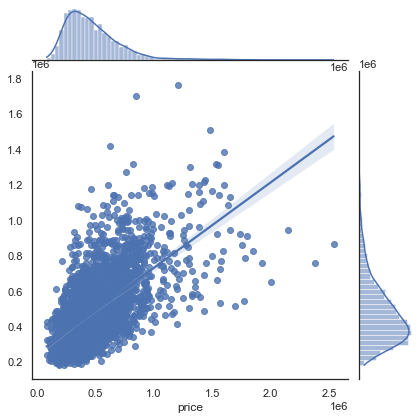

In [187]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_knn1_predvl, kind="reg")

From plot we can say that knn is not working properly for this case as many prediction are not over the line

### Support vector regressor

In [188]:
# defining the model
SVR1 = SVR(gamma='auto',C=10.0, epsilon=0.2,kernel='rbf')
SVR1.fit(X_train, y_train)

# Making Predictions
y_SVR1_predtr= SVR1.predict(X_train)
y_SVR1_predvl= SVR1.predict(X_val)
y_SVR1_predte= SVR1.predict(X_test)

In [189]:
# Performance on train data
SVR1_tr_R2score=r2_score(y_train,y_SVR1_predtr)
SVR1_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_SVR1_predtr))
SVR1_tr_MSE=mean_squared_error(y_train, y_SVR1_predtr)
SVR1_tr_MAE=mean_absolute_error(y_train, y_SVR1_predtr)
SVR1_tr_MAPE=mape(y_train, y_SVR1_predtr)
SVR1_tr_AR2=adjR(y_train, y_SVR1_predtr,p=len(X.columns))

# Performance on val data
SVR1_vl_R2score=r2_score(y_val,y_SVR1_predvl)
SVR1_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_SVR1_predvl))
SVR1_vl_MSE=mean_squared_error(y_val, y_SVR1_predvl)
SVR1_vl_MAE=mean_absolute_error(y_val, y_SVR1_predvl)
SVR1_vl_MAPE=mape(y_val, y_SVR1_predvl)
SVR1_vl_AR2=adjR(y_val, y_SVR1_predvl,p=len(X.columns))

# Performance on test data
SVR1_te_R2score=r2_score(y_test,y_SVR1_predte)
SVR1_te_RMSE=np.sqrt(mean_squared_error(y_test, y_SVR1_predte))
SVR1_te_MSE=mean_squared_error(y_test, y_SVR1_predte)
SVR1_te_MAE=mean_absolute_error(y_test, y_SVR1_predte)
SVR1_te_MAPE=mape(y_test, y_SVR1_predte)
SVR1_te_AR2=adjR(y_test, y_SVR1_predte,p=len(X.columns))

SVR1_df=pd.DataFrame({'Algorithm':['SVR with kernel rbf'],
                       'train Score':SVR1_tr_R2score,'RMSE_tr': SVR1_tr_RMSE, 'MSE_tr': SVR1_tr_MSE, 'MAE_tr': SVR1_tr_MAE,
                         "Mape_tr":SVR1_tr_MAPE, "Adjusted_r2_tr":SVR1_tr_AR2,
                        'Val Score':SVR1_vl_R2score,'RMSE_vl': SVR1_vl_RMSE, 'MSE_vl': SVR1_vl_MSE, 'MAE_vl': SVR1_vl_MAE,
                         "Mape_val":SVR1_vl_MAPE, "Adjusted_r2_val":SVR1_vl_AR2,
                      'test Score':SVR1_te_R2score,'RMSE_te': SVR1_te_RMSE, 'MSE_te': SVR1_te_MSE, 'MAE_te': SVR1_te_MAE,
                        "Mape_te":SVR1_te_MAPE, "Adjusted_r2_te":SVR1_te_AR2})
model_comp = pd.concat([model_comp, SVR1_df]).reset_index(drop=True)

model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.070810,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924
1,SLinear-Reg (Lasso),0.638065,154636.497425,2.391245e+10,111286.325970,0.257109,1.070813,0.606626,154736.893644,2.394351e+10,111316.112298,0.268349,1.076965,0.597316,165053.923854,2.724280e+10,115648.922264,0.270838,1.078786
2,SLinear-Reg (Ridge),0.637703,154713.773556,2.393635e+10,111373.019764,0.257248,1.070884,0.606710,154720.208157,2.393834e+10,111348.284212,0.268446,1.076948,0.597425,165031.645127,2.723544e+10,115680.198136,0.270995,1.078765
3,KNN,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.390702,192577.613423,3.708614e+10,135298.425658,0.318487,1.119211,0.392225,202775.325293,4.111783e+10,142016.293348,0.324791,1.118912
4,SVR with kernel rbf,-0.052605,263711.630845,6.954382e+10,181831.515593,0.399385,1.205944,-0.034708,250957.188825,6.297951e+10,174006.072895,0.405370,1.202443,-0.041457,265438.851125,7.045778e+10,180460.035277,0.406732,1.203763


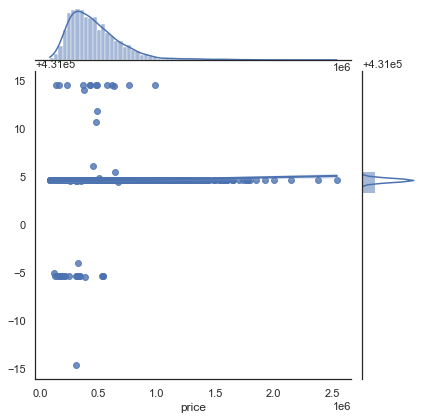

In [190]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_SVR1_predvl, kind="reg")

The above negative scores in SVR model is due to non-learning of the model in the training set which results in non-performance in validation set.

From plot we can say that SVM is performing worst for this case aa the prection is in -5 to 0 range only

### Decision Tree Regressor

In [191]:
# defining the model
DT1 = DecisionTreeRegressor()
DT1.fit(X_train, y_train)

# Making Predictions
y_DT1_predtr= DT1.predict(X_train)
y_DT1_predvl= DT1.predict(X_val)
y_DT1_predte= DT1.predict(X_test)


# Performance on train data
DT1_tr_R2score=r2_score(y_train,y_DT1_predtr)
DT1_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_DT1_predtr))
DT1_tr_MSE=mean_squared_error(y_train, y_DT1_predtr)
DT1_tr_MAE=mean_absolute_error(y_train, y_DT1_predtr)
DT1_tr_MAPE=mape(y_train, y_DT1_predtr)
DT1_tr_AR2=adjR(y_train, y_DT1_predtr,p=len(X.columns))

# Performance on val data
DT1_vl_R2score=r2_score(y_val,y_DT1_predvl)
DT1_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_DT1_predvl))
DT1_vl_MSE=mean_squared_error(y_val, y_DT1_predvl)
DT1_vl_MAE=mean_absolute_error(y_val, y_DT1_predvl)
DT1_vl_MAPE=mape(y_val, y_DT1_predvl)
DT1_vl_AR2=adjR(y_val, y_DT1_predvl,p=len(X.columns))

# Performance on test data
DT1_te_R2score=r2_score(y_test,y_DT1_predte)
DT1_te_RMSE=np.sqrt(mean_squared_error(y_test, y_DT1_predte))
DT1_te_MSE=mean_squared_error(y_test, y_DT1_predte)
DT1_te_MAE=mean_absolute_error(y_test, y_DT1_predte)
DT1_te_MAPE=mape(y_test, y_DT1_predte)
DT1_te_AR2=adjR(y_test, y_DT1_predte,p=len(X.columns))

DT1_df=pd.DataFrame({'Algorithm':['Simple DT'],
                       'train Score':DT1_tr_R2score,'RMSE_tr': DT1_tr_RMSE, 'MSE_tr': DT1_tr_MSE, 'MAE_tr': DT1_tr_MAE,
                         "Mape_tr":DT1_tr_MAPE, "Adjusted_r2_tr":DT1_tr_AR2,
                        'Val Score':DT1_vl_R2score,'RMSE_vl': DT1_vl_RMSE, 'MSE_vl': DT1_vl_MSE, 'MAE_vl': DT1_vl_MAE,
                         "Mape_val":DT1_vl_MAPE, "Adjusted_r2_val":DT1_vl_AR2,
                      'test Score':DT1_te_R2score,'RMSE_te': DT1_te_RMSE, 'MSE_te': DT1_te_MSE, 'MAE_te': DT1_te_MAE,
                        "Mape_te":DT1_te_MAPE, "Adjusted_r2_te":DT1_te_AR2})
model_comp = pd.concat([model_comp, DT1_df]).reset_index(drop=True)

model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.070810,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924
1,SLinear-Reg (Lasso),0.638065,154636.497425,2.391245e+10,111286.325970,0.257109,1.070813,0.606626,154736.893644,2.394351e+10,111316.112298,0.268349,1.076965,0.597316,165053.923854,2.724280e+10,115648.922264,0.270838,1.078786
2,SLinear-Reg (Ridge),0.637703,154713.773556,2.393635e+10,111373.019764,0.257248,1.070884,0.606710,154720.208157,2.393834e+10,111348.284212,0.268446,1.076948,0.597425,165031.645127,2.723544e+10,115680.198136,0.270995,1.078765
3,KNN,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.390702,192577.613423,3.708614e+10,135298.425658,0.318487,1.119211,0.392225,202775.325293,4.111783e+10,142016.293348,0.324791,1.118912
4,SVR with kernel rbf,-0.052605,263711.630845,6.954382e+10,181831.515593,0.399385,1.205944,-0.034708,250957.188825,6.297951e+10,174006.072895,0.405370,1.202443,-0.041457,265438.851125,7.045778e+10,180460.035277,0.406732,1.203763
5,Simple DT,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.350118,198887.731811,3.955633e+10,140147.427551,0.328369,1.127151,0.373600,205858.955492,4.237791e+10,142853.715723,0.321422,1.122557


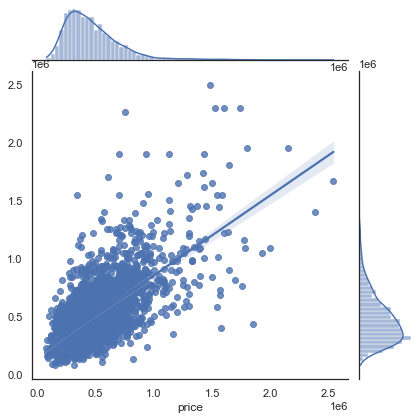

In [192]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_DT1_predvl, kind="reg")

Above performance of initial Decision tree model shows overfit in training set with 0.99 score and low performance in validation and test set. It is not the ideal solution

From graph we can say that decision tree is not performing well as the predictions is overfiting and prediction made are out of line too.

In [193]:
# defining the model
DT2 = DecisionTreeRegressor(max_depth=10,min_samples_leaf=5)
DT2.fit(X_train, y_train)

# Making Predictions
y_DT2_predtr= DT2.predict(X_train)
y_DT2_predvl= DT2.predict(X_val)
y_DT2_predte= DT2.predict(X_test)

# Performance on train data
DT2_tr_R2score=r2_score(y_train,y_DT2_predtr)
DT2_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_DT2_predtr))
DT2_tr_MSE=mean_squared_error(y_train, y_DT2_predtr)
DT2_tr_MAE=mean_absolute_error(y_train, y_DT2_predtr)

# Performance on val data
DT2_vl_R2score=r2_score(y_val,y_DT2_predvl)
DT2_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_DT2_predvl))
DT2_vl_MSE=mean_squared_error(y_val, y_DT2_predvl)
DT2_vl_MAE=mean_absolute_error(y_val, y_DT2_predvl)

# Performance on test data
DT2_te_R2score=r2_score(y_test,y_DT2_predte)
DT2_te_RMSE=np.sqrt(mean_squared_error(y_test, y_DT2_predte))
DT2_te_MSE=mean_squared_error(y_test, y_DT2_predte)
DT2_te_MAE=mean_absolute_error(y_test, y_DT2_predte)

DT2_df=pd.DataFrame({'Algorithm':['DT with some modified parameter'],
                     'train Score':DT2_tr_R2score,'RMSE_tr': DT2_tr_RMSE, 'MSE_tr': DT2_tr_MSE, 'MAE_tr': DT2_tr_MAE,
                     'Val Score':DT2_vl_R2score,'RMSE_vl': DT2_vl_RMSE, 'MSE_vl': DT2_vl_MSE, 'MAE_vl': DT2_vl_MAE,
                    'test Score':DT2_te_R2score,'RMSE_te': DT2_te_RMSE, 'MSE_te': DT2_te_MSE, 'MAE_te': DT2_te_MAE})
model_comp = pd.concat([model_comp, DT2_df]).reset_index(drop=True)

model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.070810,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924
1,SLinear-Reg (Lasso),0.638065,154636.497425,2.391245e+10,111286.325970,0.257109,1.070813,0.606626,154736.893644,2.394351e+10,111316.112298,0.268349,1.076965,0.597316,165053.923854,2.724280e+10,115648.922264,0.270838,1.078786
2,SLinear-Reg (Ridge),0.637703,154713.773556,2.393635e+10,111373.019764,0.257248,1.070884,0.606710,154720.208157,2.393834e+10,111348.284212,0.268446,1.076948,0.597425,165031.645127,2.723544e+10,115680.198136,0.270995,1.078765
3,KNN,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.390702,192577.613423,3.708614e+10,135298.425658,0.318487,1.119211,0.392225,202775.325293,4.111783e+10,142016.293348,0.324791,1.118912
4,SVR with kernel rbf,-0.052605,263711.630845,6.954382e+10,181831.515593,0.399385,1.205944,-0.034708,250957.188825,6.297951e+10,174006.072895,0.405370,1.202443,-0.041457,265438.851125,7.045778e+10,180460.035277,0.406732,1.203763
5,Simple DT,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.350118,198887.731811,3.955633e+10,140147.427551,0.328369,1.127151,0.373600,205858.955492,4.237791e+10,142853.715723,0.321422,1.122557
6,DT with some modified parameter,0.739433,131206.890498,1.721525e+10,94899.835625,NaN,NaN,0.529140,169292.175290,2.865984e+10,117901.599016,NaN,NaN,0.560947,172346.439947,2.970330e+10,120847.889244,NaN,NaN


Above decision tree model with modified parameter has better performed on the training set and validation set compared to initial decision tree model.But overall decision tree has not performed well than linear regression models.

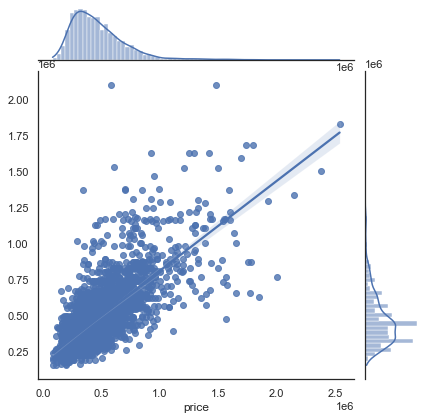

In [194]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_DT2_predvl, kind="reg")

In summary, KNN regressor model and decision tree models have not performed well in comparison with linear regression models

### Logistic Regression

In [195]:
# defining the model
LOG_R = LogisticRegression(random_state=0)
LOG_R.fit(X_train, y_train)

# Making Predictions
y_LOG_R_predtr= LOG_R.predict(X_train)
y_LOG_R_predvl= LOG_R.predict(X_val)
y_LOG_R_predte= LOG_R.predict(X_test)

# Performance on train data
LOG_R_tr_R2score=r2_score(y_train,y_LOG_R_predtr)
LOG_R_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_LOG_R_predtr))
LOG_R_tr_MSE=mean_squared_error(y_train, y_LOG_R_predtr)
LOG_R_tr_MAE=mean_absolute_error(y_train, y_LOG_R_predtr)
LOG_R_tr_MAPE=mape(y_train, y_LOG_R_predtr)
LOG_R_tr_AR2=adjR(y_train, y_LOG_R_predtr,p=len(X.columns))

# Performance on val data
LOG_R_vl_R2score=r2_score(y_val,y_LOG_R_predvl)
LOG_R_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_LOG_R_predvl))
LOG_R_vl_MSE=mean_squared_error(y_val, y_LOG_R_predvl)
LOG_R_vl_MAE=mean_absolute_error(y_val, y_LOG_R_predvl)
LOG_R_vl_MAPE=mape(y_val, y_LOG_R_predvl)
LOG_R_vl_AR2=adjR(y_val, y_LOG_R_predvl,p=len(X.columns))

# Performance on test data
LOG_R_te_R2score=r2_score(y_test,y_LOG_R_predte)
LOG_R_te_RMSE=np.sqrt(mean_squared_error(y_test, y_LOG_R_predte))
LOG_R_te_MSE=mean_squared_error(y_test, y_LOG_R_predte)
LOG_R_te_MAE=mean_absolute_error(y_test, y_LOG_R_predte)
LOG_R_te_MAPE=mape(y_test, y_LOG_R_predte)
LOG_R_te_AR2=adjR(y_test, y_LOG_R_predte,p=len(X.columns))

LOG_R_df=pd.DataFrame({'Algorithm':['Logistic Regression'],
                       'train Score':LOG_R_tr_R2score,'RMSE_tr': LOG_R_tr_RMSE, 'MSE_tr': LOG_R_tr_MSE, 'MAE_tr': LOG_R_tr_MAE,
                         "Mape_tr":LOG_R_tr_MAPE, "Adjusted_r2_tr":LOG_R_tr_AR2,
                        'Val Score':LOG_R_vl_R2score,'RMSE_vl': LOG_R_vl_RMSE, 'MSE_vl': LOG_R_vl_MSE, 'MAE_vl': LOG_R_vl_MAE,
                         "Mape_val":LOG_R_vl_MAPE, "Adjusted_r2_val":LOG_R_vl_AR2,
                      'test Score':LOG_R_te_R2score,'RMSE_te': LOG_R_te_RMSE, 'MSE_te': LOG_R_te_MSE, 'MAE_te': LOG_R_te_MAE,
                        "Mape_te":LOG_R_te_MAPE, "Adjusted_r2_te":LOG_R_te_AR2})
model_comp = pd.concat([model_comp, LOG_R_df]).reset_index(drop=True)

model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.070810,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924
1,SLinear-Reg (Lasso),0.638065,154636.497425,2.391245e+10,111286.325970,0.257109,1.070813,0.606626,154736.893644,2.394351e+10,111316.112298,0.268349,1.076965,0.597316,165053.923854,2.724280e+10,115648.922264,0.270838,1.078786
2,SLinear-Reg (Ridge),0.637703,154713.773556,2.393635e+10,111373.019764,0.257248,1.070884,0.606710,154720.208157,2.393834e+10,111348.284212,0.268446,1.076948,0.597425,165031.645127,2.723544e+10,115680.198136,0.270995,1.078765
3,KNN,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.390702,192577.613423,3.708614e+10,135298.425658,0.318487,1.119211,0.392225,202775.325293,4.111783e+10,142016.293348,0.324791,1.118912
4,SVR with kernel rbf,-0.052605,263711.630845,6.954382e+10,181831.515593,0.399385,1.205944,-0.034708,250957.188825,6.297951e+10,174006.072895,0.405370,1.202443,-0.041457,265438.851125,7.045778e+10,180460.035277,0.406732,1.203763
5,Simple DT,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.350118,198887.731811,3.955633e+10,140147.427551,0.328369,1.127151,0.373600,205858.955492,4.237791e+10,142853.715723,0.321422,1.122557
6,DT with some modified parameter,0.739433,131206.890498,1.721525e+10,94899.835625,NaN,NaN,0.529140,169292.175290,2.865984e+10,117901.599016,NaN,NaN,0.560947,172346.439947,2.970330e+10,120847.889244,NaN,NaN
7,Logistic Regression,0.213048,228018.793453,5.199257e+10,156786.075719,0.346757,1.153969,0.188135,222296.599269,4.941578e+10,152429.921574,0.350568,1.158843,0.203119,232188.371935,5.391144e+10,159722.810628,0.357379,1.155911


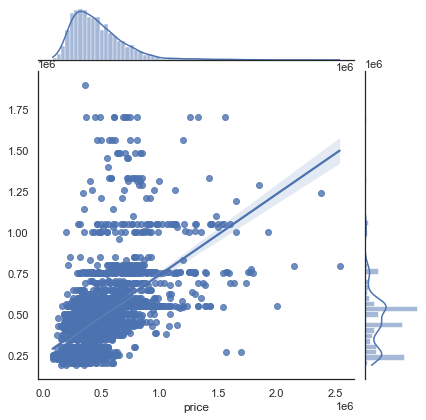

In [196]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_LOG_R_predvl, kind="reg")

The Logistic regression model with modified parameters has not performed well with just ~0.22 in training tesing and validation data sets.

From the graph we can interprest that the logistic regression is not performing well as the predictions is made between 0 to 0.5

### Ensemble techniques

#### Boosting and Bagging

In [197]:
# defining the model
GB1=GradientBoostingRegressor(n_estimators = 200, learning_rate = 0.1, random_state=22)
GB1.fit(X_train, y_train)

# Making Predictions
y_GB1_predtr= GB1.predict(X_train)
y_GB1_predvl= GB1.predict(X_val)
y_GB1_predte= GB1.predict(X_test)

# Performance on train data
GB1_tr_R2score=r2_score(y_train,y_GB1_predtr)
GB1_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_GB1_predtr))
GB1_tr_MSE=mean_squared_error(y_train, y_GB1_predtr)
GB1_tr_MAE=mean_absolute_error(y_train, y_GB1_predtr)
GB1_tr_MAPE=mape(y_train, y_GB1_predtr)
GB1_tr_AR2=adjR(y_train, y_GB1_predtr,p=len(X.columns))

# Performance on val data
GB1_vl_R2score=r2_score(y_val,y_GB1_predvl)
GB1_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_GB1_predvl))
GB1_vl_MSE=mean_squared_error(y_val, y_GB1_predvl)
GB1_vl_MAE=mean_absolute_error(y_val, y_GB1_predvl)
GB1_vl_MAPE=mape(y_val, y_GB1_predvl)
GB1_vl_AR2=adjR(y_val, y_GB1_predvl,p=len(X.columns))

# Performance on test data
GB1_te_R2score=r2_score(y_test,y_GB1_predte)
GB1_te_RMSE=np.sqrt(mean_squared_error(y_test, y_GB1_predte))
GB1_te_MSE=mean_squared_error(y_test, y_GB1_predte)
GB1_te_MAE=mean_absolute_error(y_test, y_GB1_predte)
GB1_te_MAPE=mape(y_test, y_GB1_predte)
GB1_te_AR2=adjR(y_test, y_GB1_predte,p=len(X.columns))

GB1_df=pd.DataFrame({'Algorithm':['Gradient Boosting'],
                       'train Score':GB1_tr_R2score,'RMSE_tr': GB1_tr_RMSE, 'MSE_tr': GB1_tr_MSE, 'MAE_tr': GB1_tr_MAE,
                         "Mape_tr":GB1_tr_MAPE, "Adjusted_r2_tr":GB1_tr_AR2,
                        'Val Score':GB1_vl_R2score,'RMSE_vl': GB1_vl_RMSE, 'MSE_vl': GB1_vl_MSE, 'MAE_vl': GB1_vl_MAE,
                         "Mape_val":GB1_vl_MAPE, "Adjusted_r2_val":GB1_vl_AR2,
                      'test Score':GB1_te_R2score,'RMSE_te': GB1_te_RMSE, 'MSE_te': GB1_te_MSE, 'MAE_te': GB1_te_MAE,
                        "Mape_te":GB1_te_MAPE, "Adjusted_r2_te":GB1_te_AR2})
model_comp = pd.concat([model_comp, GB1_df]).reset_index(drop=True)

model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.070810,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924
1,SLinear-Reg (Lasso),0.638065,154636.497425,2.391245e+10,111286.325970,0.257109,1.070813,0.606626,154736.893644,2.394351e+10,111316.112298,0.268349,1.076965,0.597316,165053.923854,2.724280e+10,115648.922264,0.270838,1.078786
2,SLinear-Reg (Ridge),0.637703,154713.773556,2.393635e+10,111373.019764,0.257248,1.070884,0.606710,154720.208157,2.393834e+10,111348.284212,0.268446,1.076948,0.597425,165031.645127,2.723544e+10,115680.198136,0.270995,1.078765
3,KNN,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.390702,192577.613423,3.708614e+10,135298.425658,0.318487,1.119211,0.392225,202775.325293,4.111783e+10,142016.293348,0.324791,1.118912
4,SVR with kernel rbf,-0.052605,263711.630845,6.954382e+10,181831.515593,0.399385,1.205944,-0.034708,250957.188825,6.297951e+10,174006.072895,0.405370,1.202443,-0.041457,265438.851125,7.045778e+10,180460.035277,0.406732,1.203763
5,Simple DT,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.350118,198887.731811,3.955633e+10,140147.427551,0.328369,1.127151,0.373600,205858.955492,4.237791e+10,142853.715723,0.321422,1.122557
6,DT with some modified parameter,0.739433,131206.890498,1.721525e+10,94899.835625,NaN,NaN,0.529140,169292.175290,2.865984e+10,117901.599016,NaN,NaN,0.560947,172346.439947,2.970330e+10,120847.889244,NaN,NaN
7,Logistic Regression,0.213048,228018.793453,5.199257e+10,156786.075719,0.346757,1.153969,0.188135,222296.599269,4.941578e+10,152429.921574,0.350568,1.158843,0.203119,232188.371935,5.391144e+10,159722.810628,0.357379,1.155911
8,Gradient Boosting,0.742793,130358.155949,1.699325e+10,97507.699306,0.231287,1.050323,0.654011,145118.173085,2.105928e+10,105026.890755,0.255416,1.067693,0.669334,149568.039142,2.237060e+10,107150.852961,0.253557,1.064696


In [221]:
import pickle
filename = 'finalized_model.sav'
pickle.dump(GB1, open(filename, 'wb'))

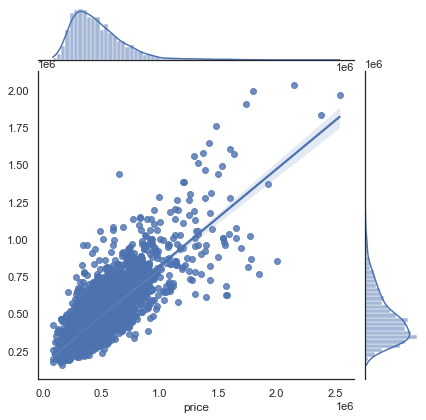

In [199]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_GB1_predvl, kind="reg")

Gradient boosting model has provided good scores in both training and validation sets
From the graph we can conclude that the model is fine then others

In [200]:
# defining the model
BGG1=BaggingRegressor(n_estimators=50, oob_score= True,random_state=14)
BGG1.fit(X_train, y_train)

# Making Predictions
y_BGG1_predtr= BGG1.predict(X_train)
y_BGG1_predvl= BGG1.predict(X_val)
y_BGG1_predte= BGG1.predict(X_test)

# Performance on train data
BGG1_tr_R2score=r2_score(y_train,y_BGG1_predtr)
BGG1_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_BGG1_predtr))
BGG1_tr_MSE=mean_squared_error(y_train, y_BGG1_predtr)
BGG1_tr_MAE=mean_absolute_error(y_train, y_BGG1_predtr)
BGG1_tr_MAPE=mape(y_train, y_BGG1_predtr)
BGG1_tr_AR2=adjR(y_train, y_BGG1_predtr,p=len(X.columns))

# Performance on val data
BGG1_vl_R2score=r2_score(y_val,y_BGG1_predvl)
BGG1_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_BGG1_predvl))
BGG1_vl_MSE=mean_squared_error(y_val, y_BGG1_predvl)
BGG1_vl_MAE=mean_absolute_error(y_val, y_BGG1_predvl)
BGG1_vl_MAPE=mape(y_val, y_BGG1_predvl)
BGG1_vl_AR2=adjR(y_val, y_BGG1_predvl,p=len(X.columns))

# Performance on test data
BGG1_te_R2score=r2_score(y_test,y_BGG1_predte)
BGG1_te_RMSE=np.sqrt(mean_squared_error(y_test, y_BGG1_predte))
BGG1_te_MSE=mean_squared_error(y_test, y_BGG1_predte)
BGG1_te_MAE=mean_absolute_error(y_test, y_BGG1_predte)
BGG1_te_MAPE=mape(y_test, y_BGG1_predte)
BGG1_te_AR2=adjR(y_test, y_BGG1_predte,p=len(X.columns))

BGG1_df=pd.DataFrame({'Algorithm':['Bagging Regressor'],
                       'train Score':BGG1_tr_R2score,'RMSE_tr': BGG1_tr_RMSE, 'MSE_tr': BGG1_tr_MSE, 'MAE_tr': BGG1_tr_MAE,
                         "Mape_tr":BGG1_tr_MAPE, "Adjusted_r2_tr":BGG1_tr_AR2,
                        'Val Score':BGG1_vl_R2score,'RMSE_vl': BGG1_vl_RMSE, 'MSE_vl': BGG1_vl_MSE, 'MAE_vl': BGG1_vl_MAE,
                         "Mape_val":BGG1_vl_MAPE, "Adjusted_r2_val":BGG1_vl_AR2,
                      'test Score':BGG1_te_R2score,'RMSE_te': BGG1_te_RMSE, 'MSE_te': BGG1_te_MSE, 'MAE_te': BGG1_te_MAE,
                        "Mape_te":BGG1_te_MAPE, "Adjusted_r2_te":BGG1_te_AR2})
model_comp = pd.concat([model_comp, BGG1_df]).reset_index(drop=True)

model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.070810,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924
1,SLinear-Reg (Lasso),0.638065,154636.497425,2.391245e+10,111286.325970,0.257109,1.070813,0.606626,154736.893644,2.394351e+10,111316.112298,0.268349,1.076965,0.597316,165053.923854,2.724280e+10,115648.922264,0.270838,1.078786
2,SLinear-Reg (Ridge),0.637703,154713.773556,2.393635e+10,111373.019764,0.257248,1.070884,0.606710,154720.208157,2.393834e+10,111348.284212,0.268446,1.076948,0.597425,165031.645127,2.723544e+10,115680.198136,0.270995,1.078765
3,KNN,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.390702,192577.613423,3.708614e+10,135298.425658,0.318487,1.119211,0.392225,202775.325293,4.111783e+10,142016.293348,0.324791,1.118912
4,SVR with kernel rbf,-0.052605,263711.630845,6.954382e+10,181831.515593,0.399385,1.205944,-0.034708,250957.188825,6.297951e+10,174006.072895,0.405370,1.202443,-0.041457,265438.851125,7.045778e+10,180460.035277,0.406732,1.203763
5,Simple DT,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.350118,198887.731811,3.955633e+10,140147.427551,0.328369,1.127151,0.373600,205858.955492,4.237791e+10,142853.715723,0.321422,1.122557
6,DT with some modified parameter,0.739433,131206.890498,1.721525e+10,94899.835625,NaN,NaN,0.529140,169292.175290,2.865984e+10,117901.599016,NaN,NaN,0.560947,172346.439947,2.970330e+10,120847.889244,NaN,NaN
7,Logistic Regression,0.213048,228018.793453,5.199257e+10,156786.075719,0.346757,1.153969,0.188135,222296.599269,4.941578e+10,152429.921574,0.350568,1.158843,0.203119,232188.371935,5.391144e+10,159722.810628,0.357379,1.155911
8,Gradient Boosting,0.742793,130358.155949,1.699325e+10,97507.699306,0.231287,1.050323,0.654011,145118.173085,2.105928e+10,105026.890755,0.255416,1.067693,0.669334,149568.039142,2.237060e+10,107150.852961,0.253557,1.064696
9,Bagging Regressor,0.952253,56165.609075,3.154576e+09,38763.662264,0.088867,1.009342,0.640731,147876.992533,2.186760e+10,104199.862084,0.250836,1.070292,0.667237,150041.547789,2.251247e+10,106243.206623,0.247566,1.065106


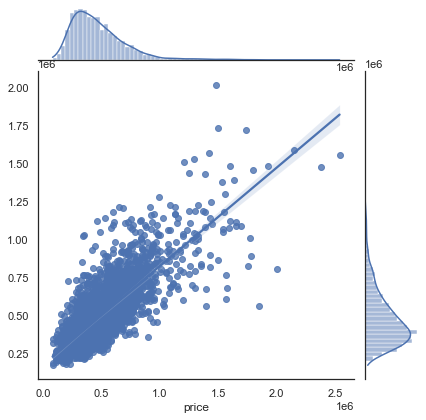

In [201]:
sns.set(style="darkgrid", color_codes=True)
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_BGG1_predvl, kind="reg")

Bagging model also performed well in training and validation sets.There seems to be overfitting in training set. We need to analyse further by hypertuning
From the graph this model looks fine having some values out of line and mostly data is at one point

## Random forest

In [202]:
# defining the model
RF1=RandomForestRegressor()
RF1.fit(X_train, y_train)

# Making Predictions
y_RF1_predtr= RF1.predict(X_train)
y_RF1_predvl= RF1.predict(X_val)
y_RF1_predte= RF1.predict(X_test)

# Performance on train data
RF1_tr_R2score=r2_score(y_train,y_RF1_predtr)
RF1_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_RF1_predtr))
RF1_tr_MSE=mean_squared_error(y_train, y_RF1_predtr)
RF1_tr_MAE=mean_absolute_error(y_train, y_RF1_predtr)
RF1_tr_MAPE=mape(y_train, y_RF1_predtr)
RF1_tr_AR2=adjR(y_train, y_RF1_predtr,p=len(X.columns))

# Performance on val data
RF1_vl_R2score=r2_score(y_val,y_RF1_predvl)
RF1_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_RF1_predvl))
RF1_vl_MSE=mean_squared_error(y_val, y_RF1_predvl)
RF1_vl_MAE=mean_absolute_error(y_val, y_RF1_predvl)
RF1_vl_MAPE=mape(y_val, y_RF1_predvl)
RF1_vl_AR2=adjR(y_val, y_RF1_predvl,p=len(X.columns))

# Performance on test data
RF1_te_R2score=r2_score(y_test,y_RF1_predte)
RF1_te_RMSE=np.sqrt(mean_squared_error(y_test, y_RF1_predte))
RF1_te_MSE=mean_squared_error(y_test, y_RF1_predte)
RF1_te_MAE=mean_absolute_error(y_test, y_RF1_predte)
RF1_te_MAPE=mape(y_test, y_RF1_predte)
RF1_te_AR2=adjR(y_test, y_RF1_predte,p=len(X.columns))

RF1_df=pd.DataFrame({'Algorithm':['Random Forest'],
                       'train Score':RF1_tr_R2score,'RMSE_tr': RF1_tr_RMSE, 'MSE_tr': RF1_tr_MSE, 'MAE_tr': RF1_tr_MAE,
                         "Mape_tr":RF1_tr_MAPE, "Adjusted_r2_tr":RF1_tr_AR2,
                        'Val Score':RF1_vl_R2score,'RMSE_vl': RF1_vl_RMSE, 'MSE_vl': RF1_vl_MSE, 'MAE_vl': RF1_vl_MAE,
                         "Mape_val":RF1_vl_MAPE, "Adjusted_r2_val":RF1_vl_AR2,
                      'test Score':RF1_te_R2score,'RMSE_te': RF1_te_RMSE, 'MSE_te': RF1_te_MSE, 'MAE_te': RF1_te_MAE,
                        "Mape_te":RF1_te_MAPE, "Adjusted_r2_te":RF1_te_AR2})
model_comp = pd.concat([model_comp, RF1_df]).reset_index(drop=True)

model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.070810,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924
1,SLinear-Reg (Lasso),0.638065,154636.497425,2.391245e+10,111286.325970,0.257109,1.070813,0.606626,154736.893644,2.394351e+10,111316.112298,0.268349,1.076965,0.597316,165053.923854,2.724280e+10,115648.922264,0.270838,1.078786
2,SLinear-Reg (Ridge),0.637703,154713.773556,2.393635e+10,111373.019764,0.257248,1.070884,0.606710,154720.208157,2.393834e+10,111348.284212,0.268446,1.076948,0.597425,165031.645127,2.723544e+10,115680.198136,0.270995,1.078765
3,KNN,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.390702,192577.613423,3.708614e+10,135298.425658,0.318487,1.119211,0.392225,202775.325293,4.111783e+10,142016.293348,0.324791,1.118912
4,SVR with kernel rbf,-0.052605,263711.630845,6.954382e+10,181831.515593,0.399385,1.205944,-0.034708,250957.188825,6.297951e+10,174006.072895,0.405370,1.202443,-0.041457,265438.851125,7.045778e+10,180460.035277,0.406732,1.203763
5,Simple DT,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.350118,198887.731811,3.955633e+10,140147.427551,0.328369,1.127151,0.373600,205858.955492,4.237791e+10,142853.715723,0.321422,1.122557
6,DT with some modified parameter,0.739433,131206.890498,1.721525e+10,94899.835625,NaN,NaN,0.529140,169292.175290,2.865984e+10,117901.599016,NaN,NaN,0.560947,172346.439947,2.970330e+10,120847.889244,NaN,NaN
7,Logistic Regression,0.213048,228018.793453,5.199257e+10,156786.075719,0.346757,1.153969,0.188135,222296.599269,4.941578e+10,152429.921574,0.350568,1.158843,0.203119,232188.371935,5.391144e+10,159722.810628,0.357379,1.155911
8,Gradient Boosting,0.742793,130358.155949,1.699325e+10,97507.699306,0.231287,1.050323,0.654011,145118.173085,2.105928e+10,105026.890755,0.255416,1.067693,0.669334,149568.039142,2.237060e+10,107150.852961,0.253557,1.064696
9,Bagging Regressor,0.952253,56165.609075,3.154576e+09,38763.662264,0.088867,1.009342,0.640731,147876.992533,2.186760e+10,104199.862084,0.250836,1.070292,0.667237,150041.547789,2.251247e+10,106243.206623,0.247566,1.065106


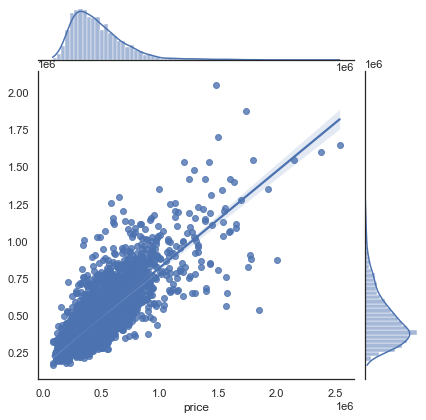

In [203]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_RF1_predvl, kind="reg")

Random forest model has performed fine not that much good. There is scope of further analysis on this model. But the overfiting is taken place which is not good.

Enseble models: in summary ensemble models have performed well on training and validation sets. These models will be selected for further analysis with hypertuning and feature selection

First 20 feature importance:	 Imp    95.246
dtype: float64
First 30 feature importance:	 Imp    98.085
dtype: float64


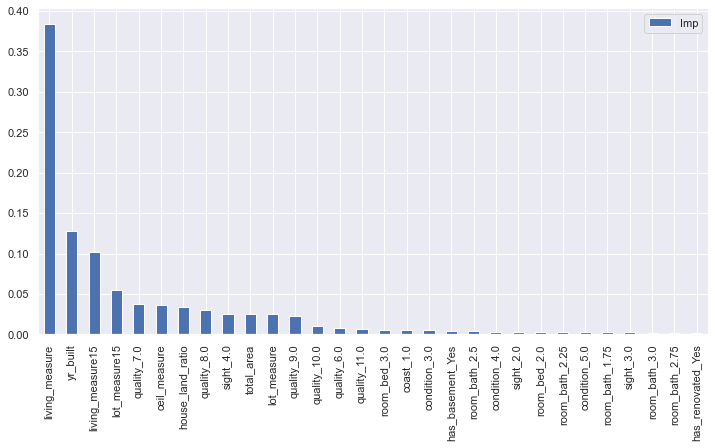

In [204]:
#feature importance
rf_imp_feature_1=pd.DataFrame(RF1.feature_importances_, columns = ["Imp"], index = X_val.columns)
rf_imp_feature_1.sort_values(by="Imp",ascending=False)
rf_imp_feature_1['Imp'] = rf_imp_feature_1['Imp'].map('{0:.5f}'.format)
rf_imp_feature_1=rf_imp_feature_1.sort_values(by="Imp",ascending=False)
rf_imp_feature_1.Imp=rf_imp_feature_1.Imp.astype("float")

rf_imp_feature_1[:30].plot.bar(figsize=(12,6))

#First 20 features have an importance of 90.5% and first 30 have importance of 95.15
print("First 20 feature importance:\t",(rf_imp_feature_1[:20].sum())*100)
print("First 30 feature importance:\t",(rf_imp_feature_1[:30].sum())*100)

By feature selection of random forest we can see that living_measure, yr_buils, living_measure15 have high impportance

### ADA Boost

In [205]:
# defining the model
ADAB=AdaBoostRegressor(DecisionTreeRegressor(random_state=8))
ADAB.fit(X_train, y_train)

# Making Predictions
y_ADAB_predtr= ADAB.predict(X_train)
y_ADAB_predvl= ADAB.predict(X_val)
y_ADAB_predte= ADAB.predict(X_test)

# Performance on train data
ADAB_tr_R2score=r2_score(y_train,y_ADAB_predtr)
ADAB_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_ADAB_predtr))
ADAB_tr_MSE=mean_squared_error(y_train, y_ADAB_predtr)
ADAB_tr_MAE=mean_absolute_error(y_train, y_ADAB_predtr)
ADAB_tr_MAPE=mape(y_train, y_ADAB_predtr)
ADAB_tr_AR2=adjR(y_train, y_ADAB_predtr,p=len(X.columns))

# Performance on val data
ADAB_vl_R2score=r2_score(y_val,y_ADAB_predvl)
ADAB_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_ADAB_predvl))
ADAB_vl_MSE=mean_squared_error(y_val, y_ADAB_predvl)
ADAB_vl_MAE=mean_absolute_error(y_val, y_ADAB_predvl)
ADAB_vl_MAPE=mape(y_val, y_ADAB_predvl)
ADAB_vl_AR2=adjR(y_val, y_ADAB_predvl,p=len(X.columns))

# Performance on test data
ADAB_te_R2score=r2_score(y_test,y_ADAB_predte)
ADAB_te_RMSE=np.sqrt(mean_squared_error(y_test, y_ADAB_predte))
ADAB_te_MSE=mean_squared_error(y_test, y_ADAB_predte)
ADAB_te_MAE=mean_absolute_error(y_test, y_ADAB_predte)
ADAB_te_MAPE=mape(y_test, y_ADAB_predte)
ADAB_te_AR2=adjR(y_test, y_ADAB_predte,p=len(X.columns))

ADAB_df=pd.DataFrame({'Algorithm':['ADA Boost'],
                       'train Score':ADAB_tr_R2score,'RMSE_tr': ADAB_tr_RMSE, 'MSE_tr': ADAB_tr_MSE, 'MAE_tr': ADAB_tr_MAE,
                         "Mape_tr":ADAB_tr_MAPE, "Adjusted_r2_tr":ADAB_tr_AR2,
                        'Val Score':ADAB_vl_R2score,'RMSE_vl': ADAB_vl_RMSE, 'MSE_vl': ADAB_vl_MSE, 'MAE_vl': ADAB_vl_MAE,
                         "Mape_val":ADAB_vl_MAPE, "Adjusted_r2_val":ADAB_vl_AR2,
                      'test Score':ADAB_te_R2score,'RMSE_te': ADAB_te_RMSE, 'MSE_te': ADAB_te_MSE, 'MAE_te': ADAB_te_MAE,
                        "Mape_te":ADAB_te_MAPE, "Adjusted_r2_te":ADAB_te_AR2})
model_comp = pd.concat([model_comp, ADAB_df]).reset_index(drop=True)

model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.070810,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924
1,SLinear-Reg (Lasso),0.638065,154636.497425,2.391245e+10,111286.325970,0.257109,1.070813,0.606626,154736.893644,2.394351e+10,111316.112298,0.268349,1.076965,0.597316,165053.923854,2.724280e+10,115648.922264,0.270838,1.078786
2,SLinear-Reg (Ridge),0.637703,154713.773556,2.393635e+10,111373.019764,0.257248,1.070884,0.606710,154720.208157,2.393834e+10,111348.284212,0.268446,1.076948,0.597425,165031.645127,2.723544e+10,115680.198136,0.270995,1.078765
3,KNN,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.390702,192577.613423,3.708614e+10,135298.425658,0.318487,1.119211,0.392225,202775.325293,4.111783e+10,142016.293348,0.324791,1.118912
4,SVR with kernel rbf,-0.052605,263711.630845,6.954382e+10,181831.515593,0.399385,1.205944,-0.034708,250957.188825,6.297951e+10,174006.072895,0.405370,1.202443,-0.041457,265438.851125,7.045778e+10,180460.035277,0.406732,1.203763
5,Simple DT,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.350118,198887.731811,3.955633e+10,140147.427551,0.328369,1.127151,0.373600,205858.955492,4.237791e+10,142853.715723,0.321422,1.122557
6,DT with some modified parameter,0.739433,131206.890498,1.721525e+10,94899.835625,NaN,NaN,0.529140,169292.175290,2.865984e+10,117901.599016,NaN,NaN,0.560947,172346.439947,2.970330e+10,120847.889244,NaN,NaN
7,Logistic Regression,0.213048,228018.793453,5.199257e+10,156786.075719,0.346757,1.153969,0.188135,222296.599269,4.941578e+10,152429.921574,0.350568,1.158843,0.203119,232188.371935,5.391144e+10,159722.810628,0.357379,1.155911
8,Gradient Boosting,0.742793,130358.155949,1.699325e+10,97507.699306,0.231287,1.050323,0.654011,145118.173085,2.105928e+10,105026.890755,0.255416,1.067693,0.669334,149568.039142,2.237060e+10,107150.852961,0.253557,1.064696
9,Bagging Regressor,0.952253,56165.609075,3.154576e+09,38763.662264,0.088867,1.009342,0.640731,147876.992533,2.186760e+10,104199.862084,0.250836,1.070292,0.667237,150041.547789,2.251247e+10,106243.206623,0.247566,1.065106


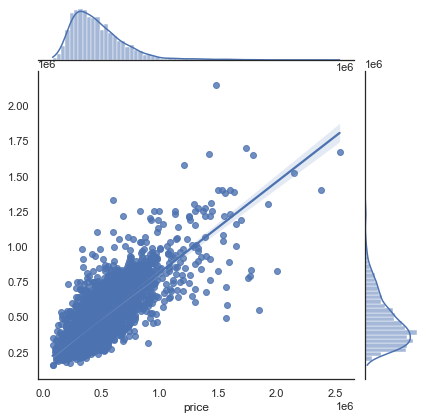

In [206]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_ADAB_predvl, kind="reg")

Ada Boost model has performed fine not that much good. There is scope of further analysis on this model. But the overfiting is taken place which is not good.
From the graph we can see that many values are out of line which is not good.

# XGBoost

In [207]:
# defining the model
XGB=XGBRegressor(n_estimators=150,max_depth=5,random_state=7)
XGB.fit(X_train, y_train)

# Making Predictions
y_XGB_predtr= XGB.predict(X_train)
y_XGB_predvl= XGB.predict(X_val)
y_XGB_predte= XGB.predict(X_test)

# Performance on train data
XGB_tr_R2score=r2_score(y_train,y_XGB_predtr)
XGB_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_XGB_predtr))
XGB_tr_MSE=mean_squared_error(y_train, y_XGB_predtr)
XGB_tr_MAE=mean_absolute_error(y_train, y_XGB_predtr)
XGB_tr_MAPE=mape(y_train, y_XGB_predtr)
XGB_tr_AR2=adjR(y_train, y_XGB_predtr,p=len(X.columns))

# Performance on val data
XGB_vl_R2score=r2_score(y_val,y_XGB_predvl)
XGB_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_XGB_predvl))
XGB_vl_MSE=mean_squared_error(y_val, y_XGB_predvl)
XGB_vl_MAE=mean_absolute_error(y_val, y_XGB_predvl)
XGB_vl_MAPE=mape(y_val, y_XGB_predvl)
XGB_vl_AR2=adjR(y_val, y_XGB_predvl,p=len(X.columns))

# Performance on test data
XGB_te_R2score=r2_score(y_test,y_XGB_predte)
XGB_te_RMSE=np.sqrt(mean_squared_error(y_test, y_XGB_predte))
XGB_te_MSE=mean_squared_error(y_test, y_XGB_predte)
XGB_te_MAE=mean_absolute_error(y_test, y_XGB_predte)
XGB_te_MAPE=mape(y_test, y_XGB_predte)
XGB_te_AR2=adjR(y_test, y_XGB_predte,p=len(X.columns))

XGB_df=pd.DataFrame({'Algorithm':['XGBoost'],
                       'train Score':XGB_tr_R2score,'RMSE_tr': XGB_tr_RMSE, 'MSE_tr': XGB_tr_MSE, 'MAE_tr': XGB_tr_MAE,
                         "Mape_tr":XGB_tr_MAPE, "Adjusted_r2_tr":XGB_tr_AR2,
                        'Val Score':XGB_vl_R2score,'RMSE_vl': XGB_vl_RMSE, 'MSE_vl': XGB_vl_MSE, 'MAE_vl': XGB_vl_MAE,
                         "Mape_val":XGB_vl_MAPE, "Adjusted_r2_val":XGB_vl_AR2,
                      'test Score':XGB_te_R2score,'RMSE_te': XGB_te_RMSE, 'MSE_te': XGB_te_MSE, 'MAE_te': XGB_te_MAE,
                        "Mape_te":XGB_te_MAPE, "Adjusted_r2_te":XGB_te_AR2})
model_comp = pd.concat([model_comp, XGB_df]).reset_index(drop=True)

model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.070810,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924
1,SLinear-Reg (Lasso),0.638065,154636.497425,2.391245e+10,111286.325970,0.257109,1.070813,0.606626,154736.893644,2.394351e+10,111316.112298,0.268349,1.076965,0.597316,165053.923854,2.724280e+10,115648.922264,0.270838,1.078786
2,SLinear-Reg (Ridge),0.637703,154713.773556,2.393635e+10,111373.019764,0.257248,1.070884,0.606710,154720.208157,2.393834e+10,111348.284212,0.268446,1.076948,0.597425,165031.645127,2.723544e+10,115680.198136,0.270995,1.078765
3,KNN,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.390702,192577.613423,3.708614e+10,135298.425658,0.318487,1.119211,0.392225,202775.325293,4.111783e+10,142016.293348,0.324791,1.118912
4,SVR with kernel rbf,-0.052605,263711.630845,6.954382e+10,181831.515593,0.399385,1.205944,-0.034708,250957.188825,6.297951e+10,174006.072895,0.405370,1.202443,-0.041457,265438.851125,7.045778e+10,180460.035277,0.406732,1.203763
5,Simple DT,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.350118,198887.731811,3.955633e+10,140147.427551,0.328369,1.127151,0.373600,205858.955492,4.237791e+10,142853.715723,0.321422,1.122557
6,DT with some modified parameter,0.739433,131206.890498,1.721525e+10,94899.835625,NaN,NaN,0.529140,169292.175290,2.865984e+10,117901.599016,NaN,NaN,0.560947,172346.439947,2.970330e+10,120847.889244,NaN,NaN
7,Logistic Regression,0.213048,228018.793453,5.199257e+10,156786.075719,0.346757,1.153969,0.188135,222296.599269,4.941578e+10,152429.921574,0.350568,1.158843,0.203119,232188.371935,5.391144e+10,159722.810628,0.357379,1.155911
8,Gradient Boosting,0.742793,130358.155949,1.699325e+10,97507.699306,0.231287,1.050323,0.654011,145118.173085,2.105928e+10,105026.890755,0.255416,1.067693,0.669334,149568.039142,2.237060e+10,107150.852961,0.253557,1.064696
9,Bagging Regressor,0.952253,56165.609075,3.154576e+09,38763.662264,0.088867,1.009342,0.640731,147876.992533,2.186760e+10,104199.862084,0.250836,1.070292,0.667237,150041.547789,2.251247e+10,106243.206623,0.247566,1.065106


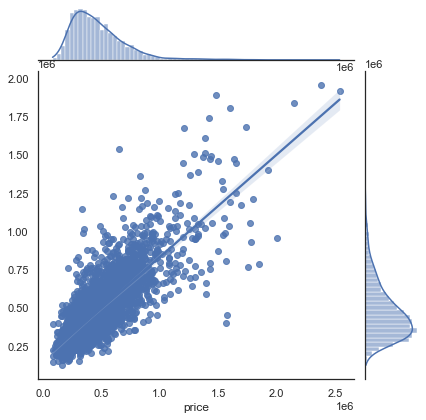

In [208]:
sns.set(style="darkgrid", color_codes=True)
            
with sns.axes_style("white"):
    sns.jointplot(x=y_val, y=y_XGB_predvl, kind="reg")

XGBoost has performed fine not that much good. There is scope of further analysis on this model. But the overfiting is taken place which is not good.

#### Model performance Summary:

Ensemble methods are performing better than linear models. 
Of all the ensemble models, Gradient boosting regressor is giving better R2 score.
we identified top 30 features that are explaining the 95% variation in model(Random Forest). Will further hypertune the model to improve the model performance. Will further explore and evaluate the features while hyperturning the ensemble models

### Tuning GBR with Gridsearch CV

Since we have better performance in gradient boosting model, we will hypertune the model for improving the score

Following are the parameters we tune for the gradient boosting model.

In [209]:
param_gridF = {
    'max_features': ['auto','sqrt'],
    'learning_rate': [0.1,0.2],
    'max_depth': [5,8],
    'min_samples_leaf': [5,10],
    'min_samples_split': [40,50],
    'n_estimators':  [200,400,600],
}

GBR_test=GradientBoostingRegressor(random_state=22)

grid_searchF = GridSearchCV(estimator = GBR_test, param_grid = param_gridF, 
                          cv = 2, n_jobs = -1, verbose = 1)
grid_searchF.fit(X_train,y_train)
grid_searchF.best_params_,grid_searchF.best_score_

Fitting 2 folds for each of 96 candidates, totalling 192 fits


({'learning_rate': 0.1,
  'max_depth': 8,
  'max_features': 'sqrt',
  'min_samples_leaf': 10,
  'min_samples_split': 50,
  'n_estimators': 200},
 0.6792978099618747)

In [210]:
# defining the model
GB2=GradientBoostingRegressor(n_estimators = 200, learning_rate = 0.1,max_depth= 5,max_features= 'sqrt',min_samples_leaf= 5,
  min_samples_split= 40, random_state=22)
GB2.fit(X_train, y_train)

# Making Predictions
y_GB2_predtr= GB2.predict(X_train)
y_GB2_predvl= GB2.predict(X_val)
y_GB2_predte= GB2.predict(X_test)

# Making Predictions
y_GB2_predtr= GB2.predict(X_train)
y_GB2_predvl= GB2.predict(X_val)
y_GB2_predte= GB2.predict(X_test)

# Performance on train data
GB2_tr_R2score=r2_score(y_train,y_GB2_predtr)
GB2_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_GB2_predtr))
GB2_tr_MSE=mean_squared_error(y_train, y_GB2_predtr)
GB2_tr_MAE=mean_absolute_error(y_train, y_GB2_predtr)
GB2_tr_MAPE=mape(y_train, y_GB2_predtr)
GB2_tr_AR2=adjR(y_train, y_GB2_predtr,p=len(X.columns))

# Performance on val data
GB2_vl_R2score=r2_score(y_val,y_GB2_predvl)
GB2_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_GB2_predvl))
GB2_vl_MSE=mean_squared_error(y_val, y_GB2_predvl)
GB2_vl_MAE=mean_absolute_error(y_val, y_GB2_predvl)
GB2_vl_MAPE=mape(y_val, y_GB2_predvl)
GB2_vl_AR2=adjR(y_val, y_GB2_predvl,p=len(X.columns))

# Performance on test data
GB2_te_R2score=r2_score(y_test,y_GB2_predte)
GB2_te_RMSE=np.sqrt(mean_squared_error(y_test, y_GB2_predte))
GB2_te_MSE=mean_squared_error(y_test, y_GB2_predte)
GB2_te_MAE=mean_absolute_error(y_test, y_GB2_predte)
GB2_te_MAPE=mape(y_test, y_GB2_predte)
GB2_te_AR2=adjR(y_test, y_GB2_predte,p=len(X.columns))

GB2_df=pd.DataFrame({'Algorithm':['Gradient Boosting BY Grid Search'],
                       'train Score':GB2_tr_R2score,'RMSE_tr': GB2_tr_RMSE, 'MSE_tr': GB2_tr_MSE, 'MAE_tr': GB2_tr_MAE,
                         "Mape_tr":GB2_tr_MAPE, "Adjusted_r2_tr":GB2_tr_AR2,
                        'Val Score':GB2_vl_R2score,'RMSE_vl': GB2_vl_RMSE, 'MSE_vl': GB2_vl_MSE, 'MAE_vl': GB2_vl_MAE,
                         "Mape_val":GB2_vl_MAPE, "Adjusted_r2_val":GB2_vl_AR2,
                      'test Score':GB2_te_R2score,'RMSE_te': GB2_te_RMSE, 'MSE_te': GB2_te_MSE, 'MAE_te': GB2_te_MAE,
                        "Mape_te":GB2_te_MAPE, "Adjusted_r2_te":GB2_te_AR2})
model_comp = pd.concat([model_comp, GB2_df]).reset_index(drop=True)

model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.070810,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924
1,SLinear-Reg (Lasso),0.638065,154636.497425,2.391245e+10,111286.325970,0.257109,1.070813,0.606626,154736.893644,2.394351e+10,111316.112298,0.268349,1.076965,0.597316,165053.923854,2.724280e+10,115648.922264,0.270838,1.078786
2,SLinear-Reg (Ridge),0.637703,154713.773556,2.393635e+10,111373.019764,0.257248,1.070884,0.606710,154720.208157,2.393834e+10,111348.284212,0.268446,1.076948,0.597425,165031.645127,2.723544e+10,115680.198136,0.270995,1.078765
3,KNN,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.390702,192577.613423,3.708614e+10,135298.425658,0.318487,1.119211,0.392225,202775.325293,4.111783e+10,142016.293348,0.324791,1.118912
4,SVR with kernel rbf,-0.052605,263711.630845,6.954382e+10,181831.515593,0.399385,1.205944,-0.034708,250957.188825,6.297951e+10,174006.072895,0.405370,1.202443,-0.041457,265438.851125,7.045778e+10,180460.035277,0.406732,1.203763
5,Simple DT,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.350118,198887.731811,3.955633e+10,140147.427551,0.328369,1.127151,0.373600,205858.955492,4.237791e+10,142853.715723,0.321422,1.122557
6,DT with some modified parameter,0.739433,131206.890498,1.721525e+10,94899.835625,NaN,NaN,0.529140,169292.175290,2.865984e+10,117901.599016,NaN,NaN,0.560947,172346.439947,2.970330e+10,120847.889244,NaN,NaN
7,Logistic Regression,0.213048,228018.793453,5.199257e+10,156786.075719,0.346757,1.153969,0.188135,222296.599269,4.941578e+10,152429.921574,0.350568,1.158843,0.203119,232188.371935,5.391144e+10,159722.810628,0.357379,1.155911
8,Gradient Boosting,0.742793,130358.155949,1.699325e+10,97507.699306,0.231287,1.050323,0.654011,145118.173085,2.105928e+10,105026.890755,0.255416,1.067693,0.669334,149568.039142,2.237060e+10,107150.852961,0.253557,1.064696
9,Bagging Regressor,0.952253,56165.609075,3.154576e+09,38763.662264,0.088867,1.009342,0.640731,147876.992533,2.186760e+10,104199.862084,0.250836,1.070292,0.667237,150041.547789,2.251247e+10,106243.206623,0.247566,1.065106


<li>The above iteration gives best result</li>
<li><b>Final parameters that are giving best result on training set are: </li>

'learning_rate': 0.1,
'max_depth': 5,
'max_features': 'sqrt',
'min_samples_leaf': 5,
'min_samples_split': 40,
'n_estimators': 200,
</b>

# Tuning GBR using graph

In [211]:
param_gridF = {
    'max_features': ['auto','sqrt'],
    'learning_rate': [0.1,0.2],
    'max_depth': [5,8],
    'min_samples_leaf': [5,10],
    'min_samples_split': [40,50],
    'n_estimators':  [200,400,600],
}

GBR_test=GradientBoostingRegressor(random_state=22)

grid_searchF = GridSearchCV(estimator = GBR_test, param_grid = param_gridF, 
                          cv = 2, n_jobs = -1, verbose = 1)
grid_searchF.fit(X_train,y_train)
grid_searchF.best_score_,grid_searchF.best_params_

Fitting 2 folds for each of 96 candidates, totalling 192 fits


(0.6792978099618747,
 {'learning_rate': 0.1,
  'max_depth': 8,
  'max_features': 'sqrt',
  'min_samples_leaf': 10,
  'min_samples_split': 50,
  'n_estimators': 200})

In [212]:
# defining the model
GB3=GradientBoostingRegressor(n_estimators = 200, learning_rate = 0.3,max_depth= 5,max_features= 'sqrt',min_samples_leaf= 5,
  min_samples_split= 40, random_state=33)
GB3.fit(X_train, y_train)

# Making Predictions
y_GB3_predtr= GB3.predict(X_train)
y_GB3_predvl= GB3.predict(X_val)
y_GB3_predte= GB3.predict(X_test)
# Making Predictions
y_GB3_predtr= GB3.predict(X_train)
y_GB3_predvl= GB3.predict(X_val)
y_GB3_predte= GB3.predict(X_test)

# Performance on train data
GB3_tr_R2score=r2_score(y_train,y_GB3_predtr)
GB3_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_GB3_predtr))
GB3_tr_MSE=mean_squared_error(y_train, y_GB3_predtr)
GB3_tr_MAE=mean_absolute_error(y_train, y_GB3_predtr)
GB3_tr_MAPE=mape(y_train, y_GB3_predtr)
GB3_tr_AR2=adjR(y_train, y_GB3_predtr,p=len(X.columns))

# Performance on val data
GB3_vl_R2score=r2_score(y_val,y_GB3_predvl)
GB3_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_GB3_predvl))
GB3_vl_MSE=mean_squared_error(y_val, y_GB3_predvl)
GB3_vl_MAE=mean_absolute_error(y_val, y_GB3_predvl)
GB3_vl_MAPE=mape(y_val, y_GB3_predvl)
GB3_vl_AR2=adjR(y_val, y_GB3_predvl,p=len(X.columns))

# Performance on test data
GB3_te_R2score=r2_score(y_test,y_GB3_predte)
GB3_te_RMSE=np.sqrt(mean_squared_error(y_test, y_GB3_predte))
GB3_te_MSE=mean_squared_error(y_test, y_GB3_predte)
GB3_te_MAE=mean_absolute_error(y_test, y_GB3_predte)
GB3_te_MAPE=mape(y_test, y_GB3_predte)
GB3_te_AR2=adjR(y_test, y_GB3_predte,p=len(X.columns))

GB3_df=pd.DataFrame({'Algorithm':['Gradient Boosting Tuning using graph'],
                       'train Score':GB3_tr_R2score,'RMSE_tr': GB3_tr_RMSE, 'MSE_tr': GB3_tr_MSE, 'MAE_tr': GB3_tr_MAE,
                         "Mape_tr":GB3_tr_MAPE, "Adjusted_r2_tr":GB3_tr_AR2,
                        'Val Score':GB3_vl_R2score,'RMSE_vl': GB3_vl_RMSE, 'MSE_vl': GB3_vl_MSE, 'MAE_vl': GB3_vl_MAE,
                         "Mape_val":GB3_vl_MAPE, "Adjusted_r2_val":GB3_vl_AR2,
                      'test Score':GB3_te_R2score,'RMSE_te': GB3_te_RMSE, 'MSE_te': GB3_te_MSE, 'MAE_te': GB3_te_MAE,
                        "Mape_te":GB3_te_MAPE, "Adjusted_r2_te":GB3_te_AR2})
model_comp = pd.concat([model_comp, GB3_df]).reset_index(drop=True)

model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.070810,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924
1,SLinear-Reg (Lasso),0.638065,154636.497425,2.391245e+10,111286.325970,0.257109,1.070813,0.606626,154736.893644,2.394351e+10,111316.112298,0.268349,1.076965,0.597316,165053.923854,2.724280e+10,115648.922264,0.270838,1.078786
2,SLinear-Reg (Ridge),0.637703,154713.773556,2.393635e+10,111373.019764,0.257248,1.070884,0.606710,154720.208157,2.393834e+10,111348.284212,0.268446,1.076948,0.597425,165031.645127,2.723544e+10,115680.198136,0.270995,1.078765
3,KNN,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.390702,192577.613423,3.708614e+10,135298.425658,0.318487,1.119211,0.392225,202775.325293,4.111783e+10,142016.293348,0.324791,1.118912
4,SVR with kernel rbf,-0.052605,263711.630845,6.954382e+10,181831.515593,0.399385,1.205944,-0.034708,250957.188825,6.297951e+10,174006.072895,0.405370,1.202443,-0.041457,265438.851125,7.045778e+10,180460.035277,0.406732,1.203763
5,Simple DT,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.350118,198887.731811,3.955633e+10,140147.427551,0.328369,1.127151,0.373600,205858.955492,4.237791e+10,142853.715723,0.321422,1.122557
6,DT with some modified parameter,0.739433,131206.890498,1.721525e+10,94899.835625,NaN,NaN,0.529140,169292.175290,2.865984e+10,117901.599016,NaN,NaN,0.560947,172346.439947,2.970330e+10,120847.889244,NaN,NaN
7,Logistic Regression,0.213048,228018.793453,5.199257e+10,156786.075719,0.346757,1.153969,0.188135,222296.599269,4.941578e+10,152429.921574,0.350568,1.158843,0.203119,232188.371935,5.391144e+10,159722.810628,0.357379,1.155911
8,Gradient Boosting,0.742793,130358.155949,1.699325e+10,97507.699306,0.231287,1.050323,0.654011,145118.173085,2.105928e+10,105026.890755,0.255416,1.067693,0.669334,149568.039142,2.237060e+10,107150.852961,0.253557,1.064696
9,Bagging Regressor,0.952253,56165.609075,3.154576e+09,38763.662264,0.088867,1.009342,0.640731,147876.992533,2.186760e+10,104199.862084,0.250836,1.070292,0.667237,150041.547789,2.251247e+10,106243.206623,0.247566,1.065106


# Tuning GBR using RandomSearchCV

In [213]:
param_gridF = {
    'max_features': ['auto','sqrt'],
    'learning_rate': [0.1,0.2],
    'max_depth': [5,8],
    'min_samples_leaf': [5,10],
    'min_samples_split': [40,50],
    'n_estimators':  [200,400,600],
}

GBR_test=GradientBoostingRegressor(random_state=22)

grid_searchF = RandomizedSearchCV(estimator = GBR_test, param_distributions = param_gridF, 
                          cv = 2, n_jobs = -1, verbose = 1)
grid_searchF.fit(X_train,y_train)
grid_searchF.best_score_,grid_searchF.best_params_

Fitting 2 folds for each of 10 candidates, totalling 20 fits


(0.675706619923683,
 {'n_estimators': 200,
  'min_samples_split': 50,
  'min_samples_leaf': 10,
  'max_features': 'sqrt',
  'max_depth': 5,
  'learning_rate': 0.1})

In [214]:
# defining the model
GB4=GradientBoostingRegressor(n_estimators = 400, learning_rate = 0.1,max_depth= 5,max_features= 'sqrt',min_samples_leaf= 10,
  min_samples_split= 40, random_state=44)
GB4.fit(X_train, y_train)

# Making Predictions
y_GB4_predtr= GB4.predict(X_train)
y_GB4_predvl= GB4.predict(X_val)
y_GB4_predte= GB4.predict(X_test)

# Performance on train data
GB4_tr_R2score=r2_score(y_train,y_GB4_predtr)
GB4_tr_RMSE=np.sqrt(mean_squared_error(y_train, y_GB4_predtr))
GB4_tr_MSE=mean_squared_error(y_train, y_GB4_predtr)
GB4_tr_MAE=mean_absolute_error(y_train, y_GB4_predtr)
GB4_tr_MAPE=mape(y_train, y_GB4_predtr)
GB4_tr_AR2=adjR(y_train, y_GB4_predtr,p=len(X.columns))

# Performance on val data
GB4_vl_R2score=r2_score(y_val,y_GB4_predvl)
GB4_vl_RMSE=np.sqrt(mean_squared_error(y_val, y_GB4_predvl))
GB4_vl_MSE=mean_squared_error(y_val, y_GB4_predvl)
GB4_vl_MAE=mean_absolute_error(y_val, y_GB4_predvl)
GB4_vl_MAPE=mape(y_val, y_GB4_predvl)
GB4_vl_AR2=adjR(y_val, y_GB4_predvl,p=len(X.columns))

# Performance on test data
GB4_te_R2score=r2_score(y_test,y_GB4_predte)
GB4_te_RMSE=np.sqrt(mean_squared_error(y_test, y_GB4_predte))
GB4_te_MSE=mean_squared_error(y_test, y_GB4_predte)
GB4_te_MAE=mean_absolute_error(y_test, y_GB4_predte)
GB4_te_MAPE=mape(y_test, y_GB4_predte)
GB4_te_AR2=adjR(y_test, y_GB4_predte,p=len(X.columns))
GB4_df=pd.DataFrame({'Algorithm':['Gradient Boosting BY Random Search'],
                       'train Score':GB4_tr_R2score,'RMSE_tr': GB4_tr_RMSE, 'MSE_tr': GB4_tr_MSE, 'MAE_tr': GB4_tr_MAE,
                         "Mape_tr":GB4_tr_MAPE, "Adjusted_r2_tr":GB4_tr_AR2,
                        'Val Score':GB4_vl_R2score,'RMSE_vl': GB4_vl_RMSE, 'MSE_vl': GB4_vl_MSE, 'MAE_vl': GB4_vl_MAE,
                         "Mape_val":GB4_vl_MAPE, "Adjusted_r2_val":GB4_vl_AR2,
                      'test Score':GB4_te_R2score,'RMSE_te': GB4_te_RMSE, 'MSE_te': GB4_te_MSE, 'MAE_te': GB4_te_MAE,
                        "Mape_te":GB4_te_MAPE, "Adjusted_r2_te":GB4_te_AR2})
model_comp = pd.concat([model_comp, GB4_df]).reset_index(drop=True)

model_comp

,Algorithm,train Score,RMSE_tr,MSE_tr,MAE_tr,Mape_tr,Adjusted_r2_tr,Val Score,RMSE_vl,MSE_vl,MAE_vl,Mape_val,Adjusted_r2_val,test Score,RMSE_te,MSE_te,MAE_te,Mape_te,Adjusted_r2_te
0,Simple Linear Reg Model,0.638081,154633.075614,2.391139e+10,111285.784149,0.257089,1.070810,0.606645,154733.088585,2.394233e+10,111304.827652,0.268314,1.076961,0.596612,165198.268165,2.729047e+10,115691.920851,0.270974,1.078924
1,SLinear-Reg (Lasso),0.638065,154636.497425,2.391245e+10,111286.325970,0.257109,1.070813,0.606626,154736.893644,2.394351e+10,111316.112298,0.268349,1.076965,0.597316,165053.923854,2.724280e+10,115648.922264,0.270838,1.078786
2,SLinear-Reg (Ridge),0.637703,154713.773556,2.393635e+10,111373.019764,0.257248,1.070884,0.606710,154720.208157,2.393834e+10,111348.284212,0.268446,1.076948,0.597425,165031.645127,2.723544e+10,115680.198136,0.270995,1.078765
3,KNN,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.390702,192577.613423,3.708614e+10,135298.425658,0.318487,1.119211,0.392225,202775.325293,4.111783e+10,142016.293348,0.324791,1.118912
4,SVR with kernel rbf,-0.052605,263711.630845,6.954382e+10,181831.515593,0.399385,1.205944,-0.034708,250957.188825,6.297951e+10,174006.072895,0.405370,1.202443,-0.041457,265438.851125,7.045778e+10,180460.035277,0.406732,1.203763
5,Simple DT,0.999135,7557.816174,5.712059e+07,601.877138,0.001924,1.000169,0.350118,198887.731811,3.955633e+10,140147.427551,0.328369,1.127151,0.373600,205858.955492,4.237791e+10,142853.715723,0.321422,1.122557
6,DT with some modified parameter,0.739433,131206.890498,1.721525e+10,94899.835625,NaN,NaN,0.529140,169292.175290,2.865984e+10,117901.599016,NaN,NaN,0.560947,172346.439947,2.970330e+10,120847.889244,NaN,NaN
7,Logistic Regression,0.213048,228018.793453,5.199257e+10,156786.075719,0.346757,1.153969,0.188135,222296.599269,4.941578e+10,152429.921574,0.350568,1.158843,0.203119,232188.371935,5.391144e+10,159722.810628,0.357379,1.155911
8,Gradient Boosting,0.742793,130358.155949,1.699325e+10,97507.699306,0.231287,1.050323,0.654011,145118.173085,2.105928e+10,105026.890755,0.255416,1.067693,0.669334,149568.039142,2.237060e+10,107150.852961,0.253557,1.064696
9,Bagging Regressor,0.952253,56165.609075,3.154576e+09,38763.662264,0.088867,1.009342,0.640731,147876.992533,2.186760e+10,104199.862084,0.250836,1.070292,0.667237,150041.547789,2.251247e+10,106243.206623,0.247566,1.065106


<b> We can conclude from above that gridsearch CV is giving better results compared to that of tuning done by graphical method of individual parameters or RandomSearchCV</b>

In [234]:
import numpy as np
import pandas as pd
import streamlit as st
import pickle


filename = 'finalized_model.sav'
loaded_model = pickle.load(open(filename, 'rb'))

df=pd.read_csv('innercity_new.csv')
df=df.drop(['dayhours','month/year','price_bins', 'price'],axis=1)
dff = pd.get_dummies(df, columns=['room_bed', 'room_bath', 'ceil', 'coast', 'sight', 'condition', 'quality', 'furnished', 
                                        'has_basement', 'has_renovated'],drop_first=True)
dff=dff[selected_columns]

In [238]:
import numpy as np
import pandas as pd
import streamlit as st
import pickle


filename = 'finalized_model.sav'
loaded_model = pickle.load(open(filename, 'rb'))

df=pd.read_csv('innercity_new.csv')
df=df.drop(['dayhours','month/year','price_bins', 'price'],axis=1)

selected_columns = ['living_measure', 'lot_measure', 'ceil_measure', 'yr_built',
       'living_measure15', 'lot_measure15', 'total_area', 'house_land_ratio',
       'room_bed_1.0', 'room_bed_2.0', 'room_bed_3.0', 'room_bath_0.5',
       'room_bath_0.75', 'room_bath_1.0', 'room_bath_1.25', 'room_bath_1.5',
       'room_bath_1.75', 'room_bath_2.0', 'room_bath_2.25', 'room_bath_2.5',
       'room_bath_2.75', 'room_bath_3.0', 'room_bath_3.25', 'room_bath_3.5',
       'room_bath_3.75', 'room_bath_4.0', 'room_bath_4.25', 'room_bath_4.5',
       'room_bath_4.75', 'room_bath_5.0', 'room_bath_5.25', 'ceil_1.5',
       'ceil_2.5', 'ceil_3.0', 'ceil_3.5', 'coast_1.0', 'sight_1.0',
       'sight_2.0', 'sight_3.0', 'sight_4.0', 'condition_2.0', 'condition_3.0',
       'condition_4.0', 'condition_5.0', 'quality_4.0', 'quality_5.0',
       'quality_6.0', 'quality_7.0', 'quality_8.0', 'quality_9.0',
       'quality_10.0', 'quality_11.0', 'quality_12.0', 'has_basement_Yes',
       'has_renovated_Yes']

# room_bed = st.number_input('Enter room_bed',format="%.2f")
# room_bath = st.number_input('Enter room_bath',format="%.2f")
# living_measure = st.number_input('Enter living_measure',format="%.2f")
# lot_measure = st.number_input('Enter lot_measure',format="%.2f")
# ceil =st.number_input('Enter ceil ',format="%.2f")
# coast = st.number_input('Enter coast',format="%.2f")
# sight = st.number_input('Enter sight',format="%.2f")
# condition = st.number_input('Enter condition',format="%.2f")
# quality = st.number_input('Enter quality',format="%.2f")
# ceil_measure = st.number_input('Enter ceil_measure',format="%.2f")
# basement = st.number_input('Enter basement',format="%.2f")
# yr_built = st.number_input('Enter yr_built',format="%.2f")
# living_measure15 = st.number_input('Enter living_measure15',format="%.2f")
# lot_measure15 = st.number_input('Enter lot_measure15',format="%.2f")
# furnished = st.number_input('Enter furnished',format="%.2f")
# total_area =st.number_input('Enter total_area',format="%.2f")
# has_basement = st.text_input("Enter has_basement")
# house_land_ratio = st.number_input('Enter house_land_ratio',format="%.2f")
# has_renovated = st.text_input("Enter has_renovated")

# df_new = pd.DataFrame([
# room_bed ,
# room_bath ,
# living_measure ,
# lot_measure ,
# ceil ,
# coast ,
# sight ,
# condition ,
# quality ,
# ceil_measure ,
# basement ,
# yr_built ,
# living_measure15 ,
# lot_measure15 ,
# furnished ,
# total_area ,
# has_basement ,
# house_land_ratio ,
# has_renovated]).T
# #df_new.rename(columns=df.columns, inplace=True)


# df_new.set_axis(df.columns, axis='columns', inplace=True)

# df = df.append(df_new, ignore_index = True)
dff = pd.get_dummies(df, columns=['room_bed', 'room_bath', 'ceil', 'coast', 'sight', 'condition', 'quality', 'furnished', 
                                        'has_basement', 'has_renovated'],drop_first=True)

dff=dff[selected_columns]
print(len(dff.columns))
print(loaded_model.predict([dff.iloc[-1,:].values]))

55
[585357.83728946]


# Final summary:

<li>The ensemble models have performed well compared to that of linear,KNN,SVR models, logistic</li>
<li>The best performance is given by Gradient boosting model </li>
    
<li>The top key features that drive the price of the property  are: 'furnished_1', 'yr_built', 'living_measure','quality_8', 'HouseLandRatio', 'lot_measure15', 'quality_9', 'ceil_measure', 'total_area'. </li>
 
<li>The above data is also reinforced by the analysis done during bivariate analysis.</li>

In [215]:
model_comp.to_csv("model_comparison.csv")

In [216]:
model_comp.drop([6]).reset_index(drop=True).to_csv("model_comparison.csv")

In [217]:
model_comp.drop([6]).reset_index(drop=True).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
Algorithm,Simple Linear Reg Model,SLinear-Reg (Lasso),SLinear-Reg (Ridge),KNN,SVR with kernel rbf,Simple DT,Logistic Regression,Gradient Boosting,Bagging Regressor,Random Forest,ADA Boost,XGBoost,Gradient Boosting BY Grid Search,Gradient Boosting Tuning using graph,Gradient Boosting BY Random Search
train Score,0.638081,0.638065,0.637703,0.999135,-0.052605,0.999135,0.213048,0.742793,0.952253,0.954078,0.99803,0.884471,0.773482,0.834937,0.809303
RMSE_tr,154633.075614,154636.497425,154713.773556,7557.816174,263711.630845,7557.816174,228018.793453,130358.155949,56165.609075,55081.420537,11409.636627,87365.775562,122334.336365,104428.928136,112245.26216
MSE_tr,23911388073.987099,23912446335.981503,23936351727.989681,57120585.319596,69543824242.683655,57120585.319596,51992570167.715691,16993248822.347467,3154575642.76306,3033962888.380939,130179807.965088,7632778739.542666,14965689853.780695,10905401031.636036,12598998877.425642
MAE_tr,111285.784149,111286.32597,111373.019764,601.877138,181831.515593,601.877138,156786.075719,97507.699306,38763.662264,38358.713014,2994.864542,66850.742273,91630.670301,79223.647022,84638.609448
Mape_tr,0.257089,0.257109,0.257248,0.001924,0.399385,0.001924,0.346757,0.231287,0.088867,0.088339,0.010837,0.165579,0.217362,0.191179,0.20219
Adjusted_r2_tr,1.07081,1.070813,1.070884,1.000169,1.205944,1.000169,1.153969,1.050323,1.009342,1.008985,1.000386,1.022603,1.044319,1.032295,1.03731
Val Score,0.606645,0.606626,0.60671,0.390702,-0.034708,0.350118,0.188135,0.654011,0.640731,0.645739,0.636668,0.636366,0.661575,0.645224,0.66179
RMSE_vl,154733.088585,154736.893644,154720.208157,192577.613423,250957.188825,198887.731811,222296.599269,145118.173085,147876.992533,146842.667633,148710.920683,148772.711535,143523.156119,146949.533995,143477.663199
MSE_vl,23942328702.967102,23943506254.57568,23938342812.033401,37086137191.65583,62979510623.128929,39556329864.756775,49415778046.549561,21059284159.54459,21867604920.509876,21562769037.493477,22114937930.273159,22133319697.48362,20598896342.411591,21594165541.457825,20585839836.925293


In [218]:
model_comp.columns

Index(['Algorithm', 'train Score', 'RMSE_tr', 'MSE_tr', 'MAE_tr', 'Mape_tr',
       'Adjusted_r2_tr', 'Val Score', 'RMSE_vl', 'MSE_vl', 'MAE_vl',
       'Mape_val', 'Adjusted_r2_val', 'test Score', 'RMSE_te', 'MSE_te',
       'MAE_te', 'Mape_te', 'Adjusted_r2_te'],
      dtype='object')

In [219]:
new_header = model_comp.drop([6]).reset_index(drop=True).T.iloc[0] #grab the first row for the header
model_comp = model_comp.drop([6]).reset_index(drop=True).T[1:] #take the data less the header row
model_comp.columns = new_header

In [220]:
model_comp

Algorithm,Simple Linear Reg Model,SLinear-Reg (Lasso),SLinear-Reg (Ridge),KNN,SVR with kernel rbf,Simple DT,Logistic Regression,Gradient Boosting,Bagging Regressor,Random Forest,ADA Boost,XGBoost,Gradient Boosting BY Grid Search,Gradient Boosting Tuning using graph,Gradient Boosting BY Random Search
train Score,0.638081,0.638065,0.637703,0.999135,-0.052605,0.999135,0.213048,0.742793,0.952253,0.954078,0.99803,0.884471,0.773482,0.834937,0.809303
RMSE_tr,154633.075614,154636.497425,154713.773556,7557.816174,263711.630845,7557.816174,228018.793453,130358.155949,56165.609075,55081.420537,11409.636627,87365.775562,122334.336365,104428.928136,112245.26216
MSE_tr,23911388073.987099,23912446335.981503,23936351727.989681,57120585.319596,69543824242.683655,57120585.319596,51992570167.715691,16993248822.347467,3154575642.76306,3033962888.380939,130179807.965088,7632778739.542666,14965689853.780695,10905401031.636036,12598998877.425642
MAE_tr,111285.784149,111286.32597,111373.019764,601.877138,181831.515593,601.877138,156786.075719,97507.699306,38763.662264,38358.713014,2994.864542,66850.742273,91630.670301,79223.647022,84638.609448
Mape_tr,0.257089,0.257109,0.257248,0.001924,0.399385,0.001924,0.346757,0.231287,0.088867,0.088339,0.010837,0.165579,0.217362,0.191179,0.20219
Adjusted_r2_tr,1.07081,1.070813,1.070884,1.000169,1.205944,1.000169,1.153969,1.050323,1.009342,1.008985,1.000386,1.022603,1.044319,1.032295,1.03731
Val Score,0.606645,0.606626,0.60671,0.390702,-0.034708,0.350118,0.188135,0.654011,0.640731,0.645739,0.636668,0.636366,0.661575,0.645224,0.66179
RMSE_vl,154733.088585,154736.893644,154720.208157,192577.613423,250957.188825,198887.731811,222296.599269,145118.173085,147876.992533,146842.667633,148710.920683,148772.711535,143523.156119,146949.533995,143477.663199
MSE_vl,23942328702.967102,23943506254.57568,23938342812.033401,37086137191.65583,62979510623.128929,39556329864.756775,49415778046.549561,21059284159.54459,21867604920.509876,21562769037.493477,22114937930.273159,22133319697.48362,20598896342.411591,21594165541.457825,20585839836.925293
MAE_vl,111304.827652,111316.112298,111348.284212,135298.425658,174006.072895,140147.427551,152429.921574,105026.890755,104199.862084,103156.898771,103207.796718,105809.67193,103753.175759,105052.807601,102724.858841
